March 12, 2021
- Lattice Model: Orion Dollar and Chris Mundy  
- GPIM Exploration and local correlation function: Mani Valetti  
- Workflow: Sergei Kalinin
- GPim library: Maxim Ziatdinov

Funding: CSSAS EFRC


In [ ]:
!gdown https://drive.google.com/uc?id=16WP-1mwZEc1wD8rhmi3vL1U77RoM3yT6
!gdown https://drive.google.com/uc?id=1ij8im91hg25-Xd0SVEViqRX0Oc4RQgu6

Downloading...
From: https://drive.google.com/uc?id=16WP-1mwZEc1wD8rhmi3vL1U77RoM3yT6
To: /content/lattice_model.py
100% 83.9k/83.9k [00:00<00:00, 29.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1ij8im91hg25-Xd0SVEViqRX0Oc4RQgu6
To: /content/util.py
100% 358/358 [00:00<00:00, 275kB/s]


In [ ]:
import os
import math
import shutil
import imageio
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
np.random.seed(42)

!pip install gpim
import gpim

# Plotting gpim's exploration results at each step
def plot_exploration_results(func_val, gp_pred):
    for i, (func, pred) in enumerate(zip(func_val, gp_pred)):
        print('Step {}'.format(i+1))
        _, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
        ax1.imshow(func, origin='bottom')
        ax2.imshow(pred[0], origin='bottom')
        ax3.imshow(pred[1], origin='bottom')
        ax1.set_title('Input')
        ax2.set_title("GP prediction")
        ax3.set_title("Uncertainty")
        plt.show()
#from lattice_model import LatticeModel

     |████████████████████████████████| 634kB 7.5MB/s 
     |████████████████████████████████| 286kB 15.5MB/s 
  Created wheel for gpytorch: filename=gpytorch-1.4.0-py2.py3-none-any.whl size=477826 sha256=a4a02933b1141b7fac83dd56df0fdbfa5a2fc125f725f679232a7fc3c33dc1ce
  Stored in directory: /root/.cache/pip/wheels/fd/f5/39/404e1875f841e8a999e94a7efa17f6ef900298be5452b63b0c
Successfully built gpytorch


In [ ]:
%load_ext autoreload
%autoreload 2

import IPython.display as Disp
np.set_printoptions(suppress=True)

In [ ]:
import os
import math, sys, time, shutil, imageio
import numpy as np
import matplotlib.pyplot as plt

def vector_from_rotation(rot):
    sn = np.array([0,1])
    rot = -rot
    rad = rot * math.pi / 180
    x_new = sn[0]*math.cos(rad) - sn[1]*math.sin(rad)
    y_new = sn[0]*math.sin(rad) + sn[1]*math.cos(rad)
    sn = np.array([x_new,y_new])
    return sn


In [ ]:
#@title Lattice Model

import os
import math, sys, time, shutil, imageio
import numpy as np
import seaborn as sns
import scipy.stats
from tqdm.auto import trange
from scipy.interpolate import make_interp_spline
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import matplotlib.animation as animation

# from util import *


class LatticeModel:
    def __init__(self, num_comp, num_dim, box_length=1, hamiltonian='v6', mc_alg='grand_canonical', orientation_sel='random', n_lipids=24, size='default', temp=300, hexagonal=True):
        self.hamiltonian_type = hamiltonian
        self.mc_alg = mc_alg
        self.orientation_sel = orientation_sel
        self.box_length = box_length
        self.temp = temp
        self.hexagonal = hexagonal
        self.M_hex = np.array([[1, 0], [1/2, np.sqrt(3) / 2]])
        self.kb = 1 / 10
        self.beta = 1 / (self.temp * self.kb)
        self.num_comp = num_comp
        self.num_dim = num_dim
        if size == 'default':
            self.size = []
            for i in range(num_dim):
                self.size.append(24)
        else:
            self.size = size
        if self.num_dim == 2:
            self.species_lattice, self.orientation_lattice = self.lattice_init_2d(n_lipids)
        elif self.num_dim == 3:
            self.species_lattice, self.orientation_lattice = self.lattice_init_3d(n_lipids)
        self.n_sites = self.size[0]**self.num_dim
        if self.mc_alg == 'grand_canonical':
            self.n_lipids = self.get_n_lipids(self.species_lattice)
        elif self.mc_alg == 'canonical' or self.mc_alg == 'canonical_cluster':
            self.n_lipids = n_lipids

        self.move_attempts = 0
        self.move_success = 0
        self.move_cluster_attempts = 0
        self.move_cluster_success = 0
        self.l_to_w_attempts = 0
        self.w_to_l_attempts = 0
        self.l_to_w_success = 0
        self.w_to_l_success = 0
        self.l_orientation_attempts = 0
        self.l_orientation_success = 0
        self.w_orientation_attempts = 0
        self.w_orientation_success = 0

        self.log = []
        self.num_cycles = 0
        self.energy_log = np.zeros((1,))
        self.n_lipids_log = np.zeros((1,))
        self.n_lipids_log[0] = self.n_lipids
        self.n_clusters_log = np.zeros((1,))
        self.cluster_lipids()
        self.n_clusters_log[0] = self.n_clusters
        self.avg_cluster_size_log = np.zeros((1,))
        self.avg_cluster_size_log[0] = self.get_avg_cluster_size()

    def get_rand_orientation(self):
        """
        Returns a random vector rotated between 0-180 degrees
        """
        rot = np.random.random() * 180
        rad = rot * math.pi / 180
        x = -math.sin(rad)
        y = math.cos(rad)
        s = np.array([x,y])
        return s


    def lattice_init_2d(self, n_lipids):
        """
        Creates two numpy arrays that hold the state of each
        position in the lattice - one for the species (lipid or water) and
        one for the orientation (2d vector)
        """
        if self.mc_alg == 'grand_canonical':
            species_labels = np.array([0,1])
            species_lattice = np.zeros(self.size)

            for i in range(species_lattice.shape[0]):
                for j in range(species_lattice.shape[1]):
                    species_lattice[i,j] = np.random.choice(species_labels)

        elif self.mc_alg == 'canonical' or self.mc_alg == 'canonical_cluster':
            lipids = np.full((n_lipids,),1)
            waters = np.full((self.size[0]*self.size[1]-n_lipids,),0)
            species = np.concatenate([lipids,waters])
            np.random.shuffle(species)
            species_lattice = np.reshape(species, (self.size[0], self.size[1]))

        orientation_dims = self.size
        orientation_dims.append(self.num_dim)
        orientation_lattice = np.zeros(orientation_dims)

        for i in range(orientation_lattice.shape[0]):
            for j in range(orientation_lattice.shape[1]):
                if self.orientation_sel == 'random':
                    s = self.get_rand_orientation()
                    orientation_lattice[i,j,:] = s
                elif self.orientation_sel == 'quad_axis':
                    vs = [np.array([1,0]), np.array([0,1]), np.array([math.cos(np.pi / 4), math.sin(np.pi / 4)]), np.array([-math.cos(np.pi / 4), math.sin(np.pi / 4)])]
                    sel = np.random.choice(np.arange(0,len(vs)))
                    v = vs[sel]
                    orientation_lattice[i,j,:] = v

        self.species_lattice_log = np.zeros((1, self.size[0], self.size[0]))
        self.species_lattice_log[0,:,:] = species_lattice
        self.orientation_lattice_log = np.zeros((1, self.size[0], self.size[0], self.num_dim))
        self.orientation_lattice_log[0,:,:,:] = orientation_lattice

        return species_lattice, orientation_lattice

    def lattice_init_3d(self, n_lipids):
        """
        Creates two numpy arrays that hold the state of each
        position in the lattice - one for the species (lipid or water) and
        one for the orientation (3d vector)
        """
        if self.mc_alg == 'grand_canonical':
            species_labels = np.array([0,1])
            species_lattice = np.zeros(self.size)

            for i in range(species_lattice.shape[0]):
                for j in range(species_lattice.shape[1]):
                    for k in range(species_lattice.shape[2]):
                        species_lattice[i,j,k] = np.random.choice(species_labels)

        elif self.mc_alg == 'canonical' or self.mc_alg == 'canonical_cluster':
            lipids = np.full((n_lipids,),1)
            waters = np.full((self.size[0]**self.num_dim-n_lipids,),0)
            species = np.concatenate([lipids,waters])
            np.random.shuffle(species)
            species_lattice = np.reshape(species, (self.size[0], self.size[1], self.size[2]))

        orientation_dims = self.size
        orientation_dims.append(self.num_dim)
        orientation_lattice = np.zeros(orientation_dims)

        for i in range(orientation_lattice.shape[0]):
            for j in range(orientation_lattice.shape[1]):
                for k in range(orientation_lattice.shape[2]):
                    x = np.random.random() * np.random.choice([-1,1])
                    y = np.random.random() * np.random.choice([-1,1])
                    z = np.random.random() * np.random.choice([-1,1])
                    v = np.array([x,y,z])
                    s = v / np.linalg.norm(v)
                    orientation_lattice[i,j,k,:] = s

        self.species_lattice_log = np.zeros((1, self.size[0], self.size[1], self.size[2]))
        self.species_lattice_log[0,:,:,:] = species_lattice
        self.orientation_lattice_log = np.zeros((1, self.size[0], self.size[1], self.size[2], self.num_dim))
        self.orientation_lattice_log[0,:,:,:,:] = orientation_lattice

        return species_lattice, orientation_lattice

    def custom_lattice(self, species_lattice, orientation_lattice):
        """
        Allows you to initialize a monte carlo run with
        a saved lattice or a lattice of your own design
        """
        self.species_lattice = species_lattice
        self.orientation_lattice = orientation_lattice
        self.n_lipids = self.get_n_lipids(self.species_lattice)
        if self.energy_log[0] != 0:
            self.curH = self.calc_lattice_energy(self.species_lattice, self.orientation_lattice)
            self.energy_log[0] = self.curH

    def parameterize(self, params):
        """
        Takes in the set of interaction parameters
        Versions:
        v1 - lipid-lipid interactions
        v2 - adding lipid-water interactions
        v3 - adding water-water interactions
        v4/v5 - fine-tuning lipid-lipid interactions (including aliphaticity)
        """
        if self.hamiltonian_type == 'v1':
            A, C, mu_l, mu_w, eta = params
            self.ham_params = [A, C, mu_l, mu_w, eta]
            self.param_list = ['A','C','mu_l','mu_w','eta']
        elif self.hamiltonian_type == 'v2':
            A, C, mu_l, mu_w, eta, b_prime, c_prime = params
            self.ham_params = [A, C, mu_l, mu_w, eta, b_prime, c_prime]
            self.param_list = ['A','C','mu_l','mu_w','eta','b_prime','c_prime']
        elif self.hamiltonian_type == 'v3':
            A, C, mu_l, mu_w, eta, a_prime, b_prime, c_prime, a_double_prime = params
            self.ham_params = [A, C, mu_l, mu_w, eta, a_prime, b_prime, c_prime, a_double_prime]
            self.param_list = ['A','C','mu_l','mu_w','eta','a_prime','b_prime','c_prime','a_double_prime']
        elif self.hamiltonian_type == 'v4':
            A, B, C, mu_l, mu_w, eta, a_prime, b_prime, c_prime, a_double_prime = params
            self.ham_params = [A, B, C, mu_l, mu_w, eta, a_prime, b_prime, c_prime, a_double_prime]
            self.param_list = ['A','B', 'C','mu_l','mu_w','eta','a_prime','b_prime','c_prime','a_double_prime']
        elif self.hamiltonian_type == 'v5':
            A, B, C, D, mu_l, mu_w, eta, a_prime, b_prime, c_prime, a_double_prime = params
            self.ham_params = [A, B, C, D, mu_l, mu_w, eta, a_prime, b_prime, c_prime, a_double_prime]
            self.param_list = ['A','B', 'C', 'D', 'mu_l','mu_w','eta','a_prime','b_prime','c_prime','a_double_prime']
        elif self.hamiltonian_type == 'v6':
            A, B, C, D, M, r_prime, up_bias, dr_bias, dl_bias, mu_l, mu_w, eta, a_prime, b_prime, c_prime, a_double_prime = params
            self.ham_params = [A, B, C, D, M, r_prime, up_bias, dr_bias, dl_bias, mu_l, mu_w, eta, a_prime, b_prime, c_prime, a_double_prime]
            self.param_list = ['A','B', 'C', 'D', 'M', 'r_prime', 'up_bias', 'dr_bias', 'dl_bias', 'mu_l','mu_w','eta','a_prime','b_prime','c_prime','a_double_prime']
        self.curH = self.calc_lattice_energy(self.species_lattice, self.orientation_lattice)
        self.energy_log[0] = self.curH


    def get_n_lipids(self, species_lattice):
        """
        Returns the total number of rods (lipids) for a given model state
        """
        unique, counts = np.unique(species_lattice, return_counts=True)
        try:
            n_lipids = dict(zip(unique, counts))[1]
        except KeyError:
            n_lipids = 0
        return n_lipids

    def cluster_lipids(self):
        """
        Clusters lipids based on their nearest neighbors. A cluster is defined
        as any set of contiguous rods.
        """
        if self.num_dim == 2:
            cluster_lattice = np.copy(self.species_lattice)
            cluster_lattice.fill(0)

            def propagate_cluster(idxs, cluster_num, checked_sites):
                i,j = idxs
                cluster_lattice[i,j] = cluster_num
                site_str = str(i) + '_' + str(j)
                checked_sites.append(site_str)
                neighbors, deltas = self.nn_loop([i,j])
                lipid_neighbors = []
                for neighbor in neighbors:
                    if self.species_lattice[neighbor[0],neighbor[1]] == 1.0:
                        lipid_neighbors.append(neighbor)

                if len(lipid_neighbors) > 0:
                    for neighbor in lipid_neighbors:
                        site_str = str(neighbor[0]) + '_' + str(neighbor[1])
                        if site_str not in checked_sites:
                            propagate_cluster([neighbor[0], neighbor[1]], cluster_num, checked_sites)


            cluster_num = 1
            checked_sites = []
            for i in range(self.species_lattice.shape[0]):
                for j in range(self.species_lattice.shape[1]):
                        site_str = str(i)+'_'+str(j)
                        if self.species_lattice[i,j] == 1.0 and site_str not in checked_sites:
                            propagate_cluster([i,j], cluster_num, checked_sites)
                            cluster_num += 1

            self.cluster_lattice = cluster_lattice
            self.n_clusters = self.cluster_lattice.max()

        elif self.num_dim == 3:
            cluster_lattice = np.copy(self.species_lattice)
            cluster_lattice.fill(0)

            def propagate_cluster(idxs, cluster_num, checked_sites):
                i,j,k = idxs
                cluster_lattice[i,j,k] = cluster_num
                site_str = str(i) + '_' + str(j) + '_' + str(k)
                checked_sites.append(site_str)
                neighbors, deltas = self.nn_loop([i,j,k])
                lipid_neighbors = []
                for neighbor in neighbors:
                    if self.species_lattice[neighbor[0],neighbor[1],neighbor[2]] == 1.0:
                        lipid_neighbors.append(neighbor)

                if len(lipid_neighbors) > 0:
                    for neighbor in lipid_neighbors:
                        site_str = str(neighbor[0]) + '_' + str(neighbor[1]) + '_' + str(neighbor[2])
                        if site_str not in checked_sites:
                            propagate_cluster([neighbor[0], neighbor[1], neighbor[2]], cluster_num, checked_sites)


            cluster_num = 1
            checked_sites = []
            for i in range(self.species_lattice.shape[0]):
                for j in range(self.species_lattice.shape[1]):
                    for k in range(self.species_lattice.shape[2]):
                        site_str = str(i)+'_'+str(j)+'_'+str(k)
                        if self.species_lattice[i,j,k] == 1.0 and site_str not in checked_sites:
                            propagate_cluster([i,j,k], cluster_num, checked_sites)
                            cluster_num += 1

            self.cluster_lattice = cluster_lattice
            self.n_clusters = self.cluster_lattice.max()

    def get_avg_cluster_size(self):
        """
        Calculates the average size of all clusters in a given state
        """
        clusts, counts = np.unique(self.cluster_lattice, return_counts=True)
        clusts = clusts[1:]
        counts = counts[1:]
        avg_clust_size = counts.mean()
        return avg_clust_size

    def get_lipid_locs(self):
        """
        Returns the numpy indices of the rod (lipid) locations
        """
        lipid_locs = []
        count = 0
        if self.num_dim == 2:
            for i in range(self.species_lattice.shape[0]):
                for j in range(self.species_lattice.shape[1]):
                    if self.species_lattice[i,j] == 1.0:
                        lipid_locs.append(count)
                    count += 1
        return lipid_locs

    def get_water_locs(self):
        """
        Returns the numpy indices of the water locations
        """
        water_locs = []
        count = 0
        if self.num_dim == 2:
            for i in range(self.species_lattice.shape[0]):
                for j in range(self.species_lattice.shape[1]):
                    if self.species_lattice[i,j] == 0.0:
                        water_locs.append(count)
                    count += 1
        return water_locs

    def lat_id_from_loc(self, loc):
        """
        Returns the numpy indices from a single enumerated digit
        row = loc / n_dim
        col = loc % n_dim
        NOT YET IMPLEMENTED IN 3-DIMENSIONS
        """
        if self.num_dim == 2:
            idx1 = int(loc / self.size[0])
            idx2 = loc % self.size[0]
            idxs = [idx1, idx2]
        elif self.num_dim == 3:
            pass
        return idxs

    def nn_loop(self, lat_loc):
        """
        Returns the list of nearest neighbor idxs and the ∆n vectors for a
        given lattice location
        """
        if self.num_dim == 2:
            lat_loc = np.array(lat_loc)
            neighbors = []
            deltas = []
            for i in range(len(lat_loc)):
                plus = np.copy(lat_loc)
                minus = np.copy(lat_loc)
                plus[i] += 1
                minus[i] -= 1
                delta_n_plus = lat_loc - plus * self.box_length
                delta_n_minus = lat_loc - minus * self.box_length
                if plus[i] < 0:
                    plus[i] = self.size[i] - 1
                elif plus[i] >= self.size[i]:
                    plus[i] = 0
                if minus[i] < 0:
                    minus[i] = self.size[i] - 1
                elif minus[i] >= self.size[i]:
                    minus[i] = 0
                neighbors.append(plus)
                neighbors.append(minus)
                deltas.append(delta_n_plus)
                deltas.append(delta_n_minus)
            if self.hexagonal:
                up_left = np.array([lat_loc[0] - 1, lat_loc[1] + 1])
                down_right = np.array([lat_loc[0] + 1,lat_loc[1] - 1])
                delta_n_ul = lat_loc - up_left * self.box_length
                delta_n_dr = lat_loc - down_right * self.box_length
                if up_left[0] < 0:
                    up_left[0] = self.size[0] - 1
                if up_left[1] >= self.size[1]:
                    up_left[1] = 0
                if down_right[0] >= self.size[0]:
                    down_right[0] = 0
                if down_right[1] < 0:
                    down_right[1] = self.size[1] - 1
                neighbors.append(up_left)
                neighbors.append(down_right)
                deltas.append(delta_n_ul)
                deltas.append(delta_n_dr)

        elif self.num_dim == 3:
            lat_loc = np.array(lat_loc)
            neighbors = []
            deltas = []
            for i in range(len(lat_loc)):
                plus = np.copy(lat_loc)
                minus = np.copy(lat_loc)
                plus[i] += 1
                minus[i] -= 1
                delta_n_plus = lat_loc - plus * self.box_length
                delta_n_minus = lat_loc - minus * self.box_length
                if plus[i] < 0:
                    plus[i] = self.size[i] - 1
                elif plus[i] >= self.size[i]:
                    plus[i] = 0
                if minus[i] < 0:
                    minus[i] = self.size[i] - 1
                elif minus[i] >= self.size[i]:
                    minus[i] = 0
                neighbors.append(plus)
                neighbors.append(minus)
                deltas.append(delta_n_plus)
                deltas.append(delta_n_minus)

        return neighbors, deltas

    def calc_surface_energy(self, sn, r_prime, up_bias=1, dr_bias=1, dl_bias=1):
        """
        Calculates the energetic reward for being aligned along one of the
        Mica-N lattice dimensions
        """
        rot1 = 0
        rot2 = 90 * (1 + r_prime)
        rot3 = 90 * (2 + (1 - r_prime))
        vecs = [vector_from_rotation(rot1), vector_from_rotation(rot2), vector_from_rotation(rot3)]

        up_eng = up_bias * np.dot(vecs[0], sn)**2
        dr_eng = dr_bias * np.dot(vecs[1], sn)**2
        dl_eng = dl_bias * np.dot(vecs[2], sn)**2
        engs = np.array([up_eng, dr_eng, dl_eng])
        rel_E = engs[np.argmax(engs)] + 0.75
        return rel_E

    def calc_pair_energy(self, rho_n, rho_n_prime, sn, sn_prime, delta_n):
        """
        Calculates the energy between two lattice sites
        Assumes the most recent version of the hamiltonian (v6)

        THIS FUNCTION NEEDS TO BE UPDATED SO THE THREE LATTICE DIMENSIONS OF
        THE MICA-N SURFACE ARE MORE ENERGETICALLY FAVORABLE
        """
        A = self.ham_params[0]
        B = self.ham_params[1]
        C = self.ham_params[2]
        D = self.ham_params[3]
        M = self.ham_params[4]
        r_prime = self.ham_params[5]
        up_bias = self.ham_params[6]
        dr_bias = self.ham_params[7]
        dl_bias = self.ham_params[8]
        mu_l = self.ham_params[9]
        mu_w = self.ham_params[10]
        a_prime = self.ham_params[12]
        b_prime = self.ham_params[13]
        c_prime = self.ham_params[14]
        a_double_prime = self.ham_params[15]

        if self.hexagonal:
            # sn = sn@self.M_hex
            # sn = sn / np.linalg.norm(sn)
            # sn_prime = sn_prime@self.M_hex
            # sn_prime = sn_prime / np.linalg.norm(sn_prime)
            delta_n = delta_n@self.M_hex

        if rho_n == 1.0:
            J = (A*np.dot(sn, sn_prime)**2 + B*np.dot(sn, sn_prime) + C*(np.dot(delta_n, sn)**2 + np.dot(delta_n, sn_prime)**2) + D*np.dot(sn, -abs(delta_n)*sn_prime)) * rho_n * rho_n_prime + M * (rho_n*self.calc_surface_energy(sn, r_prime, up_bias, dr_bias, dl_bias) + rho_n_prime*self.calc_surface_energy(sn_prime, r_prime, up_bias, dr_bias, dl_bias)) + (a_prime + b_prime*np.dot(delta_n, sn) + c_prime*np.dot(delta_n, sn)**2) * rho_n * (1 - rho_n_prime) + (a_double_prime * (1 - rho_n) * (1 - rho_n_prime)) + (rho_n + rho_n_prime) * mu_l + (1 - rho_n_prime) * mu_w
        else:
            J = (A*np.dot(sn, sn_prime)**2 + B*np.dot(sn, sn_prime) + C*(np.dot(delta_n, sn)**2 + np.dot(delta_n, sn_prime)**2) + D*np.dot(sn, -abs(delta_n)*sn_prime)) * rho_n * rho_n_prime + M * (rho_n*self.calc_surface_energy(sn, r_prime, up_bias, dr_bias, dl_bias) + rho_n_prime*self.calc_surface_energy(sn_prime, r_prime, up_bias, dr_bias, dl_bias)) + (a_prime - b_prime*np.dot(delta_n, sn_prime) + c_prime*np.dot(delta_n, sn_prime)**2) * (1 - rho_n) * rho_n_prime + (a_double_prime * (1 - rho_n) * (1 - rho_n_prime)) + rho_n_prime * mu_l + (1 + (1 - rho_n_prime)) * mu_w

        return J

    def calc_lattice_energy(self, species_lattice, orientation_lattice):
        """
        Calculates the hamiltonian for the entire lattice. This is used to get
        the energy of a newly initialized lattice state. The energy change for
        a single monte carlo move is calculated as the change in energy from
        the move plus the previous energy initialized from this calculation.
        """
        mu_l = self.ham_params[9]
        mu_w = self.ham_params[10]
        eta = self.ham_params[11]

        j_sum = 0
        lipid_count = self.get_n_lipids(species_lattice)
        water_count = self.n_sites - lipid_count

        if self.num_dim == 2:
            for i in range(species_lattice.shape[0]):
                for k in range(species_lattice.shape[1]):
                    rho_n = species_lattice[i,k]
                    sn = orientation_lattice[i,k,:]

                    neighbors, deltas = self.nn_loop([i,k])
                    for neighbor, delta_n in zip(neighbors, deltas):
                        rho_n_prime = species_lattice[neighbor[0], neighbor[1]]
                        sn_prime = orientation_lattice[neighbor[0], neighbor[1], :]
                        j_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

        elif self.num_dim == 3:
            for i in range(species_lattice.shape[0]):
                for j in range(species_lattice.shape[1]):
                    for k in range(species_lattice.shape[2]):
                        rho_n = species_lattice[i,j,k]
                        sn = orientation_lattice[i,j,k,:]

                        neighbors, deltas = self.nn_loop([i,j,k])
                        for neighbor, delta_n in zip(neighbors, deltas):
                            rho_n_prime = species_lattice[neighbor[0], neighbor[1], neighbor[2]]
                            sn_prime = orientation_lattice[neighbor[0], neighbor[1], neighbor[2], :]
                            j_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

        H = (1 / 2) * j_sum - mu_l * lipid_count - mu_w * eta * water_count
        return H

    def calc_deltah_move(self, idxs):
        """
        Calculates the change in energy for a given canonical move attempt
        """
        if self.num_dim == 2:
            idx1,idx2 = idxs
            cur_site = np.array(idxs)
            neighbors, deltas = self.nn_loop(idxs)
            neighbor_choice = np.random.choice([0,1,2,3])
            move_site = neighbors[neighbor_choice]

            neighbor_neighbors, neighbor_deltas = self.nn_loop(move_site)
            for i, n_neighbor in enumerate(neighbor_neighbors):
                if np.array_equal(cur_site, n_neighbor):
                    del_idx = i
            neighbor_neighbors.pop(del_idx)
            neighbor_deltas.pop(del_idx)

            E_sum = 0
            rho_n = self.species_lattice[idx1,idx2]
            sn = self.orientation_lattice[idx1,idx2,:]

            for neighbor, delta_n in zip(neighbors, deltas):
                rho_n_prime = self.species_lattice[neighbor[0], neighbor[1]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], :]
                E_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

            rho_n = self.species_lattice[move_site[0], move_site[1]]
            sn = self.orientation_lattice[move_site[0], move_site[1], :]

            for neighbor, delta_n in zip(neighbor_neighbors, neighbor_deltas):
                rho_n_prime = self.species_lattice[neighbor[0], neighbor[1]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], :]
                E_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

            original_H = E_sum

            trial_lattice = np.copy(self.species_lattice)
            trial_clusters = np.copy(self.cluster_lattice)
            site1 = trial_lattice[idx1,idx2]
            site2 = trial_lattice[move_site[0], move_site[1]]
            cluster_id1 = trial_clusters[idx1,idx2]
            cluster_id2 = trial_clusters[move_site[0], move_site[1]]
            trial_lattice[idx1,idx2] = site2
            trial_lattice[move_site[0], move_site[1]] = site1
            trial_clusters[idx1,idx2] = cluster_id2
            trial_clusters[move_site[0], move_site[1]] = cluster_id1

            E_sum = 0
            rho_n = trial_lattice[idx1,idx2]
            sn = self.orientation_lattice[idx1,idx2,:]

            for neighbor, delta_n in zip(neighbors, deltas):
                rho_n_prime = trial_lattice[neighbor[0], neighbor[1]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], :]
                E_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

            rho_n = trial_lattice[move_site[0], move_site[1]]
            sn = self.orientation_lattice[move_site[0], move_site[1], :]

            for neighbor, delta_n in zip(neighbor_neighbors, neighbor_deltas):
                rho_n_prime = trial_lattice[neighbor[0], neighbor[1]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], :]
                E_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

        elif self.num_dim == 3:
            idx1,idx2,idx3 = idxs
            cur_site = np.array(idxs)
            neighbors, deltas = self.nn_loop(idxs)
            neighbor_choice = np.random.choice([0,1,2,3,4,5])
            move_site = neighbors[neighbor_choice]

            neighbor_neighbors, neighbor_deltas = self.nn_loop(move_site)
            for i, n_neighbor in enumerate(neighbor_neighbors):
                if np.array_equal(cur_site, n_neighbor):
                    del_idx = i
            neighbor_neighbors.pop(del_idx)
            neighbor_deltas.pop(del_idx)

            E_sum = 0
            rho_n = self.species_lattice[idx1,idx2,idx3]
            sn = self.orientation_lattice[idx1,idx2,idx3,:]

            for neighbor, delta_n in zip(neighbors, deltas):
                rho_n_prime = self.species_lattice[neighbor[0], neighbor[1], neighbor[2]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], neighbor[2], :]
                E_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

            rho_n = self.species_lattice[move_site[0], move_site[1], move_site[2]]
            sn = self.orientation_lattice[move_site[0], move_site[1], move_site[2], :]

            for neighbor, delta_n in zip(neighbor_neighbors, neighbor_deltas):
                rho_n_prime = self.species_lattice[neighbor[0], neighbor[1], neighbor[2]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], neighbor[2], :]
                E_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

            original_H = E_sum

            trial_lattice = np.copy(self.species_lattice)
            trial_clusters = np.copy(self.cluster_lattice)
            site1 = trial_lattice[idx1,idx2,idx3]
            site2 = trial_lattice[move_site[0], move_site[1], move_site[2]]
            cluster_id1 = trial_clusters[idx1,idx2,idx3]
            cluster_id2 = trial_clusters[move_site[0], move_site[1], move_site[2]]
            trial_lattice[idx1,idx2,idx3] = site2
            trial_lattice[move_site[0], move_site[1], move_site[2]] = site1
            trial_clusters[idx1,idx2,idx3] = cluster_id2
            trial_clusters[move_site[0], move_site[1], move_site[2]] = cluster_id1

            E_sum = 0
            rho_n = trial_lattice[idx1,idx2,idx3]
            sn = self.orientation_lattice[idx1,idx2,idx3,:]

            for neighbor, delta_n in zip(neighbors, deltas):
                rho_n_prime = trial_lattice[neighbor[0], neighbor[1], neighbor[2]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], neighbor[2], :]
                E_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

            rho_n = trial_lattice[move_site[0], move_site[1], move_site[2]]
            sn = self.orientation_lattice[move_site[0], move_site[1], move_site[2], :]

            for neighbor, delta_n in zip(neighbor_neighbors, neighbor_deltas):
                rho_n_prime = trial_lattice[neighbor[0], neighbor[1], neighbor[2]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], neighbor[2], :]
                E_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)


        new_H = E_sum
        deltaH = new_H - original_H

        return deltaH, trial_lattice, trial_clusters

    def calc_deltah_switch(self, idxs):
        """
        Calculates the change in energy for a given grand canonical
        switch attempt
        """
        mu_l = self.ham_params[4]
        mu_w = self.ham_params[5]
        eta = self.ham_params[6]

        if self.num_dim == 2:
            idx1,idx2 = idxs

            neighbors, deltas = self.nn_loop(idxs)

            E_sum = 0
            rho_n = self.species_lattice[idx1,idx2]
            lipid_count = rho_n
            water_count = 1 - rho_n
            sn = self.orientation_lattice[idx1,idx2,:]

            trial_lattice = np.copy(self.species_lattice)
            if trial_lattice[idx1,idx2] == 0.0:
                trial_lattice[idx1,idx2] = 1.0
                self.w_to_l_attempts += 1
            else:
                trial_lattice[idx1,idx2] = 0.0
                self.l_to_w_attempts += 1

            E_sum_trial = 0
            rho_n_trial = trial_lattice[idx1,idx2]
            lipid_count_trial = rho_n_trial
            water_count_trial = 1 - rho_n_trial

            for neighbor, delta_n in zip(neighbors, deltas):
                rho_n_prime = self.species_lattice[neighbor[0], neighbor[1]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], :]
                E_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)
                lipid_count += rho_n_prime
                water_count += (1 - rho_n_prime)

                E_sum_trial += self.calc_pair_energy(rho_n_trial, rho_n_prime, sn, sn_prime, delta_n)
                lipid_count_trial += rho_n_prime
                water_count_trial += (1 - rho_n_prime)

        elif self.num_dim == 3:
            idx1,idx2,idx3 = idxs

            neighbors, deltas = self.nn_loop(idxs)

            E_sum = 0
            rho_n = self.species_lattice[idx1,idx2,idx3]
            lipid_count = rho_n
            water_count = 1 - rho_n
            sn = self.orientation_lattice[idx1,idx2,idx3,:]

            trial_lattice = np.copy(self.species_lattice)
            if trial_lattice[idx1,idx2,idx3] == 0.0:
                trial_lattice[idx1,idx2,idx3] = 1.0
                self.w_to_l_attempts += 1
            else:
                trial_lattice[idx1,idx2,idx3] = 0.0
                self.l_to_w_attempts += 1

            E_sum_trial = 0
            rho_n_trial = trial_lattice[idx1,idx2,idx3]
            lipid_count_trial = rho_n_trial
            water_count_trial = 1 - rho_n_trial

            for neighbor, delta_n in zip(neighbors, deltas):
                rho_n_prime = self.species_lattice[neighbor[0], neighbor[1], neighbor[2]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], neighbor[2], :]
                E_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)
                lipid_count += rho_n_prime
                water_count += (1 - rho_n_prime)

                E_sum_trial += self.calc_pair_energy(rho_n_trial, rho_n_prime, sn, sn_prime, delta_n)
                lipid_count_trial += rho_n_prime
                water_count_trial += (1 - rho_n_prime)


        original_H = E_sum - mu_l * lipid_count - mu_w * eta * water_count
        trial_H = E_sum_trial - mu_l * lipid_count_trial - mu_w * eta * water_count_trial
        deltaH = trial_H - original_H

        return deltaH, trial_lattice

    def calc_deltah_rotate(self, idxs):
        """
        Calculates the change in energy for a given rotation attempt. This
        function applies to both lipid re-orientations as well as ghost site
        energies
        """
        if self.num_dim == 2:
            idx1,idx2 = idxs

            neighbors, deltas = self.nn_loop(idxs)

            E_sum = 0
            rho_n = 1.0
            sn = self.orientation_lattice[idx1,idx2,:]

            trial_lattice = np.copy(self.orientation_lattice)

            if self.orientation_sel == 'random':
                s = self.get_rand_orientation()
                trial_lattice[idx1,idx2,:] = s
            elif self.orientation_sel == 'quad_axis':
                vs = [np.array([1,0]), np.array([0,1]), np.array([-1,0]), np.array([0,-1]), np.array([math.cos(np.pi / 4), math.sin(np.pi / 4)]), np.array([-math.cos(np.pi / 4), math.sin(np.pi / 4)]), np.array([math.cos(np.pi / 4), -math.sin(np.pi / 4)]), np.array([-math.cos(np.pi / 4), -math.sin(np.pi / 4)])]
                sel = np.random.choice(np.arange(0,len(vs)))
                v = vs[sel]
                trial_lattice[idx1,idx2,:] = v


            E_trial = 0
            sn_trial = trial_lattice[idx1,idx2,:]

            for neighbor, delta_n in zip(neighbors, deltas):
                rho_n_prime = self.species_lattice[neighbor[0], neighbor[1]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], :]
                E_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)
                E_trial += self.calc_pair_energy(rho_n, rho_n_prime, sn_trial, sn_prime, delta_n)

        elif self.num_dim == 3:
            idx1,idx2,idx3 = idxs

            neighbors, deltas = self.nn_loop(idxs)

            E_sum = 0
            rho_n = 1.0
            sn = self.orientation_lattice[idx1,idx2,idx3,:]

            trial_lattice = np.copy(self.orientation_lattice)
            x = np.random.random() * np.random.choice([-1,1])
            y = np.random.random() * np.random.choice([-1,1])
            z = np.random.random() * np.random.choice([-1,1])
            v = np.array([x,y,z])
            s = v / np.linalg.norm(v)
            trial_lattice[idx1,idx2,idx3,:] = s

            E_trial = 0
            sn_trial = trial_lattice[idx1,idx2,idx3,:]

            for neighbor, delta_n in zip(neighbors, deltas):
                rho_n_prime = self.species_lattice[neighbor[0], neighbor[1], neighbor[2]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], neighbor[2], :]
                E_sum += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)
                E_trial += self.calc_pair_energy(rho_n, rho_n_prime, sn_trial, sn_prime, delta_n)


        deltaH = E_trial - E_sum

        return deltaH, trial_lattice


    def mc_switch(self, idxs):
        """
        Attempts a switch between a water site and a lipid site (grand
        canonical)
        """
        # idx1, idx2 = idxs
        deltaH, trial_lattice = self.calc_deltah_switch(idxs)
        pacc = min(1, math.exp(-self.beta*deltaH))
        if pacc > np.random.random():
            self.species_lattice = trial_lattice
            self.curH += deltaH
            self.n_lipids = self.get_n_lipids(self.species_lattice)
        #     if self.species_lattice[idx1,idx2] == 1.0:
        #         new_loc = idx1*24+idx2
        #         # self.lipid_locs.append(new_loc)
        #         # self.water_locs.remove(new_loc)
        #         self.w_to_l_success += 1
        #         self.log.append('water switched to lipid successfully')
        #     else:
        #         rem_loc = idx1*24+idx2
        #         # self.lipid_locs.remove(rem_loc)
        #         # self.water_locs.append(rem_loc)
        #         self.l_to_w_success += 1
        #         self.log.append('lipid switched to water successfully')
        # elif pacc < np.random.random() and trial_lattice[idx1,idx2] == 1.0:
        #     self.log.append('attempt to switch water to lipid failed')
        # else:
        #     self.log.append('attempt to switch lipid to water failed')
        del trial_lattice

    def mc_move(self, idxs):
        """
        Attempts to move a lipid to an adjacent water site
        """
        self.move_attempts += 1
        deltaH, trial_lattice, trial_clusters = self.calc_deltah_move(idxs)
        pacc = min(1, math.exp(-self.beta*deltaH))
        if pacc > np.random.random():
            self.species_lattice = trial_lattice
            self.cluster_lattice = trial_clusters
            self.curH += deltaH
            self.move_success += 1
        del trial_lattice, trial_clusters

    def mc_move_cluster(self):
        """
        Attempts to move a cluster of lipids in one of the four lattice
        directions
        """
        self.move_cluster_attempts += 1
        if self.num_dim == 2:
            cluster_list = np.arange(1,self.cluster_lattice.max()+1)
            clust_id = np.random.choice(cluster_list)
            i,j = np.where(self.cluster_lattice == clust_id)
            cluster_idxs = np.stack([i,j],axis=1)
            direction = np.random.choice([0,1])
            magnitude = np.random.choice([-1,1])
            move_idxs = np.copy(cluster_idxs)
            move_idxs[:,direction] += magnitude
            for i in range(move_idxs.shape[0]):
                if move_idxs[i,direction] < 0:
                    move_idxs[i,direction] = self.size[direction] - 1
                elif move_idxs[i,direction] >= self.size[direction]:
                    move_idxs[i,direction] = 0

            involved_idxs = np.unique([tuple(row) for row in np.concatenate([cluster_idxs,move_idxs])], axis=0)
            new_lipid_idxs = np.copy(move_idxs)
            del_idxs = []
            for i in range(new_lipid_idxs.shape[0]):
                new_lipid_idx = new_lipid_idxs[i,:]
                eql = False
                for j in range(cluster_idxs.shape[0]):
                    cluster_idx = cluster_idxs[j,:]
                    if np.array_equal(new_lipid_idx, cluster_idx):
                        eql = True
                if eql:
                    del_idxs.append(i)

            new_lipid_idxs = np.delete(new_lipid_idxs, del_idxs, axis=0)

            lipid_collision = False
            for i in range(new_lipid_idxs.shape[0]):
                coords = new_lipid_idxs[i,:]
                if self.species_lattice[coords[0],coords[1]] == 1.0:
                    lipid_collision = True

            if not lipid_collision:
                og_energy = 0
                visited_sites = []
                for i in range(involved_idxs.shape[0]):
                    i,j = involved_idxs[i,:]
                    rho_n = self.species_lattice[i,j]
                    sn = self.orientation_lattice[i,j,:]
                    site_str = str(i) + '_' + str(j)

                    neighbors, deltas = self.nn_loop([i,j])
                    for neighbor, delta_n in zip(neighbors, deltas):
                        neighbor_str = str(neighbor[0]) + '_' + str(neighbor[1])
                        if neighbor_str not in visited_sites:
                            rho_n_prime = self.species_lattice[neighbor[0], neighbor[1]]
                            sn_prime = self.orientation_lattice[neighbor[0], neighbor[1]]
                            og_energy += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

                    visited_sites.append(site_str)

                del_idxs = []
                for i in range(cluster_idxs.shape[0]):
                    cluster_idx = cluster_idxs[i,:]
                    eql = False
                    for j in range(move_idxs.shape[0]):
                        move_idx = move_idxs[j,:]
                        if np.array_equal(move_idx, cluster_idx):
                            eql = True
                    if eql:
                        del_idxs.append(i)

                new_water_idxs = np.delete(cluster_idxs, del_idxs, axis=0)

                trial_clusters = np.copy(self.cluster_lattice)
                trial_lattice = np.copy(self.species_lattice)
                for a in range(new_lipid_idxs.shape[0]):
                    i,j = new_lipid_idxs[a,:]
                    trial_lattice[i,j] = 1
                    trial_clusters[i,j] = clust_id
                for a in range(new_water_idxs.shape[0]):
                    i,j = new_water_idxs[a,:]
                    trial_lattice[i,j] = 0
                    trial_clusters[i,j] = 0

                trial_orientations = np.copy(self.orientation_lattice)
                for a in range(move_idxs.shape[0]):
                    i,j = move_idxs[a,:]
                    x,y = cluster_idxs[a,:]
                    trial_orientations[i,j] = self.orientation_lattice[x,y]



                new_energy = 0
                visited_sites = []
                for i in range(involved_idxs.shape[0]):
                    i,j = involved_idxs[i,:]
                    rho_n = trial_lattice[i,j]
                    sn = trial_orientations[i,j,:]
                    site_str = str(i) + '_' + str(j)

                    neighbors, deltas = self.nn_loop([i,j])
                    for neighbor, delta_n in zip(neighbors, deltas):
                        neighbor_str = str(neighbor[0]) + '_' + str(neighbor[1])
                        if neighbor_str not in visited_sites:
                            rho_n_prime = trial_lattice[neighbor[0], neighbor[1]]
                            sn_prime = trial_orientations[neighbor[0], neighbor[1]]
                            new_energy += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

                    visited_sites.append(site_str)

                deltaH = new_energy - og_energy
                pacc = min(1, math.exp(-self.beta*deltaH))
                if pacc > np.random.random():
                    self.species_lattice = np.copy(trial_lattice)
                    self.orientation_lattice = np.copy(trial_orientations)
                    self.cluster_lattice = np.copy(trial_clusters)
                    self.curH += deltaH
                    self.move_cluster_success += 1

                del trial_lattice, trial_orientations, trial_clusters

            else:
                pass

        elif self.num_dim == 3:
            cluster_list = np.arange(1,self.cluster_lattice.max()+1)
            clust_id = np.random.choice(cluster_list)
            i,j,k = np.where(self.cluster_lattice == clust_id)
            cluster_idxs = np.stack([i,j,k],axis=1)
            direction = np.random.choice([0,1,2])
            magnitude = np.random.choice([-1,1])
            move_idxs = np.copy(cluster_idxs)
            move_idxs[:,direction] += magnitude
            for i in range(move_idxs.shape[0]):
                if move_idxs[i,direction] < 0:
                    move_idxs[i,direction] = self.size[direction] - 1
                elif move_idxs[i,direction] >= self.size[direction]:
                    move_idxs[i,direction] = 0

            involved_idxs = np.unique([tuple(row) for row in np.concatenate([cluster_idxs,move_idxs])], axis=0)
            new_lipid_idxs = np.copy(move_idxs)
            del_idxs = []
            for i in range(new_lipid_idxs.shape[0]):
                new_lipid_idx = new_lipid_idxs[i,:]
                eql = False
                for j in range(cluster_idxs.shape[0]):
                    cluster_idx = cluster_idxs[j,:]
                    if np.array_equal(new_lipid_idx, cluster_idx):
                        eql = True
                if eql:
                    del_idxs.append(i)

            new_lipid_idxs = np.delete(new_lipid_idxs, del_idxs, axis=0)

            lipid_collision = False
            for i in range(new_lipid_idxs.shape[0]):
                coords = new_lipid_idxs[i,:]
                if self.species_lattice[coords[0],coords[1],coords[2]] == 1.0:
                    lipid_collision = True

            if not lipid_collision:
                og_energy = 0
                visited_sites = []
                for i in range(involved_idxs.shape[0]):
                    i,j,k = involved_idxs[i,:]
                    rho_n = self.species_lattice[i,j,k]
                    sn = self.orientation_lattice[i,j,k,:]
                    site_str = str(i) + '_' + str(j) + '_' + str(k)

                    neighbors, deltas = self.nn_loop([i,j,k])
                    for neighbor, delta_n in zip(neighbors, deltas):
                        neighbor_str = str(neighbor[0]) + '_' + str(neighbor[1]) + '_' + str(neighbor[2])
                        if neighbor_str not in visited_sites:
                            rho_n_prime = self.species_lattice[neighbor[0], neighbor[1], neighbor[2]]
                            sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], neighbor[2]]
                            og_energy += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

                    visited_sites.append(site_str)

                del_idxs = []
                for i in range(cluster_idxs.shape[0]):
                    cluster_idx = cluster_idxs[i,:]
                    eql = False
                    for j in range(move_idxs.shape[0]):
                        move_idx = move_idxs[j,:]
                        if np.array_equal(move_idx, cluster_idx):
                            eql = True
                    if eql:
                        del_idxs.append(i)

                new_water_idxs = np.delete(cluster_idxs, del_idxs, axis=0)

                trial_clusters = np.copy(self.cluster_lattice)
                trial_lattice = np.copy(self.species_lattice)
                for a in range(new_lipid_idxs.shape[0]):
                    i,j,k = new_lipid_idxs[a,:]
                    trial_lattice[i,j,k] = 1
                    trial_clusters[i,j,k] = clust_id
                for a in range(new_water_idxs.shape[0]):
                    i,j,k = new_water_idxs[a,:]
                    trial_lattice[i,j,k] = 0
                    trial_clusters[i,j,k] = 0

                trial_orientations = np.copy(self.orientation_lattice)
                for a in range(move_idxs.shape[0]):
                    i,j,k = move_idxs[a,:]
                    x,y,z = cluster_idxs[a,:]
                    trial_orientations[i,j,k] = self.orientation_lattice[x,y,z]



                new_energy = 0
                visited_sites = []
                for i in range(involved_idxs.shape[0]):
                    i,j,k = involved_idxs[i,:]
                    rho_n = trial_lattice[i,j,k]
                    sn = trial_orientations[i,j,k,:]
                    site_str = str(i) + '_' + str(j) + '_' + str(k)

                    neighbors, deltas = self.nn_loop([i,j,k])
                    for neighbor, delta_n in zip(neighbors, deltas):
                        neighbor_str = str(neighbor[0]) + '_' + str(neighbor[1]) + '_' + str(neighbor[2])
                        if neighbor_str not in visited_sites:
                            rho_n_prime = trial_lattice[neighbor[0], neighbor[1], neighbor[2]]
                            sn_prime = trial_orientations[neighbor[0], neighbor[1], neighbor[2]]
                            new_energy += self.calc_pair_energy(rho_n, rho_n_prime, sn, sn_prime, delta_n)

                    visited_sites.append(site_str)

                deltaH = new_energy - og_energy
                pacc = min(1, math.exp(-self.beta*deltaH))
                if pacc > np.random.random():
                    self.species_lattice = np.copy(trial_lattice)
                    self.orientation_lattice = np.copy(trial_orientations)
                    self.cluster_lattice = np.copy(trial_clusters)
                    self.curH += deltaH
                    self.move_cluster_success += 1

                del trial_lattice, trial_orientations, trial_clusters

            else:
                pass

    def mc_rotate(self, idxs):
        """
        Attempts to rotate a lipid site
        """
        self.l_orientation_attempts += 1

        deltaH, trial_lattice = self.calc_deltah_rotate(idxs)
        pacc = min(1, math.exp(-self.beta*deltaH))
        if pacc > np.random.random():
            self.orientation_lattice = trial_lattice
            self.curH += deltaH
            self.l_orientation_success += 1
            self.log.append('amphiphile orientation updated successfully')
        else:
            self.log.append('amphiphile orientation update failed')
        del trial_lattice

    def mc_rotate_ghost(self, idxs):
        """
        Attempts to find a more favorable ghost site orientation
        """
        self.w_orientation_attempts += 1

        deltaH, trial_lattice = self.calc_deltah_rotate(idxs)
        pacc = min(1, math.exp(-self.beta*deltaH))
        if pacc > np.random.random():
            self.orientation_lattice = trial_lattice
            self.w_orientation_success += 1
            self.log.append('ghost site orientation updated successfully')
        else:
            self.log.append('ghost site orientation update failed')
        del trial_lattice

    def monte_carlo(self, n_iter, n_rotation_trials=10, write_freq=1, lattice_write_freq=1, save_cpt=False, out_dir='model_checkpoint', verbose=False, really_verbose=False):
        """
        The main Monte Carlo loop. Will run a monte carlo simulation for the
        requested number of iterations. You can save the lattice arrays, energy
        and # of lipid files to numpy arrays with save_cpt. The current lattice
        state will be updated and saved in self.species_lattice and
        self.orientation_lattice. This is useful for one-off scripts or
        runs in a jupyter notebook.
        """
        # self.lipid_locs = self.get_lipid_locs()
        # self.water_locs = self.get_water_locs()
        sites = np.arange(0,self.size[0]**self.num_dim)
        if self.num_dim == 2:
            temp_energy_log = np.zeros((int(n_iter / write_freq),))
            temp_n_lipids_log = np.zeros((int(n_iter / write_freq),))
            temp_n_clusters_log = np.zeros((int(n_iter / write_freq),))
            temp_avg_cluster_size_log = np.zeros((int(n_iter / write_freq),))
            temp_species_lattice_log = np.zeros((int(n_iter / lattice_write_freq), self.size[0], self.size[1]))
            temp_orientation_lattice_log = np.zeros((int(n_iter / lattice_write_freq), self.size[0], self.size[1], self.num_dim))
        elif self.num_dim == 3:
            temp_energy_log = np.zeros((int(n_iter / write_freq),))
            temp_n_lipids_log = np.zeros((int(n_iter / write_freq),))
            temp_n_clusters_log = np.zeros((int(n_iter / write_freq),))
            temp_avg_cluster_size_log = np.zeros((int(n_iter / write_freq),))
            temp_species_lattice_log = np.zeros((int(n_iter / lattice_write_freq), self.size[0], self.size[1], self.size[2]))
            temp_orientation_lattice_log = np.zeros((int(n_iter / lattice_write_freq), self.size[0], self.size[1], self.size[2], self.num_dim))
        for i in trange(n_iter):
            for j in range(int(self.n_sites+self.n_clusters)):
                if self.num_dim == 2:
                    idx1 = np.random.choice(np.arange(0,self.size[0]))
                    idx2 = np.random.choice(np.arange(0,self.size[1]))
                    idxs = [idx1,idx2]
                elif self.num_dim == 3:
                    idx1 = np.random.choice(np.arange(0,self.size[0]))
                    idx2 = np.random.choice(np.arange(0,self.size[1]))
                    idx3 = np.random.choice(np.arange(0,self.size[2]))
                    idxs = [idx1,idx2,idx3]
                p_switch = np.random.random()
                if p_switch > 0.5:
                    if self.mc_alg == 'grand_canonical':
                        self.mc_switch(idxs)

                        if really_verbose:
                            print('switch, energy - {}  ({}.{})'.format(self.curH, i, j))
                    elif self.mc_alg == 'canonical':
                        self.mc_move(idxs)
                    elif self.mc_alg == 'canonical_cluster':
                        p_cluster_attempt = self.n_clusters / (self.n_sites + self.n_clusters)
                        if p_cluster_attempt > np.random.random():
                            self.mc_move_cluster()
                        else:
                            self.mc_move(idxs)
                else:
                    if self.num_dim == 2:
                        if self.species_lattice[idxs[0],idxs[1]] == 0.0:
                            for k in range(n_rotation_trials):
                                self.mc_rotate_ghost(idxs)
                            if really_verbose:
                                print('rotate_ghost, energy - {}  ({}.{})'.format(self.curH, i, j))
                        elif self.species_lattice[idxs[0],idxs[1]] == 1.0:
                            for k in range(n_rotation_trials):
                                self.mc_rotate(idxs)
                            if really_verbose:
                                print('rotate_lipid, energy - {}  ({}.{})'.format(self.curH, i, j))
                    elif self.num_dim == 3:
                        if self.species_lattice[idxs[0],idxs[1],idxs[2]] == 0.0:
                            for k in range(n_rotation_trials):
                                self.mc_rotate_ghost(idxs)
                            if really_verbose:
                                print('rotate_ghost, energy - {}  ({}.{})'.format(self.curH, i, j))
                        elif self.species_lattice[idxs[0],idxs[1],idxs[2]] == 1.0:
                            for k in range(n_rotation_trials):
                                self.mc_rotate(idxs)
                            if really_verbose:
                                print('rotate_lipid, energy - {}  ({}.{})'.format(self.curH, i, j))
            self.cluster_lipids()
            if self.num_dim == 2:
                if i % write_freq == 0:
                    temp_energy_log[int(i / write_freq)] = self.curH
                    temp_n_lipids_log[int(i / write_freq)] = self.get_n_lipids(self.species_lattice)
                    temp_n_clusters_log[int(i / write_freq)] = self.n_clusters
                    temp_avg_cluster_size_log[int(i / write_freq)] = self.get_avg_cluster_size()
                if i % lattice_write_freq == 0:
                    temp_species_lattice_log[int(i / lattice_write_freq), :, :] = self.species_lattice
                    temp_orientation_lattice_log[int(i / lattice_write_freq), :, :, :] = self.orientation_lattice
            elif self.num_dim == 3:
                if i % write_freq == 0:
                    temp_energy_log[int(i / write_freq)] = self.curH
                    temp_n_lipids_log[int(i / write_freq)] = self.get_n_lipids(self.species_lattice)
                    temp_n_clusters_log[int(i / write_freq)] = self.n_clusters
                    temp_avg_cluster_size_log[int(i / write_freq)] = self.get_avg_cluster_size()
                if i % lattice_write_freq == 0:
                    temp_species_lattice_log[int(i / lattice_write_freq), :, :, :] = self.species_lattice
                    temp_orientation_lattice_log[int(i / lattice_write_freq), :, :, :, :] = self.orientation_lattice
            self.num_cycles += 1
        self.energy_log = np.concatenate([self.energy_log,temp_energy_log])
        self.n_lipids_log = np.concatenate([self.n_lipids_log,temp_n_lipids_log])
        self.n_clusters_log = np.concatenate([self.n_clusters_log,temp_n_clusters_log])
        self.avg_cluster_size_log = np.concatenate([self.avg_cluster_size_log,temp_avg_cluster_size_log])
        self.species_lattice_log = np.concatenate([self.species_lattice_log,temp_species_lattice_log])
        self.orientation_lattice_log = np.concatenate([self.orientation_lattice_log,temp_orientation_lattice_log])

        if save_cpt:
            os.mkdir(out_dir)
            sizes = [str(x) for x in self.size]
            np.save('{}/spec_lat.npy'.format(out_dir), self.species_lattice_log)
            np.save('{}/rot_lat.npy'.format(out_dir), self.orientation_lattice_log)
            np.save('{}/energies.npy'.format(out_dir), self.energy_log)
            np.save('{}/num_lipids.npy'.format(out_dir), self.n_lipids_log)
            with open('{}/run_log.txt'.format(out_dir), 'w') as f:
                f.write('### MODEL INFO ###'+2*'\n')
                f.write('Current Energy: {}'.format(self.curH)+'\n')
                f.write('Current # Lipids: {}'.format(self.n_lipids)+'\n')
                f.write('Current MC Cycle: {}'.format(self.num_cycles)+2*'\n')
                f.write('### MODEL PARAMETERS ###'+2*'\n')
                f.write('Number of Components: {}'.format(self.num_comp)+'\n')
                f.write('Number of Dimensions: {}'.format(self.num_dim)+'\n')
                f.write('Size: '+'x'.join(sizes)+'\n')
                f.write('Hamiltonian: {}'.format(self.hamiltonian_type)+'\n')
                f.write('MC Ensemble: {}'.format(self.mc_alg)+'\n')
                f.write('Box Length: {}'.format(self.box_length)+'\n')
                f.write('Temperature: {}'.format(self.temp)+'\n')
                f.write('kb: {}'.format(self.kb)+'\n')
                f.write('beta: {}'.format(self.beta)+2*'\n')
                for i, param in enumerate(self.ham_params):
                    f.write('{}: {}'.format(self.param_list[i], param)+'\n')


    ##################### PLOTTING FUNCTIONS ############################

    def plot_config(self, species_lattice='default', orientation_lattice='default', grid=False):
        if species_lattice == 'default':
            species_lattice = self.species_lattice
        if orientation_lattice == 'default':
            orientation_lattice = self.orientation_lattice

        fig, axs = plt.subplots(self.size[0],self.size[1],sharex=True,sharey=True)

        for i, ax in enumerate(fig.axes):
            idx1, idx2 = self.lat_id_from_loc(i)
            if species_lattice[idx1,idx2] == 0.0:
                ax.set_facecolor('#add8e6')
                if grid == False:
                    ax.spines['top'].set_visible(False)
                    ax.spines['right'].set_visible(False)
                    ax.spines['bottom'].set_visible(False)
                    ax.spines['left'].set_visible(False)
            else:
                ax.set_facecolor('#add8e6')
                s = orientation_lattice[idx1,idx2,:]
                ax.plot([s[0],-s[0]],[s[1],-s[1]], c='#DD8047') #38023B <-- backup purple
                ax.set_xticks([])
                ax.set_yticks([])
                if grid == False:
                    ax.spines['top'].set_visible(False)
                    ax.spines['right'].set_visible(False)
                    ax.spines['bottom'].set_visible(False)
                    ax.spines['left'].set_visible(False)

        fig.subplots_adjust(hspace=0,wspace=0)
        return plt

    def plot_config_mica(self, figsize=(8,6), species_lattice=None, orientation_lattice=None, grid=False):
        """
        Plots the lattice configuration. Stylized to look like an AFM image
        of Mica on a Mica-N surface
        """
        if species_lattice is None:
            species_lattice = self.species_lattice
        if orientation_lattice is None:
            orientation_lattice = self.orientation_lattice

        fig, ax = plt.subplots(figsize=figsize)
        ax.set_facecolor("#6F1A06")
        ax.set_xticks([])
        ax.set_yticks([])
        for i in range(orientation_lattice.shape[0]):
            for j in range(orientation_lattice.shape[1]):
                if species_lattice[i,j] == 1.0:
                    sn = orientation_lattice[i,j,:]
                    ax.plot([0.5+i,0.5+i+sn[0]/2], [0.5+j,0.5+j+sn[1]/2], c="#AC7C1A")
                    ax.plot([0.5+i,0.5+i-sn[0]/2], [0.5+j,0.5+j-sn[1]/2], c="#AC7C1A")
        ax.set_xlim([0,orientation_lattice.shape[0]])
        ax.set_ylim([0,orientation_lattice.shape[1]])

        return plt

    def plot_config_mica_hex(self, figsize=(8,6), species_lattice=None, orientation_lattice=None, grid=False):
        """
        Plots the lattice configuration. Stylized to look like an AFM image
        of Mica on a Mica-N surface (hexagonal lattice)
        """
        if species_lattice is None:
            species_lattice = self.species_lattice
        if orientation_lattice is None:
            orientation_lattice = self.orientation_lattice

        fig, ax = plt.subplots(figsize=figsize)
        ax.set_facecolor("#6F1A06")
        ax.set_xticks([])
        ax.set_yticks([])
        for i in range(orientation_lattice.shape[0]):
            for j in range(orientation_lattice.shape[1]):
                if species_lattice[i,j] == 1.0:
                    sn = orientation_lattice[i,j,:]#@self.M_hex
                    x_coord = i + j*(1/2)
                    y_coord = j * (np.sqrt(3) / 2)
                    ax.plot([0.5+x_coord,0.5+x_coord+sn[0]/2], [0.5+y_coord,0.5+y_coord+sn[1]/2], c="#AC7C1A")
                    ax.plot([0.5+x_coord,0.5+x_coord-sn[0]/2], [0.5+y_coord,0.5+y_coord-sn[1]/2], c="#AC7C1A")
        ax.set_xlim([0,orientation_lattice.shape[0]+orientation_lattice.shape[0] / 2])
        ax.set_ylim([0,orientation_lattice.shape[1]*(np.sqrt(3) / 2)])

        return plt

    def plot_config_diblock(self, species_lattice='default', orientation_lattice='default', cluster=False, grid=False):
        """
        Plots the lattice configuration. Stylized to represent a system
        with amphiphilic rods.
        """
        if species_lattice == 'default':
            species_lattice = self.species_lattice
        if orientation_lattice == 'default':
            orientation_lattice = self.orientation_lattice

        if cluster:
            coolors = ['#8CD3C7', '#FFFFB3', '#BEBADA', '#FB8071', '#80B1D3', '#FDB462', '#B4DE69', '#FCCDE5', '#D9D9D9', '#BB80BD', '#CCEBC4', '#FFED6F']

            fig, ax = plt.subplots()
            ax.set_facecolor("#add8e6")
            ax.set_xticks([])
            ax.set_yticks([])
            for i in range(orientation_lattice.shape[0]):
                for j in range(orientation_lattice.shape[1]):
                    if species_lattice[i,j] == 1.0:
                        cluster_id = int((self.cluster_lattice[i,j] - 1) % len(coolors))
                        sn = orientation_lattice[i,j,:]
                        ax.plot([0.5+i,0.5+i+sn[0]/2], [0.5+j,0.5+j+sn[1]/2], c=coolors[cluster_id])
                        ax.plot([0.5+i,0.5+i-sn[0]/2], [0.5+j,0.5+j-sn[1]/2], c=coolors[cluster_id])
            ax.set_xlim([0,self.size[0]])
            ax.set_ylim([0,self.size[1]])
        else:
            fig, ax = plt.subplots()
            ax.set_facecolor("#add8e6")
            ax.set_xticks([])
            ax.set_yticks([])
            for i in range(orientation_lattice.shape[0]):
                for j in range(orientation_lattice.shape[1]):
                    if species_lattice[i,j] == 1.0:
                        sn = orientation_lattice[i,j,:]
                        ax.plot([0.5+i,0.5+i+sn[0]/2], [0.5+j,0.5+j+sn[1]/2], c="#8977BA")
                        ax.plot([0.5+i,0.5+i-sn[0]/2], [0.5+j,0.5+j-sn[1]/2], c="#DD8047")
            ax.set_xlim([0,self.size[0]])
            ax.set_ylim([0,self.size[1]])
        return plt

    def make_2d_gif(self, fo='test_2d.gif', dir='config_gif'):
        os.mkdir(dir)
        images = []

        for i in range(self.species_lattice_log.shape[0]):
            species_lattice = self.species_lattice_log[i,:,:]
            orientation_lattice = self.orientation_lattice_log[i,:,:,:]
            if self.hexagonal:
                plt = self.plot_config_mica_hex(species_lattice=species_lattice,
                                                orientation_lattice=orientation_lattice)
            else:
                plt = self.plot_config_mica(species_lattice=species_lattice,
                                            orientation_lattice=orientation_lattice)
            plt.title('Cycle {}'.format(i+1))
            plt.savefig('{}/{}.png'.format(dir, i))
            plt.close()
            images.append(imageio.imread('{}/{}.png'.format(dir, i)))
        imageio.mimsave(fo, images)
        shutil.rmtree(dir)

    def plot_3d(self, species_lattice='default', orientation_lattice='default', cluster=False):
        if species_lattice == 'default':
            species_lattice = self.species_lattice
        if orientation_lattice == 'default':
            orientation_lattice = self.orientation_lattice

        fig = plt.figure()
        ax = plt.axes(projection='3d')

        if cluster:
            coolors = ['#8CD3C7', '#FFFFB3', '#BEBADA', '#FB8071', '#80B1D3', '#FDB462', '#B4DE69', '#FCCDE5', '#D9D9D9', '#BB80BD', '#CCEBC4', '#FFED6F']

            for i in range(orientation_lattice.shape[0]):
                for j in range(orientation_lattice.shape[1]):
                    for k in range(orientation_lattice.shape[2]):
                        if species_lattice[i,j,k] == 1.0:
                            cluster_id = int((self.cluster_lattice[i,j,k] - 1) % len(coolors))
                            sn = orientation_lattice[i,j,k,:]
                            ax.plot([0.5+i,0.5+i+sn[0]/2], [0.5+j,0.5+j+sn[1]/2], [0.5+k,0.5+k+sn[2]/2], c=coolors[cluster_id], linewidth=2, alpha=0.75)
                            ax.plot([0.5+i,0.5+i-sn[0]/2], [0.5+j,0.5+j-sn[1]/2], [0.5+k,0.5+k-sn[2]/2], c=coolors[cluster_id], linewidth=2, alpha=0.75)

        else:
            for i in range(orientation_lattice.shape[0]):
                for j in range(orientation_lattice.shape[1]):
                    for k in range(orientation_lattice.shape[2]):
                        if species_lattice[i,j,k] == 1.0:
                            sn = orientation_lattice[i,j,k,:]
                            ax.plot([0.5+i,0.5+i+sn[0]/2], [0.5+j,0.5+j+sn[1]/2], [0.5+k,0.5+k+sn[2]/2], c='#8977BA', linewidth=2, alpha=0.75)
                            ax.plot([0.5+i,0.5+i-sn[0]/2], [0.5+j,0.5+j-sn[1]/2], [0.5+k,0.5+k-sn[2]/2], c='#DD8047', linewidth=2, alpha=0.75)
        return plt

    def make_3d_gif(self, fo='test.gif'):
        fig = plt.figure()
        ax = plt.axes(projection='3d')

        lines = []
        for i in range(self.n_sites):
            line = ax.plot([],[],[],c='#8977BA',linewidth=2,alpha=0.75)[0]
            rev_line = ax.plot([],[],[],c='#DD8047',linewidth=2,alpha=0.75)[0]
            lines.append(line)
            lines.append(rev_line)


        def update_plot(frame):
            species_lattice = self.species_lattice_log[frame,:,:,:]
            orientation_lattice = self.orientation_lattice_log[frame,:,:,:,:]

            idx = 0
            for i in range(species_lattice.shape[0]):
                for j in range(species_lattice.shape[1]):
                    for k in range(species_lattice.shape[2]):
                        if species_lattice[i,j,k] == 1.0:
                            sn = orientation_lattice[i,j,k,:]
                            lines[idx].set_data([0.5+i,0.5+i+sn[0]/2], [0.5+j,0.5+j+sn[1]/2])
                            lines[idx].set_3d_properties([0.5+k,0.5+k+sn[2]/2])
                            lines[idx+1].set_data([0.5+i,0.5+i-sn[0]/2], [0.5+j,0.5+j-sn[1]/2])
                            lines[idx+1].set_3d_properties([0.5+k,0.5+k-sn[2]/2])
                        else:
                            lines[idx].set_data([],[])
                            lines[idx].set_3d_properties([])
                            lines[idx+1].set_data([],[])
                            lines[idx+1].set_3d_properties([])
                        idx += 2

            return lines

        ax.set_xlim3d([0,self.size[0]])
        ax.set_ylim3d([0,self.size[1]])
        ax.set_zlim3d([0,self.size[2]])

        anim = animation.FuncAnimation(fig, update_plot, self.num_cycles)
        anim.save(fo, writer='pillow', fps=60)

    def plot_orientation_hist(self, return_orientations=False):
        # https://stackoverflow.com/questions/28839246/scipy-gaussian-kde-and-circular-data
        def vonmises_pdf(x, mu, kappa):
            return np.exp(kappa * np.cos(x - mu)) / (2. * np.pi * scipy.special.i0(kappa))

        def vonmises_kde(data, kappa, n_bins=30):
            from scipy.special import i0
            bins = np.linspace(0, 180, n_bins)
            x = np.linspace(0, 180, n_bins)
            # integrate vonmises kernels
            kde = np.exp(kappa*np.cos(x[:, None]-data[None, :])).sum(1)/(2*np.pi*i0(kappa))
            kde /= np.trapz(kde, x=bins)
            return bins, kde

        def vonmises_fft_kde(data, kappa, n_bins):
            bins = np.linspace(0, 180, n_bins + 1, endpoint=True)
            hist_n, bin_edges = np.histogram(data, bins=bins)
            bin_centers = np.mean([bin_edges[1:], bin_edges[:-1]], axis=0)
            kernel = vonmises_pdf(
                x=bin_centers,
                mu=0,
                kappa=kappa
            )
            kde = np.fft.fftshift(np.fft.irfft(np.fft.rfft(kernel) * np.fft.rfft(hist_n)))
            kde /= np.trapz(kde, x=bin_centers)
            return bin_centers, kde

        fig, ax1 = plt.subplots()

        orientations = []
        n_cycles = self.num_cycles + 1
        for i in range(n_cycles):
            species_lattice = self.species_lattice_log[i,:,:]
            orientation_lattice = self.orientation_lattice_log[i,:,:]
            for j in range(species_lattice.shape[0]):
                for k in range(species_lattice.shape[1]):
                    if species_lattice[j,k] == 1:
                        orientation_vec = orientation_lattice[j,k]
                        if self.hexagonal:
                            orientation_vec = orientation_vec#@self.M_hex
                            orientation_vec = orientation_vec / np.linalg.norm(orientation_vec)
                            orientation = math.acos(orientation_vec@np.array([0,1]) / (np.linalg.norm(orientation_vec) * np.linalg.norm(np.array([0,1])))) * 180 / np.pi
                            orientations.append(orientation)
                        else:
                            orientation = math.acos(orientation_vec@np.array([0,1]) / (np.linalg.norm(orientation_vec) * np.linalg.norm(np.array([0,1])))) * 180 / np.pi
                            # if orientation >= 90:
                            #     orientation -= 90
                            # else:
                            #     orientation += 90
                            orientations.append(orientation)

            bins, kde_ = vonmises_fft_kde(np.array(orientations), 10, 30)
            kde = []
            offset = len(kde) - 5
            for j in range(len(kde_)):
                try:
                    kde.append(kde_[j+offset])
                except IndexError:
                    kde.append(kde_[offset - (len(kde_) - j)])
            bins_new = np.linspace(0, 180, 180)
            a_BSpline = make_interp_spline(bins, kde)
            kde_new = a_BSpline(bins_new)
            ax1.plot(bins_new, kde_new, color='#6F1A06', alpha=(i/n_cycles))
            ax1.set_xlim([0,180])
            ax1.set_xlabel('Rod Orientation')
            ax1.set_ylabel('Density')
        ax2 = ax1.twinx()
        ax2.hist(orientations, bins=30, density=True, color='#6F1A06', alpha=0.2)
        ax2.set_yticks([])
        if return_orientations:
            return plt, orientations
        else:
            return plt

    def plot_orientation(self, sn):
        plt.plot([sn[0],-sn[0]],[sn[1],-sn[1]], c='#38023B', linewidth=5)
        plt.xlim([-1,1])
        plt.ylim([-1,1])
        plt.xticks([])
        plt.yticks([])
        return plt

    def plot_orientation_diblock(self, sn):
        plt.plot([0,sn[0]], [0,sn[1]], c='#8977BA', linewidth=5)
        plt.plot([0,-sn[0]], [0,-sn[1]], c='#DD8047', linewidth=5)
        plt.xlim([-1,1])
        plt.ylim([-1,1])
        plt.xticks([])
        plt.yticks([])
        return plt

    def steepest_descent(self, idxs, max_iter, ret_convergence=False):
        idx1 = idxs[0]
        idx2 = idxs[1]
        A = self.ham_params[0]
        C = self.ham_params[1]
        row_n = 1
        sn = self.orientation_lattice[idx1,idx2,:]
        if sn[1] < 0:
            sn[0] = -sn[0]
            sn[1] = -sn[1]
        neighbors, deltas = self.nn_loop(idxs)
        ll_hs = []

        for i in range(max_iter):
            x_sum = 0
            y_sum = 0
            ll_h = 0
            learning_rate = 0.0001

            for neighbor, delta_n in zip(neighbors, deltas):
                row_n_prime = self.species_lattice[neighbor[0], neighbor[1]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], :]
                if sn_prime[1] < 0:
                    sn_prime[0] = -sn_prime[0]
                    sn_prime[1] = -sn_prime[1]
                x_sum += (A * self.orientation_lattice[neighbor[0],neighbor[1],:][0]**2 + C * delta_n[0]**2) * row_n * row_n_prime
                y_sum += (A * self.orientation_lattice[neighbor[0],neighbor[1],:][1]**2 + C * delta_n[1]**2) * row_n * row_n_prime
                ll_h += self.calc_coupling(sn, sn_prime, delta_n) * row_n * row_n_prime

            ll_hs.append(ll_h)
            gradient_f = np.array([x_sum, y_sum])
            new_coords = sn - learning_rate * gradient_f
            new_coords = new_coords / np.linalg.norm(new_coords)
            ll_h_update = 0

            for neighbor, delta_n in zip(neighbors, deltas):
                row_n_prime = self.species_lattice[neighbor[0], neighbor[1]]
                sn_prime = self.orientation_lattice[neighbor[0], neighbor[1], :]
                if sn_prime[1] < 0:
                    sn_prime[0] = -sn_prime[0]
                    sn_prime[1] = -sn_prime[1]
                ll_h_update += self.calc_coupling(new_coords, sn_prime, delta_n) * row_n * row_n_prime
            if abs(ll_h_update - ll_h) < 0.000000001 and ret_convergence == True:
                return new_coords, ll_hs
            elif abs(ll_h_update - ll_h) < 0.000000001 and ret_convergence == False:
                return new_coords
            elif ll_h > ll_h_update:
                sn = new_coords
        if ret_convergence == True:
            return sn, ll_hs
        else:
            return sn

    def calc_coupling(self, sn, sn_prime, delta_n):
        """
        DEPRECATED
        Calculates the interaction energy between two lattice sites
        """
        if self.hamiltonian_type == 'v1':
            A = self.ham_params[0]
            C = self.ham_params[1]
            J = A * (np.dot(sn, sn_prime))**2 + C * ((np.dot(delta_n, sn))**2 + (np.dot(delta_n, sn_prime))**2)

            return J
        elif self.hamiltonian_type == 'v2':
            A = self.ham_params[0]
            C = self.ham_params[1]
            b_prime = self.ham_params[5]
            c_prime = self.ham_params[6]
            J = A * (np.dot(sn, sn_prime))**2 + (C - c_prime) * ((np.dot(delta_n, sn))**2 + (np.dot(delta_n, sn_prime))**2) - b_prime * np.dot(delta_n, sn - sn_prime)

            return J
        elif self.hamiltonian_type == 'v3':
            A = self.ham_params[0]
            C = self.ham_params[1]
            a_prime = self.ham_params[5]
            b_prime = self.ham_params[6]
            c_prime = self.ham_params[7]
            a_double_prime = self.ham_params[8]
            J = A * np.dot(sn, sn_prime)**2 + (a_double_prime - 2*a_prime) - b_prime*np.dot(delta_n, sn-sn_prime) + (C - c_prime) * (np.dot(delta_n, sn)**2 + np.dot(delta_n, sn_prime)**2)

            return J
        elif self.hamiltonian_type == 'v4':
            A = self.ham_params[0]
            B = self.ham_params[1]
            C = self.ham_params[2]
            a_prime = self.ham_params[6]
            b_prime = self.ham_params[7]
            c_prime = self.ham_params[8]
            a_double_prime = self.ham_params[9]
            J = A * np.dot(sn, sn_prime)**2 + B * np.dot(sn, sn_prime) + (a_double_prime - 2*a_prime) - b_prime*np.dot(delta_n, sn-sn_prime) + (C - c_prime) * (np.dot(delta_n, sn)**2 + np.dot(delta_n, sn_prime)**2)

            return J
        elif self.hamiltonian_type == 'v5':
            A = self.ham_params[0]
            B = self.ham_params[1]
            C = self.ham_params[2]
            D = self.ham_params[3]
            a_prime = self.ham_params[7]
            b_prime = self.ham_params[8]
            c_prime = self.ham_params[9]
            a_double_prime = self.ham_params[10]
            J = A * np.dot(sn, sn_prime)**2 + B * np.dot(sn, sn_prime) + (a_double_prime - 2*a_prime) - b_prime*np.dot(delta_n, sn-sn_prime) + (C - c_prime) * (np.dot(delta_n, sn)**2 + np.dot(delta_n, sn_prime)**2) + D * np.dot(sn, -abs(delta_n)*sn_prime)

            return J

    def calc_hamiltonian(self, species_lattice, orientation_lattice):
        """
        DEPRECATED
        Calculates the hamiltonian of the entire lattice
        """
        if self.hamiltonian_type == 'v1' and self.num_dim == 2:
            mu_l = self.ham_params[2]
            mu_w = self.ham_params[3]
            eta = self.ham_params[4]

            j_sum = 0
            mu_l_sum = 0
            mu_w_sum = 0

            for i in range(species_lattice.shape[0]):
                for k in range(species_lattice.shape[1]):
                    row_n = species_lattice[i,k]
                    sn = orientation_lattice[i,k,:]

                    neighbors, deltas = self.nn_loop([i,k])
                    for neighbor, delta_n in zip(neighbors, deltas):
                        row_n_prime = species_lattice[neighbor[0], neighbor[1]]
                        sn_prime = orientation_lattice[neighbor[0], neighbor[1], :]
                        j_sum += self.calc_coupling(sn, sn_prime, delta_n) * row_n * row_n_prime

                    mu_l_sum += row_n
                    mu_w_sum += 1 - row_n

            H = (1 / 2) * j_sum - mu_l * mu_l_sum - mu_w * eta * mu_w_sum
            return H

        elif self.hamiltonian_type == 'v2':
            mu_l = self.ham_params[2]
            mu_w = self.ham_params[3]
            eta = self.ham_params[4]
            c_prime = self.ham_params[6]
            N = self.n_sites
            mu_prime = 2*c_prime - mu_l + mu_w*eta

            j_sum = 0
            rho_sum = 0

            for i in range(species_lattice.shape[0]):
                for k in range(species_lattice.shape[1]):
                    rho_n = species_lattice[i,k]
                    sn = orientation_lattice[i,k,:]

                    neighbors, deltas = self.nn_loop([i,k])
                    for neighbor, delta_n in zip(neighbors, deltas):
                        rho_n_prime = species_lattice[neighbor[0], neighbor[1]]
                        sn_prime = orientation_lattice[neighbor[0], neighbor[1], :]
                        j_sum += self.calc_coupling(sn, sn_prime, delta_n) * rho_n * rho_n_prime

                    rho_sum += rho_n

            H = j_sum / 2 + mu_prime * rho_sum - mu_w * eta * N
            return H

        elif self.hamiltonian_type == 'v3':
            mu_l = self.ham_params[2]
            mu_w = self.ham_params[3]
            eta = self.ham_params[4]
            a_prime = self.ham_params[5]
            c_prime = self.ham_params[7]
            a_double_prime = self.ham_params[8]
            N = self.n_sites

            mu_prime = -(6*a_prime + 2*c_prime - 6*a_double_prime - (mu_l - eta*mu_w))

            j_sum = 0
            rho_sum = 0

            for i in range(species_lattice.shape[0]):
                for k in range(species_lattice.shape[1]):
                    rho_n = species_lattice[i,k]
                    sn = orientation_lattice[i,k,:]

                    neighbors, deltas = self.nn_loop([i,k])
                    for neighbor, delta_n in zip(neighbors, deltas):
                        rho_n_prime = species_lattice[neighbor[0], neighbor[1]]
                        sn_prime = orientation_lattice[neighbor[0], neighbor[1], :]
                        j_sum += self.calc_coupling(sn, sn_prime, delta_n) * rho_n * rho_n_prime

                    rho_sum += rho_n

            H = j_sum / 2 - mu_prime * rho_sum + (3*a_double_prime + eta) * N
            return H

        elif self.hamiltonian_type == 'v4':
            mu_l = self.ham_params[3]
            mu_w = self.ham_params[4]
            eta = self.ham_params[5]
            a_prime = self.ham_params[6]
            c_prime = self.ham_params[8]
            a_double_prime = self.ham_params[9]
            N = self.n_sites

            mu_prime = -(6*a_prime + 2*c_prime - 6*a_double_prime - (mu_l - eta*mu_w))

            j_sum = 0
            rho_sum = 0

            for i in range(species_lattice.shape[0]):
                for k in range(species_lattice.shape[1]):
                    rho_n = species_lattice[i,k]
                    sn = orientation_lattice[i,k,:]

                    neighbors, deltas = self.nn_loop([i,k])
                    for neighbor, delta_n in zip(neighbors, deltas):
                        rho_n_prime = species_lattice[neighbor[0], neighbor[1]]
                        sn_prime = orientation_lattice[neighbor[0], neighbor[1], :]
                        j_sum += self.calc_coupling(sn, sn_prime, delta_n) * rho_n * rho_n_prime

                    rho_sum += rho_n

            H = j_sum / 2 - mu_prime * rho_sum + (3*a_double_prime + eta) * N
            return H

        elif self.hamiltonian_type == 'v5':
            mu_l = self.ham_params[4]
            mu_w = self.ham_params[5]
            eta = self.ham_params[6]
            a_prime = self.ham_params[7]
            c_prime = self.ham_params[9]
            a_double_prime = self.ham_params[10]
            N = self.n_sites

            mu_prime = -(6*a_prime + 2*c_prime - 6*a_double_prime - (mu_l - eta*mu_w))

            j_sum = 0
            rho_sum = 0

            for i in range(species_lattice.shape[0]):
                for k in range(species_lattice.shape[1]):
                    rho_n = species_lattice[i,k]
                    sn = orientation_lattice[i,k,:]

                    neighbors, deltas = self.nn_loop([i,k])
                    for neighbor, delta_n in zip(neighbors, deltas):
                        rho_n_prime = species_lattice[neighbor[0], neighbor[1]]
                        sn_prime = orientation_lattice[neighbor[0], neighbor[1], :]
                        j_sum += self.calc_coupling(sn, sn_prime, delta_n) * rho_n * rho_n_prime

                    rho_sum += rho_n

            H = j_sum / 2 - mu_prime * rho_sum + (3*a_double_prime + eta) * N
            return H

    @staticmethod
    def get_local_correlation(input_arr, dist = 1.5, scaling = False):
        #Standardising the input matrix
        if scaling:
            mean = np.mean(input_arr, axis = (1,2))
            std = np.std(input_arr, axis = (1,2))
            input_arr_std = np.zeros(input_arr.shape)
            for i in range(input_arr.shape[0]):
              input_arr_std[i] = (input_arr[i]-mean[i])/std[i]
        else:
          input_arr_std = input_arr
        #Getting the filter
        if dist>1.5:
            filter = np.zeros([5,5])
            mid_point = 2
        else:
            filter = np.zeros([3,3])
            mid_point = 1
        for i in range(filter.shape[0]):
            for k in range(filter.shape[1]):
                filter[i,k] = abs(complex(i-mid_point, k-mid_point))
        steps = input_arr_std.shape[0]
        filter = np.where(filter>dist, 0, filter)
        size_1, size_2 = filter.shape[0]//2, filter.shape[1]//2
        num_of_neighbors = np.sum(filter!=0)
        corr = np.zeros(steps)
        # Evaluating local correlation coefficients
        for step in range(steps):
            for length in range(input_arr_std.shape[1]):
                for breadth in range(input_arr_std.shape[2]):
                    filter_new = np.where(filter != 0, input_arr_std[step, length, breadth], 0)
                    for a in range(filter.shape[0]):
                        for b in range(filter.shape[1]):
                            corr[step] += filter_new[a,b]*input_arr_std[step, (length+a-size_1)%input_arr_std.shape[1], (breadth+b-size_2)%input_arr_std.shape[2]] 

        return (corr/(num_of_neighbors*input_arr_std.shape[1]*input_arr_std.shape[2]))*100


# Running the lattice model

In [ ]:
# Explore A and C (-200 0) (C 0 50)

A = -100
B = 0
C = 50
D = 0
M = 0
r_prime = 0.33
up_bias = 1
dr_bias = 1
dl_bias = 1
mu_l = 0
mu_w = 0
eta = 1
a_prime = 0
b_prime = 0
c_prime = 0
a_double_prime = 0

lm = LatticeModel(2,2,mc_alg='canonical',n_lipids=288,orientation_sel='random')
lm.parameterize([A,B,C,D,M,r_prime,up_bias,dr_bias,
                 dl_bias,mu_l,mu_w,eta,a_prime,b_prime,c_prime,a_double_prime])

In [ ]:
lm.monte_carlo(5)

In [ ]:
# lm.*?

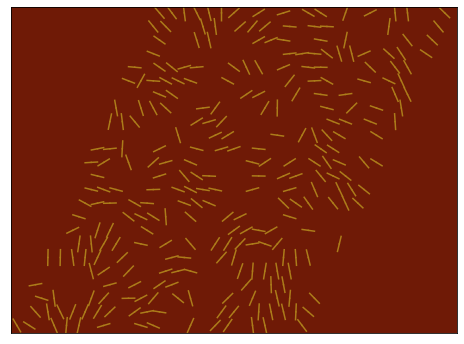

In [ ]:
plt = lm.plot_config_mica_hex()
plt.show()

# GPim Explorarition


In [ ]:
#@title Helper functions { form-width: "10%" }
def plot_exploration_results(func_val, gp_pred):
    for i, (func, pred) in enumerate(zip(func_val, gp_pred)):
        print('Step {}'.format(i+1))
        _, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
        ax1.imshow(func, origin='bottom')
        ax2.imshow(pred[0], origin='bottom')
        ax3.imshow(pred[1], origin='bottom')
        ax1.set_title('Input')
        ax2.set_title("GP prediction")
        ax3.set_title("Uncertainty")
        plt.show()

def mask_edges(imgdata, dist_edge):
    e1, e2 = imgdata.shape
    mask = np.ones((e1, e2)) * np.nan
    mask[dist_edge[0]:e1-dist_edge[0],
         dist_edge[1]:e2-dist_edge[1]] = 1
    return mask

In [ ]:
#idx = [A,C] as a list 
# Make sure of the scaling between grid size and the input vector.
# Right now the grid size is 40 and they are scaled to [-200,0] for A and [0,50] for C

# Also the number of Monte Carlo steps can be edited in the input arguments
# Line 39 takes the input on which the correlation is to be evaluated. The size of the...
# ... array is [N,m,m], where N is the number of MC steps used to calculated statistics and
# [m,m] is the size of the lattice
grid_size = 40
def gpim_function(idx, mc_steps = 5):
    A = (idx[0]*5)-200
    B = 0
    C = idx[1]*(5/4)
    D = 0
    M = 0
    r_prime = 0.33
    up_bias = 1
    dr_bias = 1
    dl_bias = 1
    mu_l = 0
    mu_w = 0
    eta = 1
    a_prime = 0
    b_prime = 0
    c_prime = 0
    a_double_prime = 0

    lm = LatticeModel(2,2,mc_alg='canonical',n_lipids=288,orientation_sel='random')
    lm.parameterize([A,B,C,D,M,r_prime,up_bias,dr_bias,
                    dl_bias,mu_l,mu_w,eta,a_prime,b_prime,c_prime,a_double_prime])
    # Number of Monte Carlo steps in the line below
    lm.monte_carlo(mc_steps)

    # This calculates the local correlation cofficient of any array that is
    # in the shape [N,m,m], where N is the number of steps used for data collection after equilibriation
    # and m is the size of the lattice
    # dist refers to the radius of the mask cosidered for obtaining correlation
    #For example, NN are at a distance of 1 while NNN are a distance of sqrt(2)
    correlation = lm.get_local_correlation(lm.species_lattice_log[-3:], dist = 2.0, scaling = False) #-3 corresponds to last 3 steps

    return np.mean(correlation)


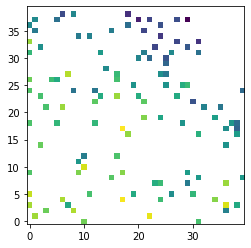

In [ ]:
# Initialization of Bayesian Optimization (seed points)
Z_sparse = np.ones((grid_size, grid_size)) * np.nan

idx = np.random.randint(0, grid_size, size=(120, 2))
for i in idx:
    Z_sparse[tuple(i)] = gpim_function(i) 

plt.imshow(Z_sparse, origin='bottom')

In [ ]:
import random

def acq(gpmodel, X_full, X_sparse):  # leave it as is
    mean, sd = gpmodel.predict(X_full, verbose=0) # leave it as is
    #acq = np.exp(-(mean-0.7)**2)
    acq = sd
    return acq, (mean, sd)  # leave it as is

def acq2(gpmodel, X_full, X_sparse):  # leave it as is
    mean, sd = gpmodel.predict(X_full, verbose=0) # leave it as is
    random_bit = random.getrandbits(1)
    random_boolean = bool(random_bit)
    if random_boolean:
      #acq = np.exp(-(mean-0.7)**2)
      acq = mean
    else:
      acq = sd
    return acq, (mean, sd)  # leave it as is 

In [ ]:
Z_mask = mask_edges(np.ones_like(Z_sparse), (2, 2))

In [ ]:
X_full = gpim.utils.get_full_grid(Z_sparse)
X_sparse= gpim.utils.get_sparse_grid(Z_sparse)
exp_steps = 300
# Initialize Bayesian optimizer with an 'expected improvement' acquisition function
boptim = gpim.boptimizer(
    X_sparse, Z_sparse, X_full, 
    gpim_function, acquisition_function= 'cb',
    kernel = 'Matern52',
    lenghtscale = ((0,5),(0,5)),
    dscale = 5,
    mask=Z_mask,
    exploration_steps=exp_steps,
    use_gpu=False, verbose=1)
# Run Bayesian optimization
boptim.run()


Exploration step 1 / 300
Model training...
average time per iteration: 0.0059 s
training completed in 5.49 s
Final parameter values:
 amp: 9.9988, lengthscale: [19.9725 19.9233], noise: 0.2329623
Computing acquisition function...



Model training...
average time per iteration: 0.005699999999999999 s
training completed in 5.64 s
Final parameter values:
 amp: 10.0, lengthscale: [19.9999 19.9998], noise: 0.2336444

Exploration step 2 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0058 s
training completed in 5.61 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2326141

Exploration step 3 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0058 s
training completed in 5.5 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.231526

Exploration step 4 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.005699999999999999 s
training completed in 5.57 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2294348

Exploration step 5 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.006 s
training completed in 5.66 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2275856

Exploration step 6 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.006 s
training completed in 5.69 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2352902

Exploration step 7 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0062 s
training completed in 5.75 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2332219

Exploration step 8 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0064 s
training completed in 5.72 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2431546

Exploration step 9 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0066 s
training completed in 5.95 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2482081

Exploration step 10 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.006 s
training completed in 5.78 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2500982

Exploration step 11 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.006 s
training completed in 5.96 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2489579

Exploration step 12 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0060999999999999995 s
training completed in 5.91 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2469577

Exploration step 13 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0063 s
training completed in 6.13 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2485786

Exploration step 14 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0062 s
training completed in 6.05 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2462522

Exploration step 15 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0062 s
training completed in 6.14 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2439592

Exploration step 16 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0063 s
training completed in 6.05 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2432908

Exploration step 17 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0063 s
training completed in 6.01 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.241381

Exploration step 18 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0064 s
training completed in 6.17 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2394491

Exploration step 19 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0064 s
training completed in 6.13 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2375424

Exploration step 20 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.006500000000000001 s
training completed in 6.22 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2395899

Exploration step 21 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.006500000000000001 s
training completed in 6.35 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2388081

Exploration step 22 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.006500000000000001 s
training completed in 6.25 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2432244

Exploration step 23 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0068000000000000005 s
training completed in 6.4 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2475842

Exploration step 24 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0066 s
training completed in 6.4 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.245687

Exploration step 25 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.006500000000000001 s
training completed in 6.42 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2436911

Exploration step 26 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0064 s
training completed in 6.34 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2415314

Exploration step 27 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0066 s
training completed in 6.4 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2403186

Exploration step 28 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0066 s
training completed in 6.4 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2409231

Exploration step 29 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0074 s
training completed in 6.55 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2400359

Exploration step 30 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0068000000000000005 s
training completed in 6.42 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2393777

Exploration step 31 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.006999999999999999 s
training completed in 6.49 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2372815

Exploration step 32 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0068000000000000005 s
training completed in 6.63 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2353037

Exploration step 33 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0069 s
training completed in 6.72 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2336364

Exploration step 34 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0069 s
training completed in 6.58 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2371077

Exploration step 35 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0070999999999999995 s
training completed in 6.82 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2352167

Exploration step 36 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.006999999999999999 s
training completed in 6.79 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2364992

Exploration step 37 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0072 s
training completed in 6.82 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.235118

Exploration step 38 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.006999999999999999 s
training completed in 6.89 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2332427

Exploration step 39 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.006999999999999999 s
training completed in 6.82 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2314016

Exploration step 40 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0076 s
training completed in 6.97 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2296173

Exploration step 41 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0072 s
training completed in 6.97 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2286265

Exploration step 42 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0070999999999999995 s
training completed in 6.85 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2268628

Exploration step 43 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0070999999999999995 s
training completed in 7.09 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2255572

Exploration step 44 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0076 s
training completed in 7.21 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.223869

Exploration step 45 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0074 s
training completed in 7.26 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2221921

Exploration step 46 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0073 s
training completed in 7.16 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2209749

Exploration step 47 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0076 s
training completed in 7.28 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2209918

Exploration step 48 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0078000000000000005 s
training completed in 7.36 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2200488

Exploration step 49 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0079 s
training completed in 7.45 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2186495

Exploration step 50 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0074 s
training completed in 7.33 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2173365

Exploration step 51 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0077 s
training completed in 7.32 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2159075

Exploration step 52 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0077 s
training completed in 7.39 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2172703

Exploration step 53 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0079 s
training completed in 7.56 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2177507

Exploration step 54 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0077 s
training completed in 7.42 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2181063

Exploration step 55 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0079 s
training completed in 7.67 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2206261

Exploration step 56 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0089 s
training completed in 7.87 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2231625

Exploration step 57 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.008 s
training completed in 7.68 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2217704

Exploration step 58 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0078000000000000005 s
training completed in 7.79 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.230461

Exploration step 59 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0083 s
training completed in 7.95 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.230644

Exploration step 60 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0084 s
training completed in 7.85 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2294053

Exploration step 61 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.008 s
training completed in 7.89 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2189898

Exploration step 62 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0084 s
training completed in 8.0 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2176156

Exploration step 63 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.008 s
training completed in 7.82 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2236789

Exploration step 64 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0088 s
training completed in 8.14 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2221606

Exploration step 65 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0084 s
training completed in 8.2 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2263811

Exploration step 66 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0083 s
training completed in 8.31 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2250706

Exploration step 67 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0092 s
training completed in 8.21 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2235749

Exploration step 68 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0085 s
training completed in 8.35 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2254081

Exploration step 69 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.010700000000000001 s
training completed in 10.52 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2239011

Exploration step 70 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.010700000000000001 s
training completed in 10.39 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2231757

Exploration step 71 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0106 s
training completed in 10.59 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2269387

Exploration step 72 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0111 s
training completed in 10.71 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2262367

Exploration step 73 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.011000000000000001 s
training completed in 10.67 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2261529

Exploration step 74 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.011000000000000001 s
training completed in 11.02 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2246565

Exploration step 75 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.011000000000000001 s
training completed in 10.95 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.223596

Exploration step 76 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.011399999999999999 s
training completed in 11.05 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.226648

Exploration step 77 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0115 s
training completed in 11.13 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2258665

Exploration step 78 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0118 s
training completed in 11.41 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2248246

Exploration step 79 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0113 s
training completed in 11.24 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2240424

Exploration step 80 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0116 s
training completed in 11.4 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2230964

Exploration step 81 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0115 s
training completed in 11.33 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2218405

Exploration step 82 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.011899999999999999 s
training completed in 11.57 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2204666

Exploration step 83 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0121 s
training completed in 11.71 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2217609

Exploration step 84 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0118 s
training completed in 11.56 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2203691

Exploration step 85 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.012199999999999999 s
training completed in 11.81 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2190219

Exploration step 86 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0123 s
training completed in 12.05 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2179098

Exploration step 87 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.012 s
training completed in 11.96 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2198802

Exploration step 88 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0123 s
training completed in 12.1 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2220532

Exploration step 89 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0123 s
training completed in 12.2 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.220924

Exploration step 90 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0128 s
training completed in 12.35 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2232349

Exploration step 91 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0126 s
training completed in 12.27 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2220345

Exploration step 92 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0121 s
training completed in 11.96 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2210167

Exploration step 93 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0126 s
training completed in 12.17 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2261792

Exploration step 94 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0125 s
training completed in 12.18 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2256374

Exploration step 95 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0126 s
training completed in 12.27 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2261448

Exploration step 96 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0125 s
training completed in 12.3 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2251834

Exploration step 97 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0125 s
training completed in 12.28 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2250546

Exploration step 98 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0129 s
training completed in 12.64 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2260374

Exploration step 99 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.013000000000000001 s
training completed in 12.73 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2263296

Exploration step 100 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0128 s
training completed in 12.68 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.225092

Exploration step 101 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0131 s
training completed in 12.76 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.225463

Exploration step 102 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0131 s
training completed in 12.54 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2251369

Exploration step 103 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.013600000000000001 s
training completed in 12.92 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2248096

Exploration step 104 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.013300000000000001 s
training completed in 12.95 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2246476

Exploration step 105 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.013600000000000001 s
training completed in 13.01 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2235012

Exploration step 106 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0128 s
training completed in 12.74 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2227675

Exploration step 107 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0132 s
training completed in 13.08 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2217686

Exploration step 108 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0139 s
training completed in 13.49 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2255576

Exploration step 109 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0141 s
training completed in 13.44 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2245945

Exploration step 110 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0137 s
training completed in 13.24 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.223888

Exploration step 111 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0139 s
training completed in 13.57 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2245408

Exploration step 112 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0141 s
training completed in 13.67 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2247458

Exploration step 113 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0141 s
training completed in 13.77 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.223576

Exploration step 114 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0141 s
training completed in 13.58 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2224952

Exploration step 115 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0147 s
training completed in 14.03 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2215377

Exploration step 116 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0144 s
training completed in 14.02 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2240569

Exploration step 117 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.014499999999999999 s
training completed in 14.25 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2229246

Exploration step 118 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.014199999999999999 s
training completed in 14.08 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2225496

Exploration step 119 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0147 s
training completed in 14.39 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2230983

Exploration step 120 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0152 s
training completed in 14.51 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2219711

Exploration step 121 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0149 s
training completed in 14.63 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2216646

Exploration step 122 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0152 s
training completed in 14.9 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2233166

Exploration step 123 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0148 s
training completed in 14.53 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2224686

Exploration step 124 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0154 s
training completed in 14.82 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2213584

Exploration step 125 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0155 s
training completed in 14.97 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2203404

Exploration step 126 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0155 s
training completed in 15.24 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2216688

Exploration step 127 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0152 s
training completed in 14.97 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2218463

Exploration step 128 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0159 s
training completed in 15.35 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2210622

Exploration step 129 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0155 s
training completed in 15.29 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2242347

Exploration step 130 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0159 s
training completed in 15.54 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2265883

Exploration step 131 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0155 s
training completed in 15.17 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2443519

Exploration step 132 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.016 s
training completed in 15.69 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2431927

Exploration step 133 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0163 s
training completed in 15.97 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2420412

Exploration step 134 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0163 s
training completed in 16.06 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2409883

Exploration step 135 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0161 s
training completed in 16.01 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2400254

Exploration step 136 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0165 s
training completed in 16.09 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.23893

Exploration step 137 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0166 s
training completed in 16.27 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.237887

Exploration step 138 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0168 s
training completed in 16.59 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2368016

Exploration step 139 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0169 s
training completed in 16.32 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2359842

Exploration step 140 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0174 s
training completed in 16.66 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.241921

Exploration step 141 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0169 s
training completed in 16.61 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2408114

Exploration step 142 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0174 s
training completed in 16.93 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2397023

Exploration step 143 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0173 s
training completed in 16.76 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2390193

Exploration step 144 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0178 s
training completed in 17.19 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2383448

Exploration step 145 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0179 s
training completed in 17.56 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2373423

Exploration step 146 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0181 s
training completed in 17.54 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2371349

Exploration step 147 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0174 s
training completed in 17.16 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2362066

Exploration step 148 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.018000000000000002 s
training completed in 17.48 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2351626

Exploration step 149 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0178 s
training completed in 17.49 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2391405

Exploration step 150 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0181 s
training completed in 17.67 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2391105

Exploration step 151 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0175 s
training completed in 17.19 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2442587

Exploration step 152 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0181 s
training completed in 17.71 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2442216

Exploration step 153 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0181 s
training completed in 17.78 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2446865

Exploration step 154 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.018500000000000003 s
training completed in 17.99 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2436927

Exploration step 155 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0183 s
training completed in 17.75 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.24271

Exploration step 156 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0187 s
training completed in 18.35 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2460047

Exploration step 157 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.018600000000000002 s
training completed in 18.27 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2470378

Exploration step 158 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.019 s
training completed in 18.49 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2459932

Exploration step 159 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.018600000000000002 s
training completed in 18.42 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.245502

Exploration step 160 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.019 s
training completed in 18.68 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2451792

Exploration step 161 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.019299999999999998 s
training completed in 19.17 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2447169

Exploration step 162 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.019799999999999998 s
training completed in 19.19 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.243916

Exploration step 163 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0191 s
training completed in 18.99 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2429277

Exploration step 164 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0196 s
training completed in 19.43 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2427794

Exploration step 165 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0199 s
training completed in 19.39 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2418801

Exploration step 166 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0203 s
training completed in 19.86 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2410779

Exploration step 167 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0199 s
training completed in 19.32 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2400863

Exploration step 168 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0207 s
training completed in 19.86 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2393578

Exploration step 169 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.020499999999999997 s
training completed in 19.94 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2384566

Exploration step 170 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.021099999999999997 s
training completed in 20.43 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2374905

Exploration step 171 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0207 s
training completed in 20.2 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2381603

Exploration step 172 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0207 s
training completed in 20.52 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2376697

Exploration step 173 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0213 s
training completed in 20.78 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2423985

Exploration step 174 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0213 s
training completed in 21.14 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2445242

Exploration step 175 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0213 s
training completed in 21.03 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2452367

Exploration step 176 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0209 s
training completed in 20.52 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2444482

Exploration step 177 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0213 s
training completed in 21.01 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2441625

Exploration step 178 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0216 s
training completed in 21.22 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2442423

Exploration step 179 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0219 s
training completed in 21.53 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2442435

Exploration step 180 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0218 s
training completed in 21.35 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2444406

Exploration step 181 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.022000000000000002 s
training completed in 21.6 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2439236

Exploration step 182 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0217 s
training completed in 21.37 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2432661

Exploration step 183 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.022099999999999998 s
training completed in 21.71 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2433604

Exploration step 184 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0218 s
training completed in 21.38 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2424656

Exploration step 185 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0222 s
training completed in 21.74 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2420184

Exploration step 186 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0226 s
training completed in 22.06 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2411107

Exploration step 187 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.023399999999999997 s
training completed in 22.42 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2401846

Exploration step 188 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.022099999999999998 s
training completed in 21.85 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2393051

Exploration step 189 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0236 s
training completed in 22.45 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2396354

Exploration step 190 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0227 s
training completed in 22.61 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2394041

Exploration step 191 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0236 s
training completed in 23.03 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2386328

Exploration step 192 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0226 s
training completed in 22.36 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2382588

Exploration step 193 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.023399999999999997 s
training completed in 23.02 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2375689

Exploration step 194 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0232 s
training completed in 22.91 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2367093

Exploration step 195 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0241 s
training completed in 23.47 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2364107

Exploration step 196 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0233 s
training completed in 23.14 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2359091

Exploration step 197 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.024 s
training completed in 23.87 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2372251

Exploration step 198 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0245 s
training completed in 23.7 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2393771

Exploration step 199 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.025 s
training completed in 24.21 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2401885

Exploration step 200 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.025 s
training completed in 23.87 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2399155

Exploration step 201 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0248 s
training completed in 24.58 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2390818

Exploration step 202 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.025 s
training completed in 24.6 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2382397

Exploration step 203 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0256 s
training completed in 24.93 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2373941

Exploration step 204 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.024700000000000003 s
training completed in 24.46 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2365883

Exploration step 205 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0256 s
training completed in 25.14 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2360504

Exploration step 206 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0259 s
training completed in 25.25 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2352313

Exploration step 207 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.026000000000000002 s
training completed in 25.62 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.23861

Exploration step 208 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.026000000000000002 s
training completed in 25.71 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2389623

Exploration step 209 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0273 s
training completed in 26.37 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2385098

Exploration step 210 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0269 s
training completed in 26.53 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2378532

Exploration step 211 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0274 s
training completed in 26.72 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2377019

Exploration step 212 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.027200000000000002 s
training completed in 26.98 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2368634

Exploration step 213 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0273 s
training completed in 26.97 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2361835

Exploration step 214 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0279 s
training completed in 27.47 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2358296

Exploration step 215 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0281 s
training completed in 27.63 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2350436

Exploration step 216 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0271 s
training completed in 26.87 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2364962

Exploration step 217 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0301 s
training completed in 27.82 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2358789

Exploration step 218 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0285 s
training completed in 28.06 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2350691

Exploration step 219 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0286 s
training completed in 28.31 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2345813

Exploration step 220 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0279 s
training completed in 27.54 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.23414

Exploration step 221 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0286 s
training completed in 28.31 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2333378

Exploration step 222 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0291 s
training completed in 28.5 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2354966

Exploration step 223 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0286 s
training completed in 28.36 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2348026

Exploration step 224 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0287 s
training completed in 28.09 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2380193

Exploration step 225 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.028999999999999998 s
training completed in 28.56 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2378936

Exploration step 226 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0291 s
training completed in 28.86 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2371092

Exploration step 227 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0298 s
training completed in 29.43 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2369587

Exploration step 228 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0302 s
training completed in 28.95 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2364028

Exploration step 229 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0297 s
training completed in 29.12 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2356832

Exploration step 230 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0302 s
training completed in 29.6 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2403794

Exploration step 231 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0294 s
training completed in 29.02 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2401954

Exploration step 232 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.029900000000000003 s
training completed in 29.62 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2396328

Exploration step 233 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.029900000000000003 s
training completed in 29.44 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2390304

Exploration step 234 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0305 s
training completed in 29.89 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2382477

Exploration step 235 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0308 s
training completed in 29.78 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2377322

Exploration step 236 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0308 s
training completed in 29.92 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.237156

Exploration step 237 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.030699999999999998 s
training completed in 30.0 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2371879

Exploration step 238 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0297 s
training completed in 29.29 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2364272

Exploration step 239 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.03 s
training completed in 29.55 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2351952

Exploration step 240 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.030899999999999997 s
training completed in 30.41 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.234476

Exploration step 241 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0308 s
training completed in 30.53 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2337348

Exploration step 242 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.031 s
training completed in 30.42 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2343224

Exploration step 243 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.031400000000000004 s
training completed in 30.99 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2336973

Exploration step 244 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0317 s
training completed in 31.33 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2335506

Exploration step 245 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.030600000000000002 s
training completed in 30.28 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2340686

Exploration step 246 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0322 s
training completed in 31.13 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2339797

Exploration step 247 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0313 s
training completed in 30.87 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2343644

Exploration step 248 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0317 s
training completed in 31.42 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2338123

Exploration step 249 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0315 s
training completed in 31.0 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2331443

Exploration step 250 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.031400000000000004 s
training completed in 30.84 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2331474

Exploration step 251 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0321 s
training completed in 31.65 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2326443

Exploration step 252 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0322 s
training completed in 31.58 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2321519

Exploration step 253 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0329 s
training completed in 32.44 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2314188

Exploration step 254 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.032400000000000005 s
training completed in 31.46 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2312724

Exploration step 255 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0335 s
training completed in 32.41 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2326677

Exploration step 256 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.032799999999999996 s
training completed in 32.33 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2321455

Exploration step 257 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0332 s
training completed in 32.83 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2314391

Exploration step 258 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0326 s
training completed in 32.22 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2312941

Exploration step 259 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0326 s
training completed in 32.04 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2309963

Exploration step 260 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0347 s
training completed in 33.63 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2330351

Exploration step 261 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0336 s
training completed in 33.38 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2331268

Exploration step 262 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0349 s
training completed in 34.14 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2347422

Exploration step 263 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.034300000000000004 s
training completed in 33.24 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.234345

Exploration step 264 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0351 s
training completed in 34.18 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2337072

Exploration step 265 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0349 s
training completed in 34.55 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2339561

Exploration step 266 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0355 s
training completed in 35.07 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2334593

Exploration step 267 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0344 s
training completed in 33.99 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2328978

Exploration step 268 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0354 s
training completed in 34.92 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2322574

Exploration step 269 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.035699999999999996 s
training completed in 35.15 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2317924

Exploration step 270 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.035699999999999996 s
training completed in 35.42 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2311349

Exploration step 271 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0354 s
training completed in 34.8 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.230451

Exploration step 272 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0362 s
training completed in 35.59 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2306954

Exploration step 273 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.036699999999999997 s
training completed in 36.02 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2300748

Exploration step 274 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0377 s
training completed in 36.74 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2309203

Exploration step 275 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0363 s
training completed in 35.66 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2302077

Exploration step 276 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0375 s
training completed in 36.84 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2319139

Exploration step 277 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0379 s
training completed in 36.94 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2318331

Exploration step 278 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.037599999999999995 s
training completed in 37.44 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2327739

Exploration step 279 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0375 s
training completed in 36.57 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.232901

Exploration step 280 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0384 s
training completed in 37.86 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2335697

Exploration step 281 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0383 s
training completed in 37.49 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2332622

Exploration step 282 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0391 s
training completed in 38.15 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2329657

Exploration step 283 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0382 s
training completed in 37.29 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2325183

Exploration step 284 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.037599999999999995 s
training completed in 37.46 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.232625

Exploration step 285 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0381 s
training completed in 37.4 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2321359

Exploration step 286 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0392 s
training completed in 38.7 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2320714

Exploration step 287 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.038900000000000004 s
training completed in 38.41 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2308147

Exploration step 288 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0388 s
training completed in 38.41 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2307113

Exploration step 289 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0391 s
training completed in 38.48 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2307456

Exploration step 290 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0393 s
training completed in 38.55 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2306343

Exploration step 291 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.038900000000000004 s
training completed in 38.56 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2311331

Exploration step 292 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0383 s
training completed in 38.69 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2305738

Exploration step 293 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0394 s
training completed in 38.97 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2304793

Exploration step 294 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.038900000000000004 s
training completed in 39.01 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2305272

Exploration step 295 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0395 s
training completed in 38.74 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2324859

Exploration step 296 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0395 s
training completed in 38.54 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.234067

Exploration step 297 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0392 s
training completed in 38.62 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2339051

Exploration step 298 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0395 s
training completed in 38.73 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2327776

Exploration step 299 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.0394 s
training completed in 38.61 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2332928

Exploration step 300 / 300
Computing acquisition function...



Model training...
average time per iteration: 0.04 s
training completed in 38.83 s
Final parameter values:
 amp: 10.0, lengthscale: [20. 20.], noise: 0.2327429

Exploration completed


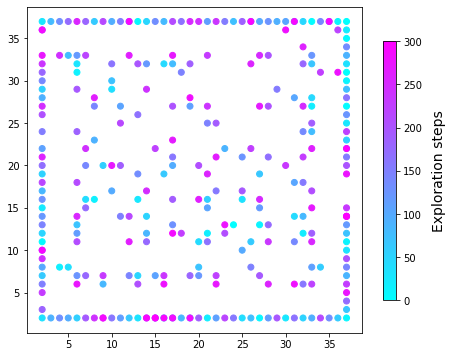

In [ ]:
gpim.utils.plot_query_points(boptim.indices_all, plot_lines=False)

Step 1


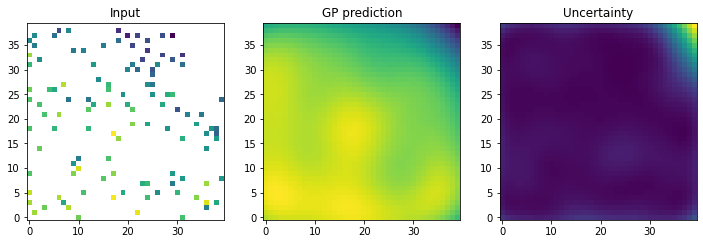

Step 2


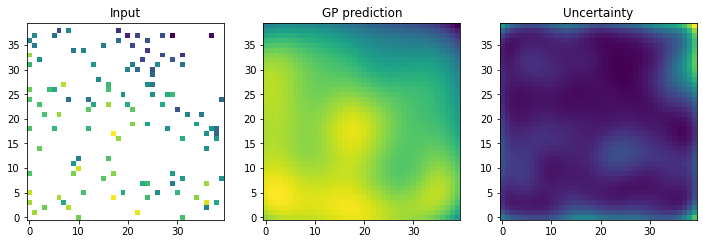

Step 3


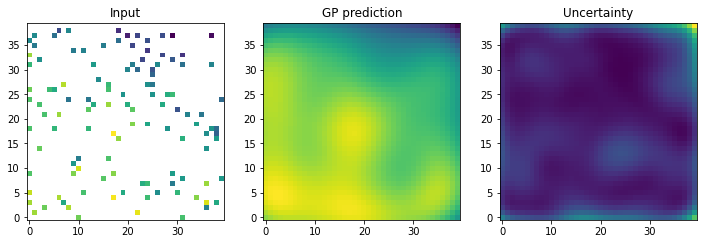

Step 4


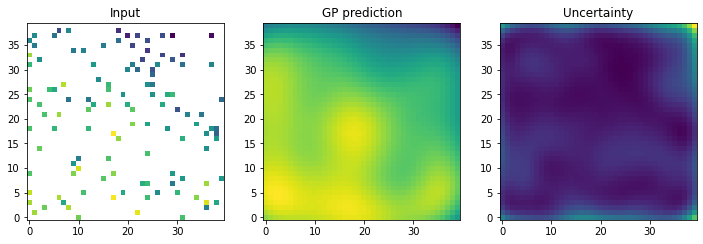

Step 5


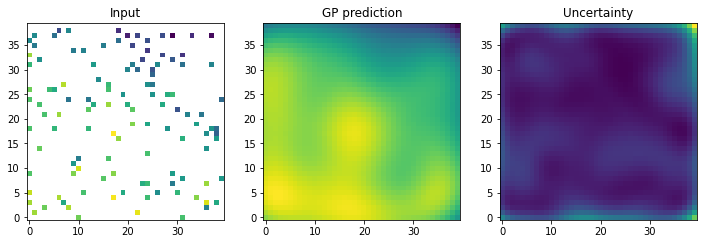

Step 6


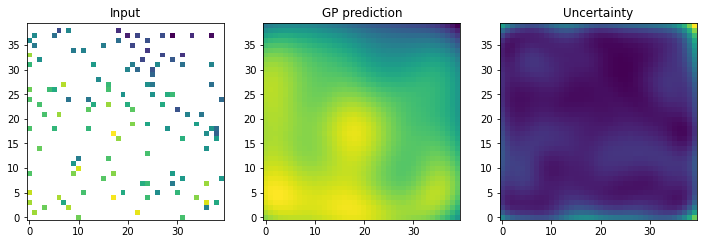

Step 7


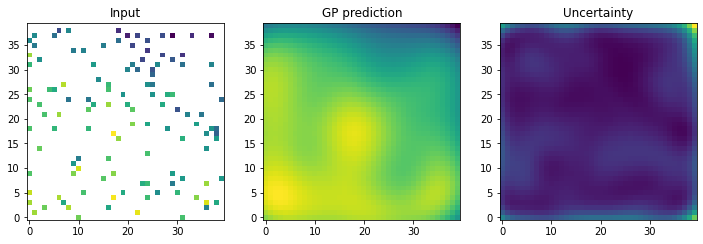

Step 8


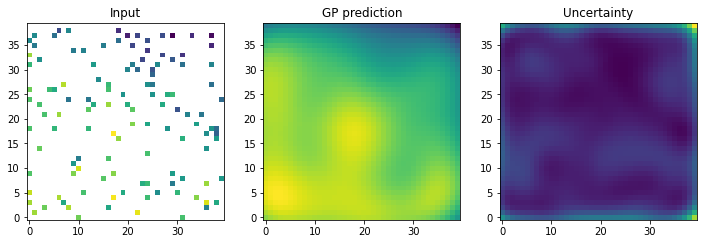

Step 9


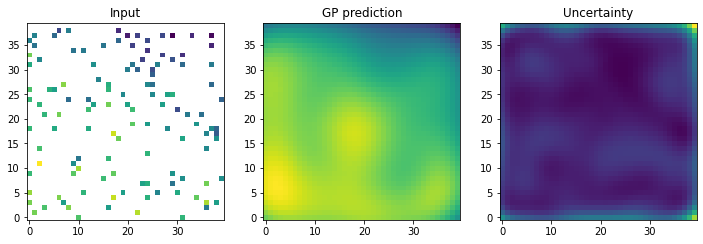

Step 10


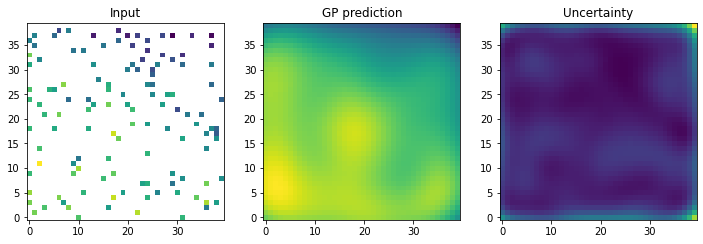

Step 11


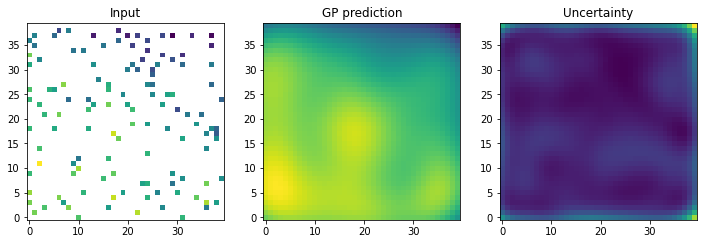

Step 12


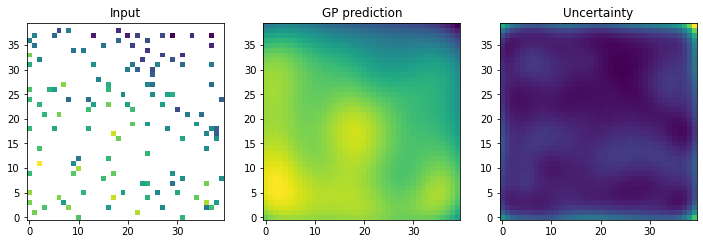

Step 13


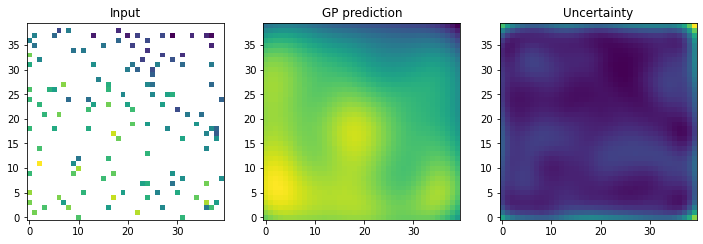

Step 14


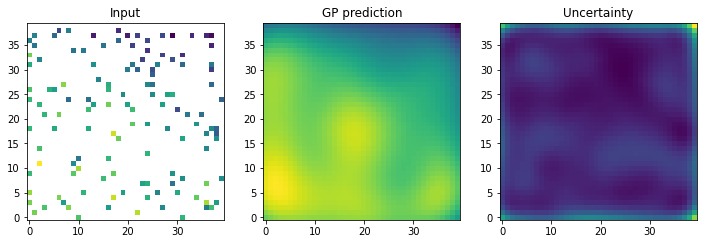

Step 15


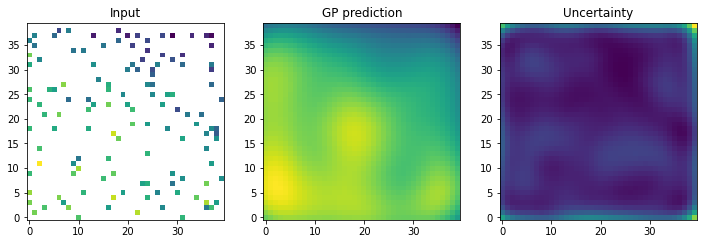

Step 16


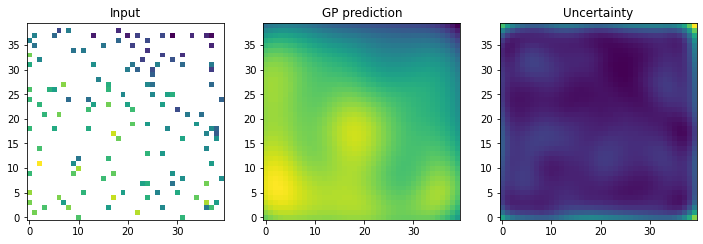

Step 17


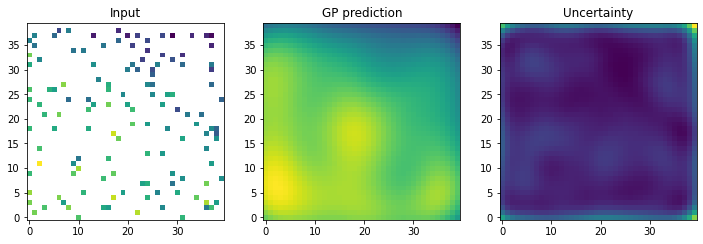

Step 18


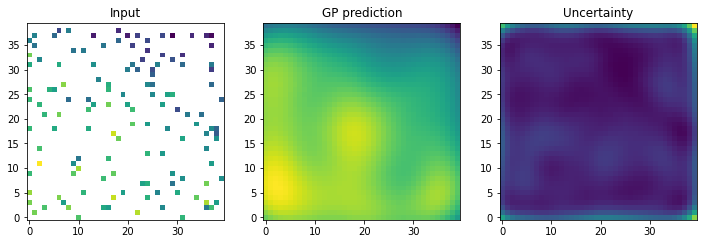

Step 19


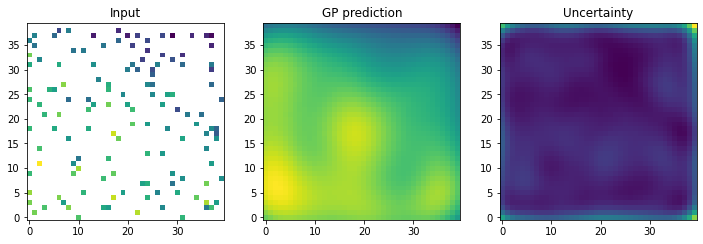

Step 20


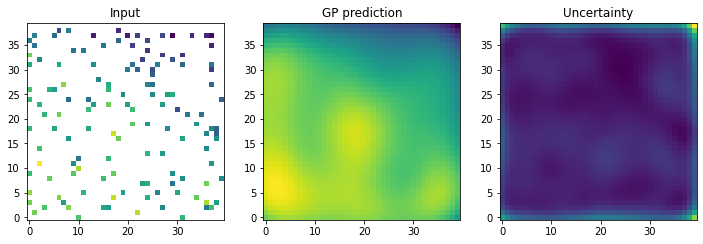

Step 21


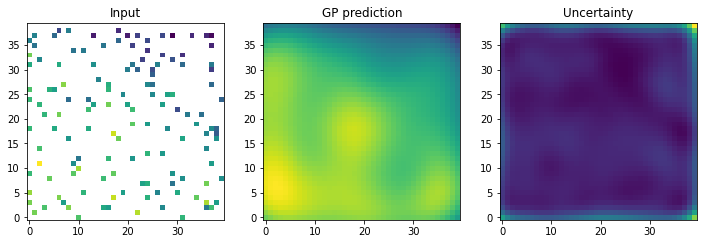

Step 22


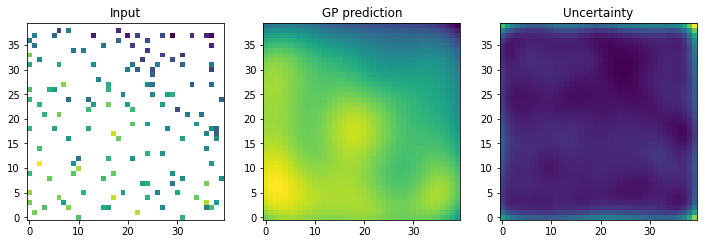

Step 23


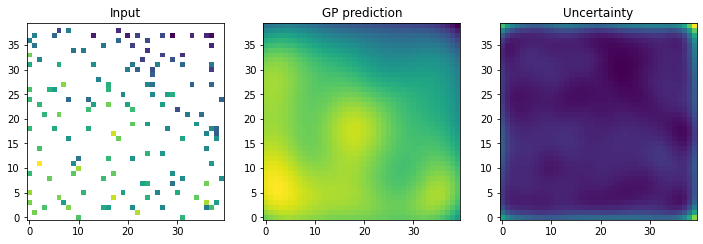

Step 24


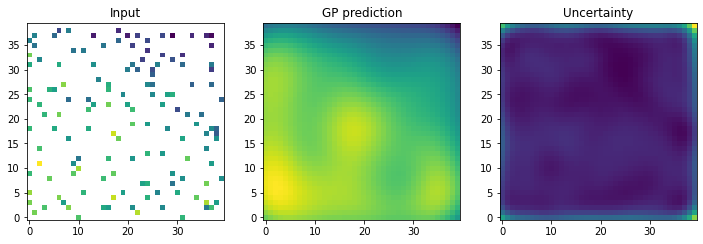

Step 25


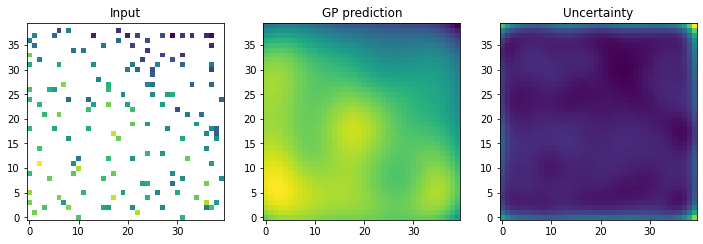

Step 26


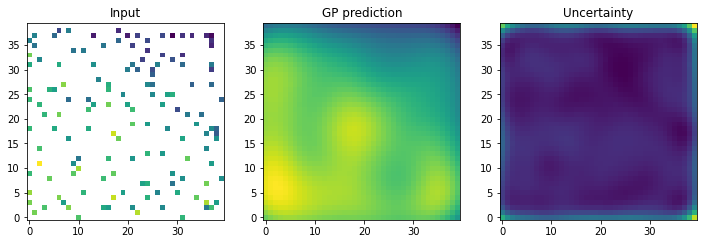

Step 27


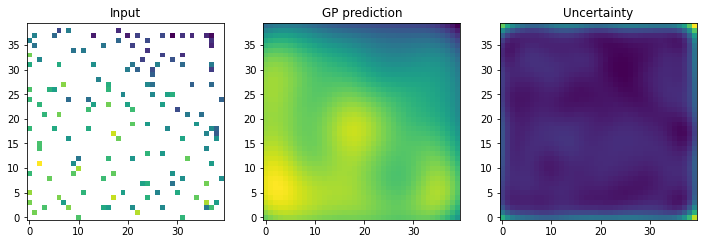

Step 28


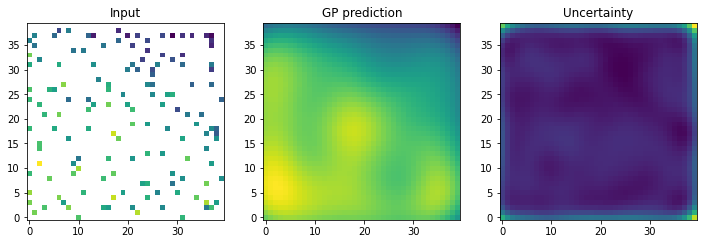

Step 29


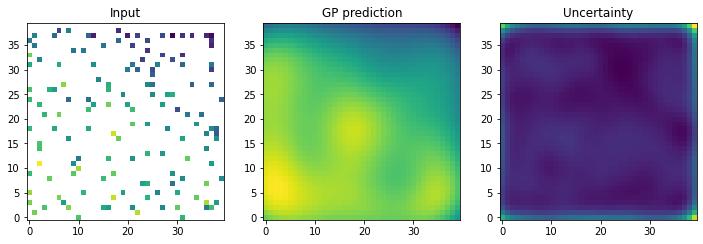

Step 30


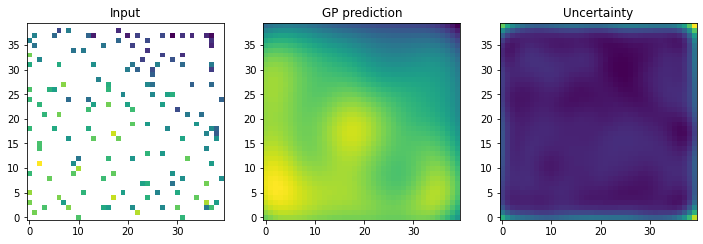

Step 31


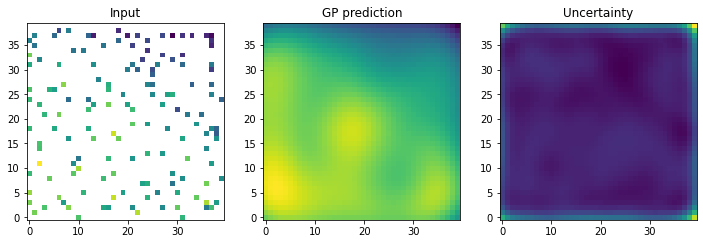

Step 32


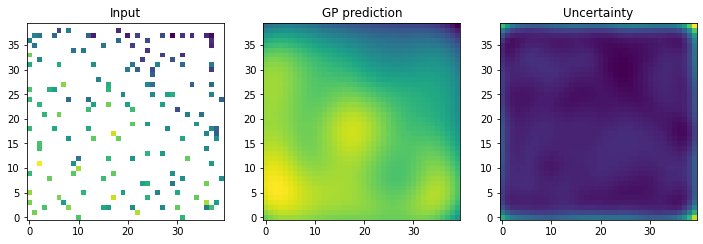

Step 33


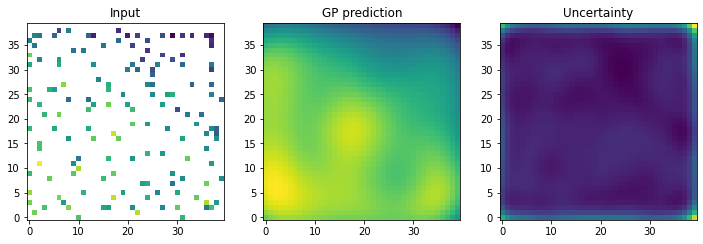

Step 34


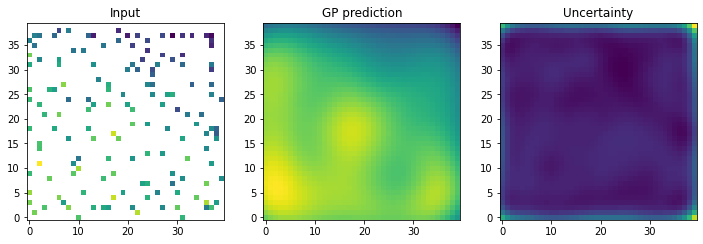

Step 35


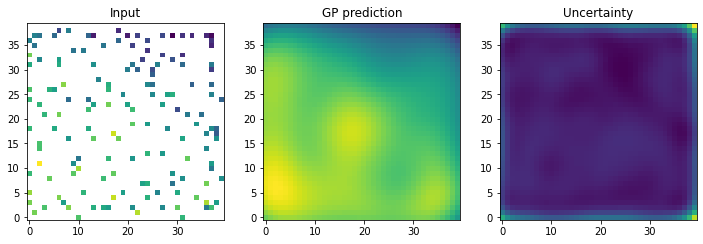

Step 36


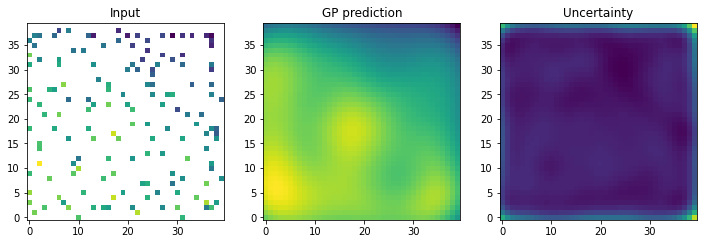

Step 37


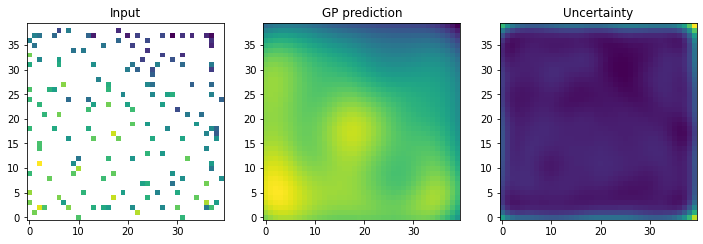

Step 38


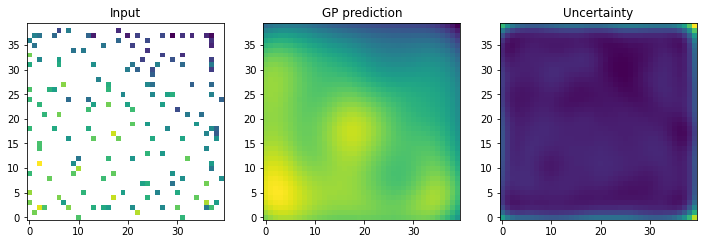

Step 39


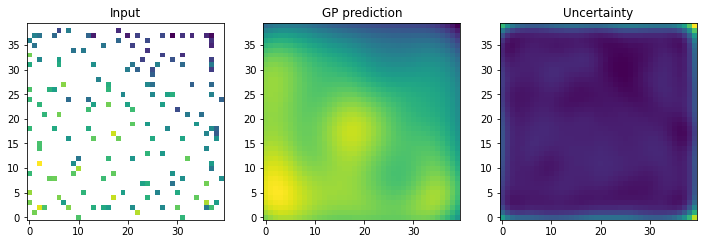

Step 40


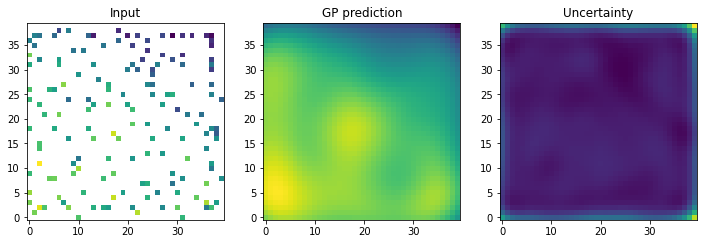

Step 41


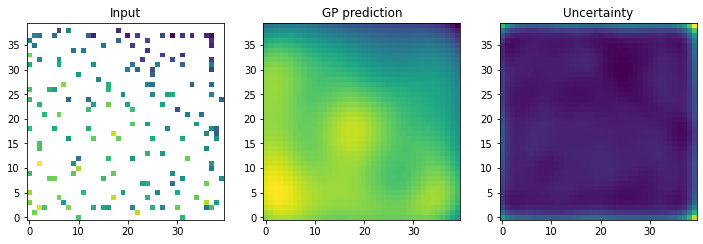

Step 42


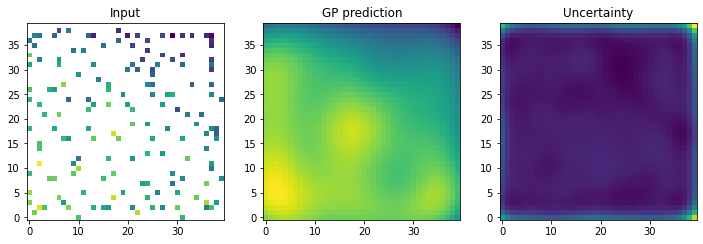

Step 43


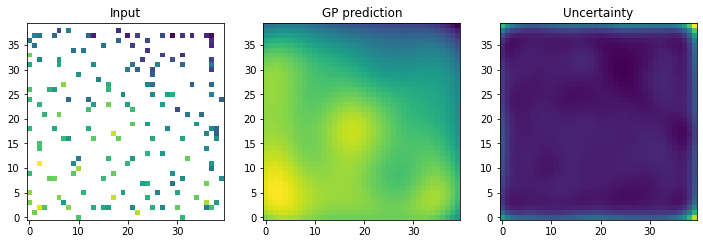

Step 44


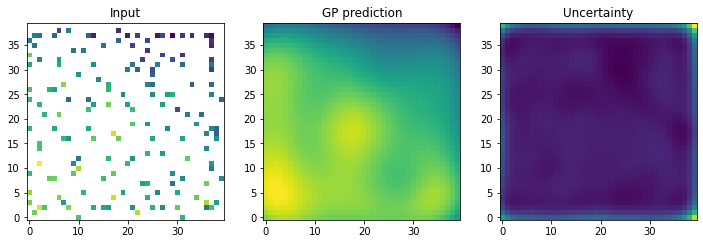

Step 45


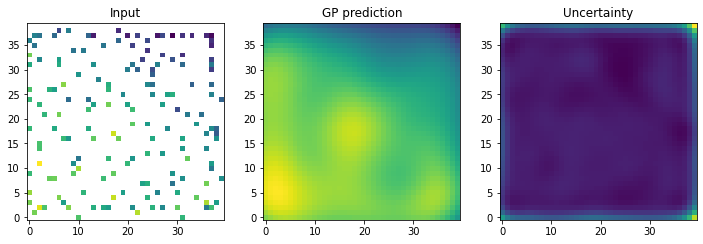

Step 46


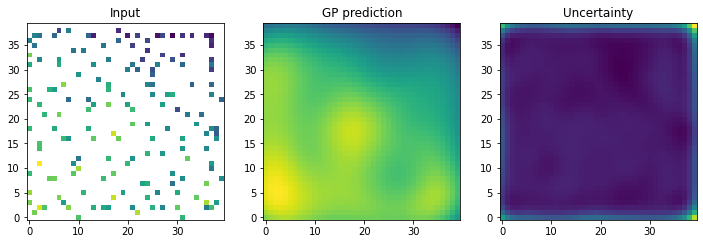

Step 47


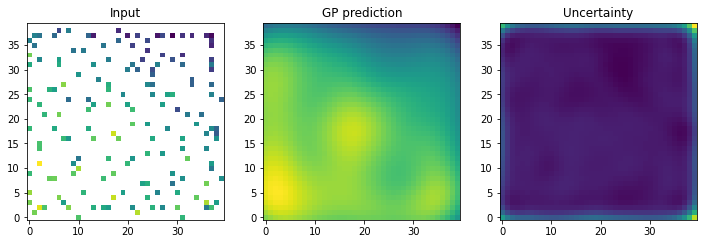

Step 48


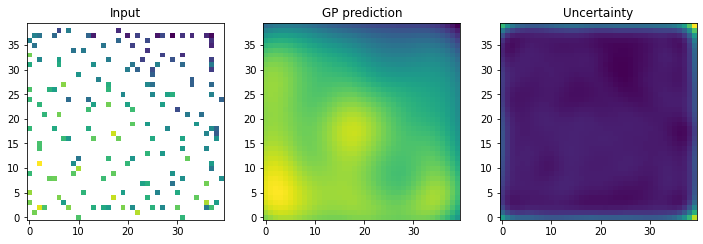

Step 49


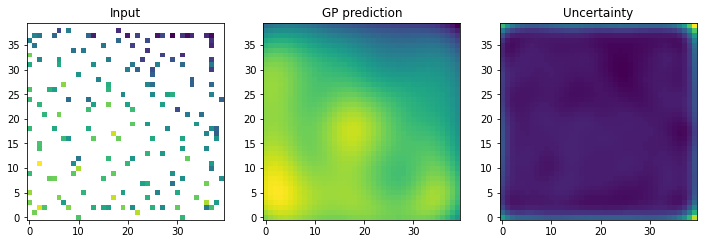

Step 50


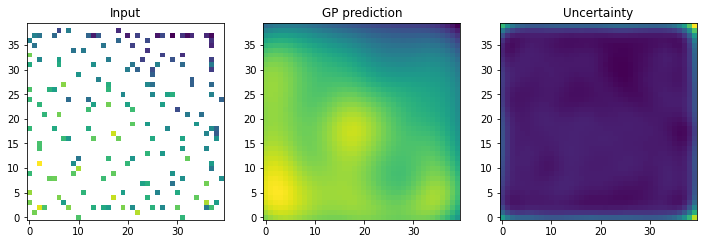

Step 51


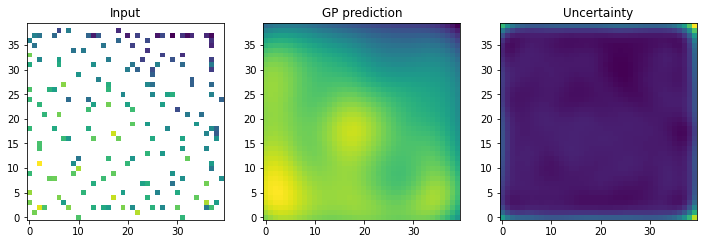

Step 52


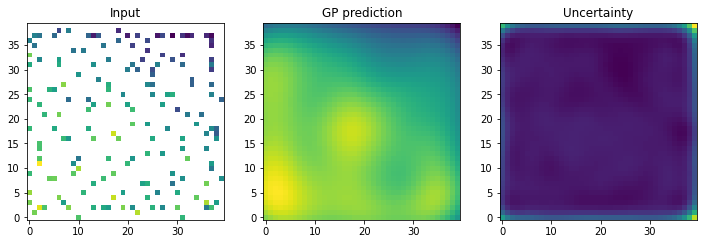

Step 53


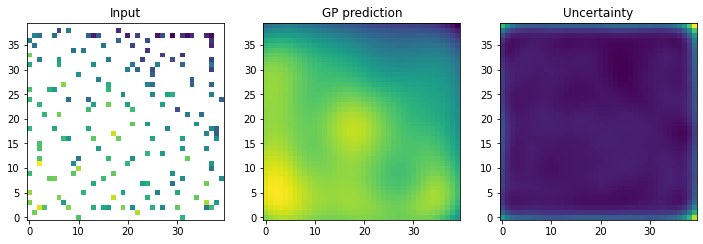

Step 54


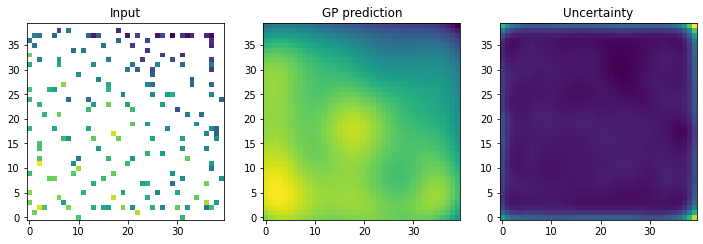

Step 55


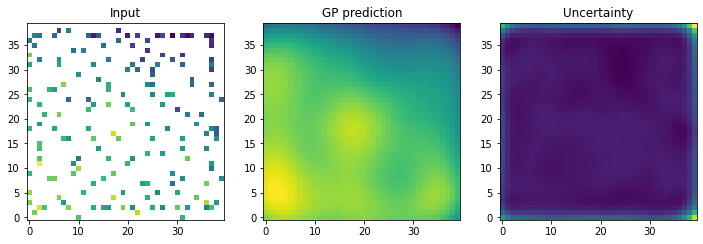

Step 56


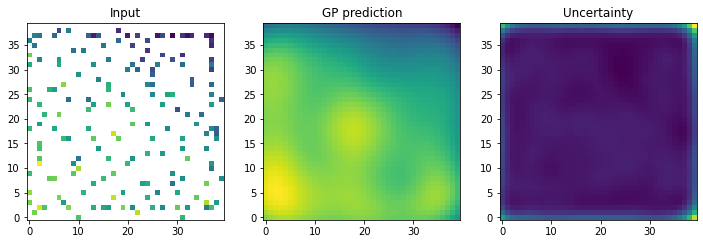

Step 57


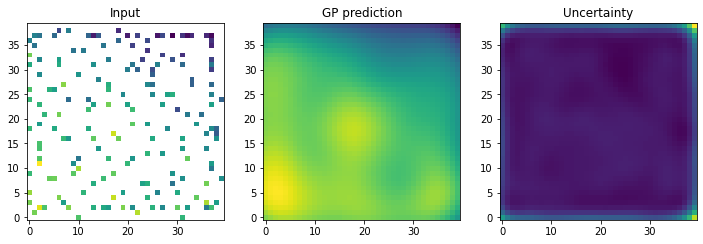

Step 58


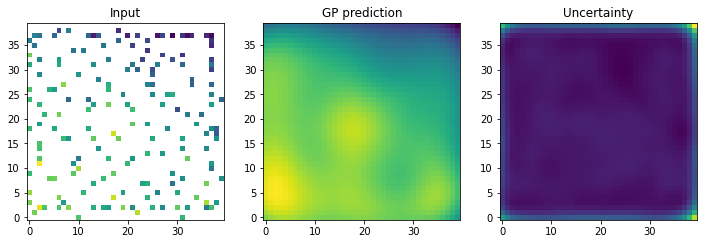

Step 59


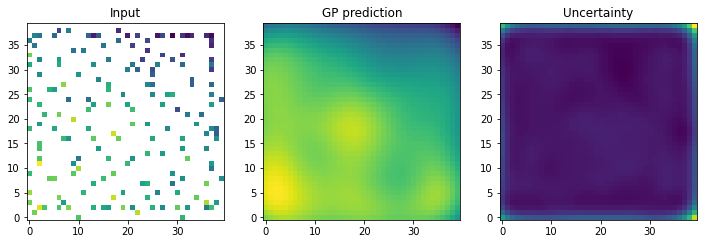

Step 60


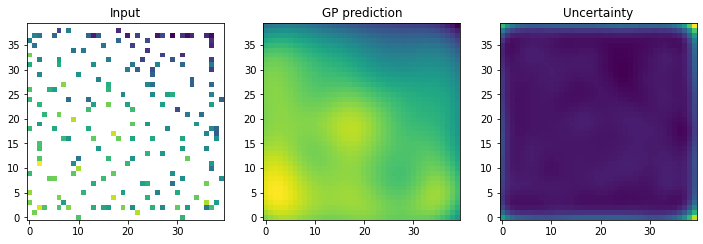

Step 61


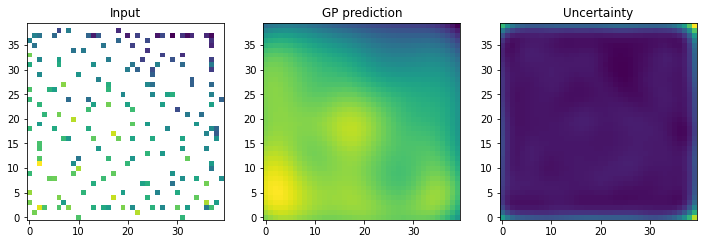

Step 62


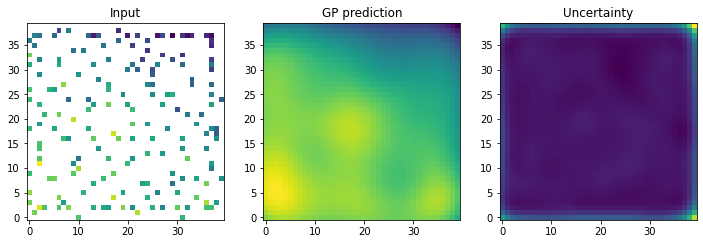

Step 63


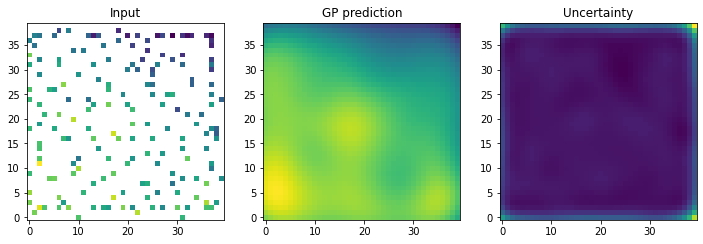

Step 64


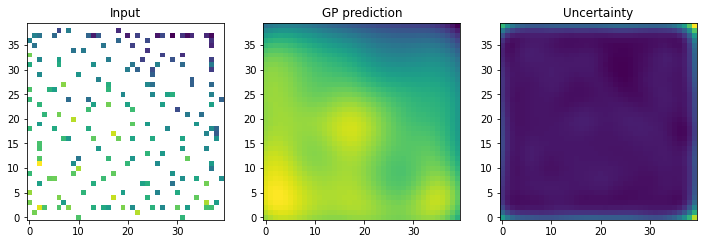

Step 65


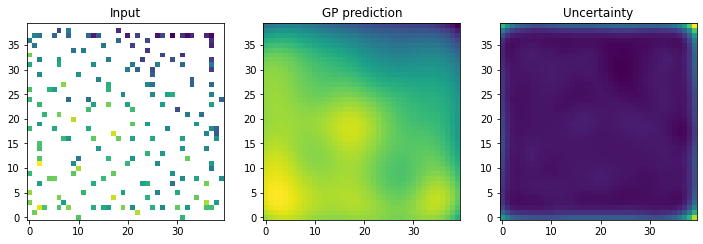

Step 66


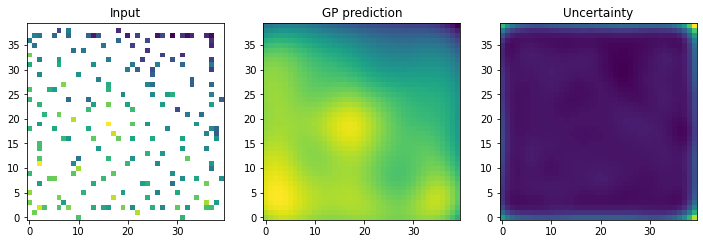

Step 67


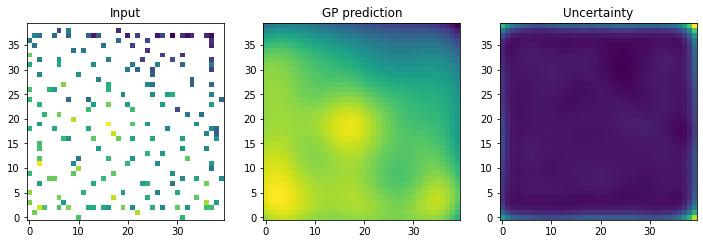

Step 68


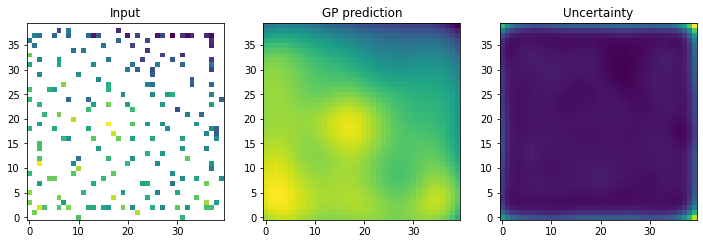

Step 69


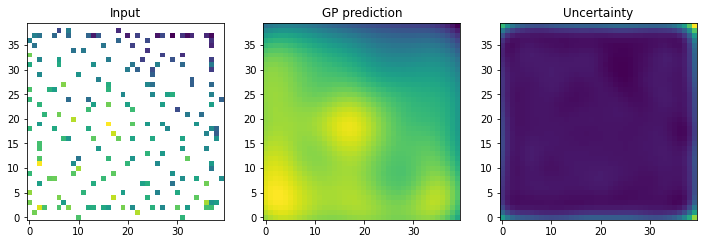

Step 70


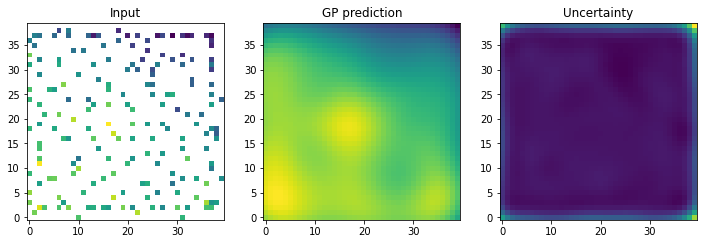

Step 71


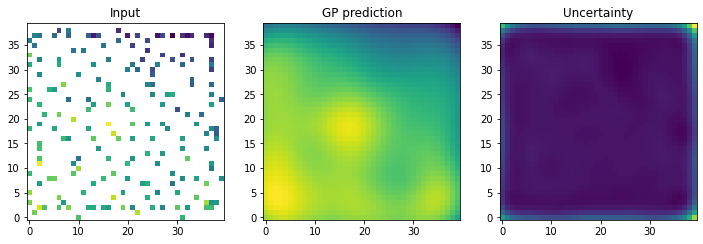

Step 72


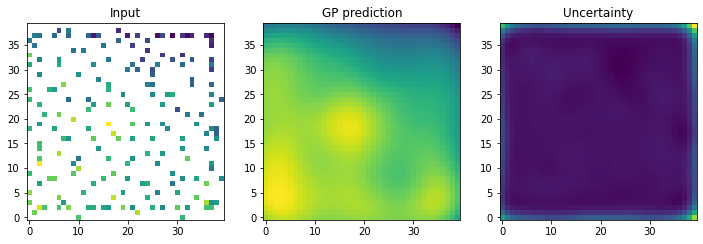

Step 73


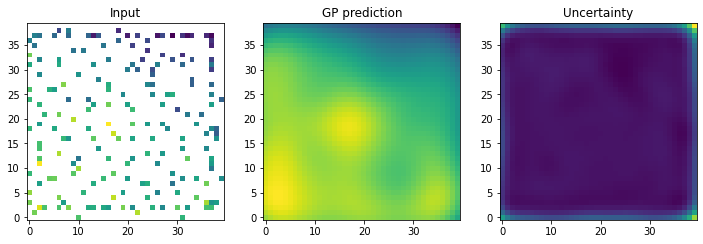

Step 74


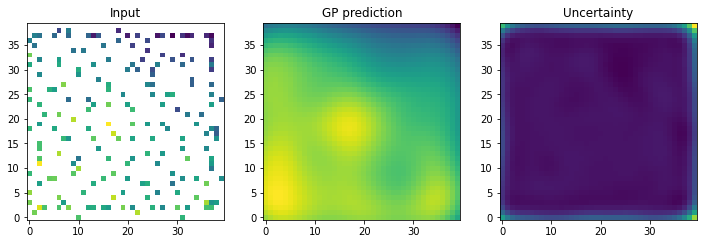

Step 75


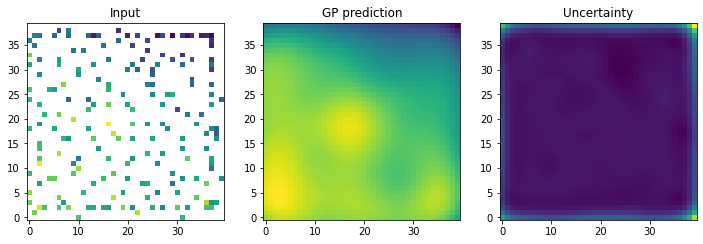

Step 76


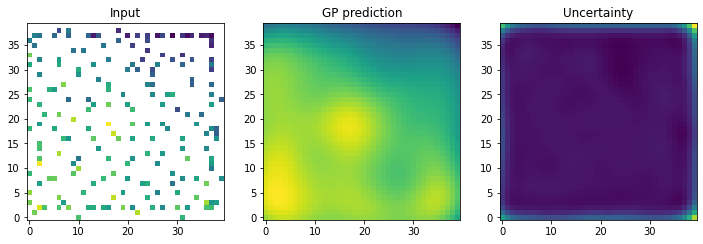

Step 77


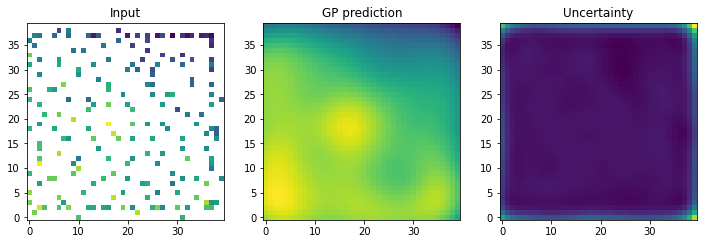

Step 78


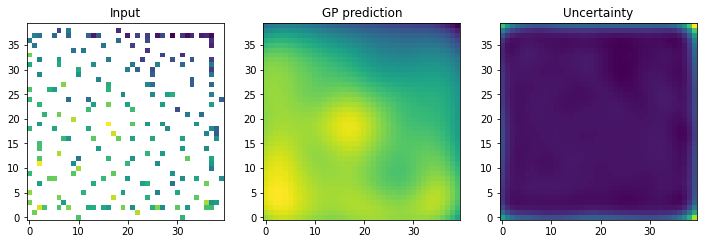

Step 79


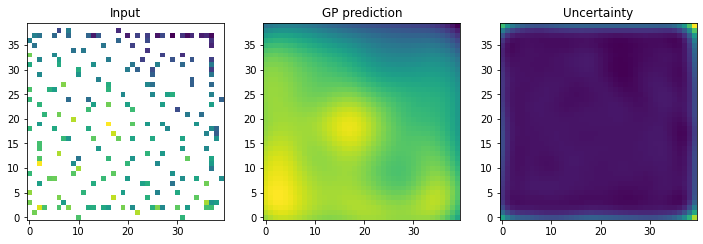

Step 80


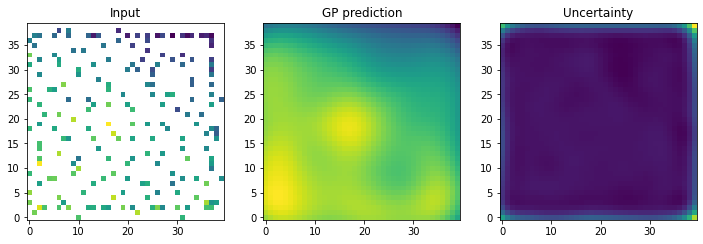

Step 81


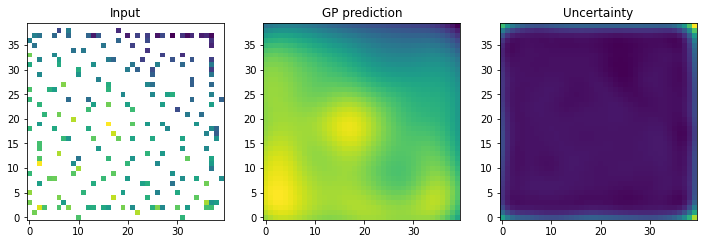

Step 82


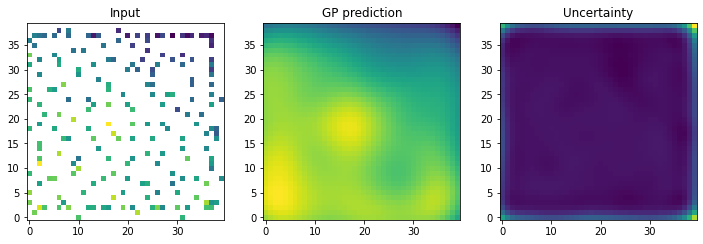

Step 83


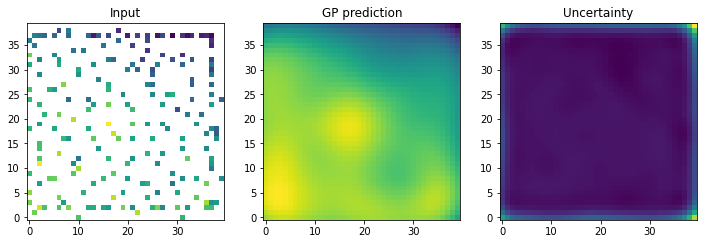

Step 84


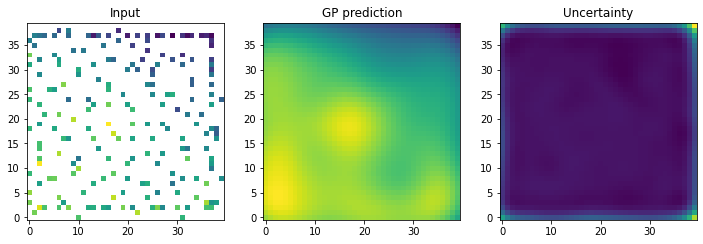

Step 85


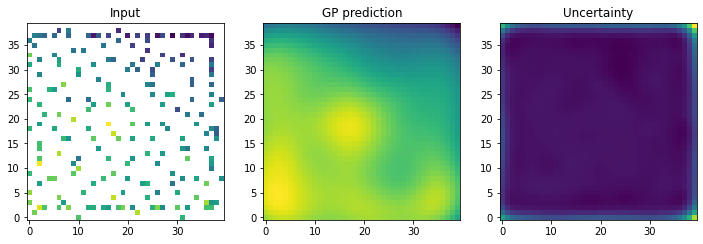

Step 86


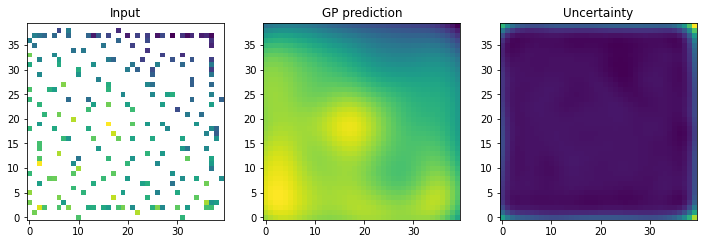

Step 87


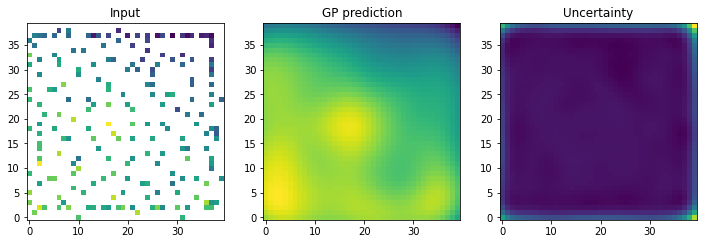

Step 88


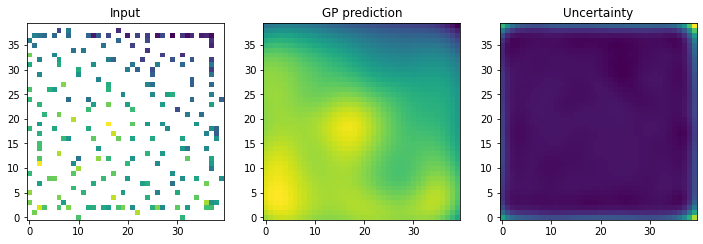

Step 89


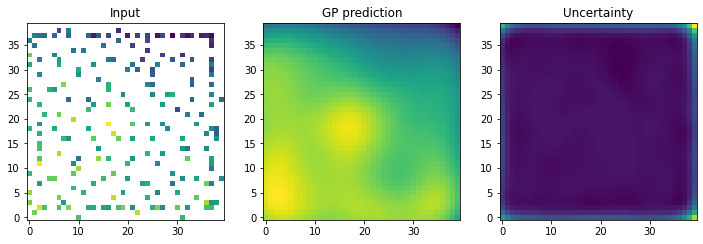

Step 90


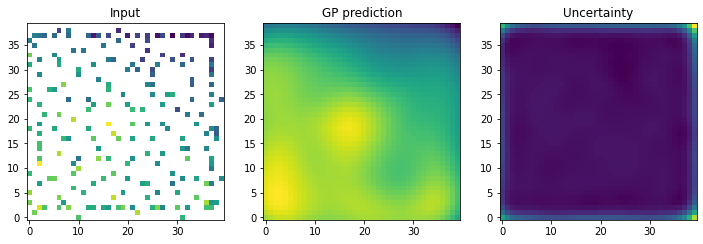

Step 91


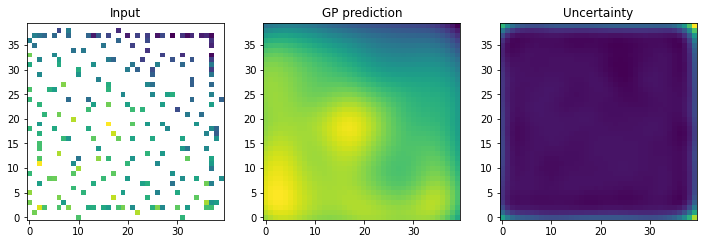

Step 92


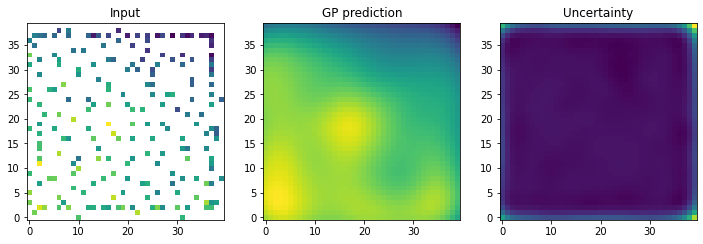

Step 93


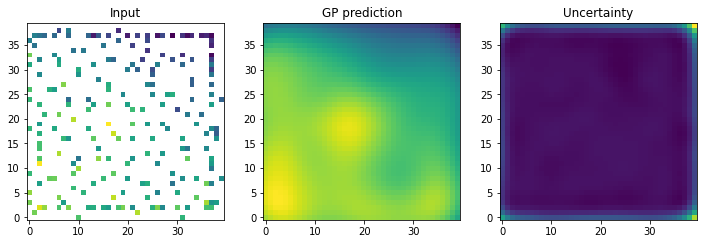

Step 94


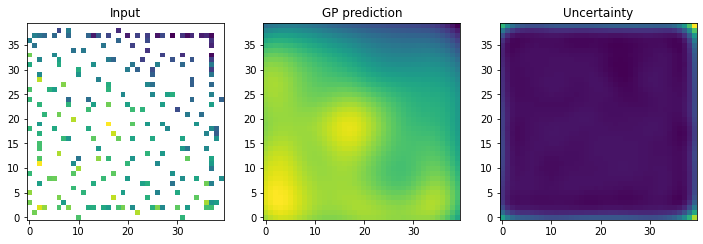

Step 95


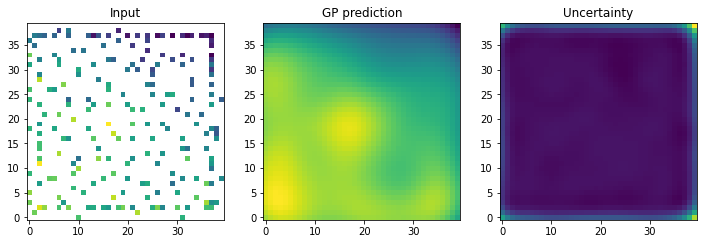

Step 96


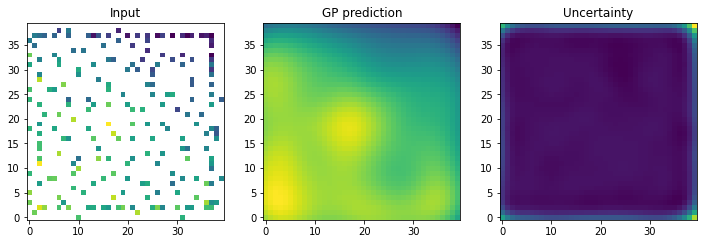

Step 97


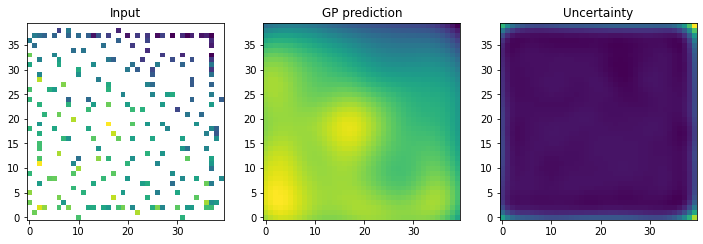

Step 98


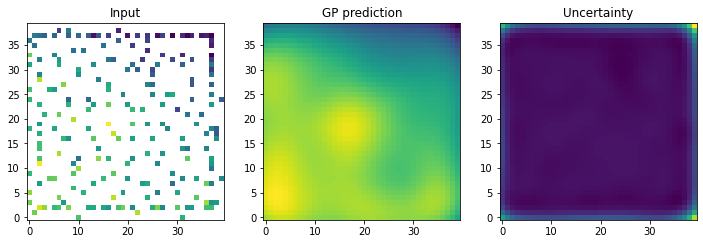

Step 99


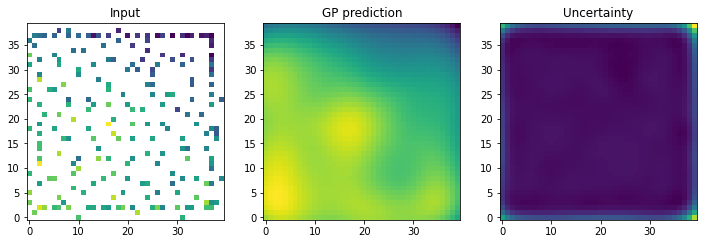

Step 100


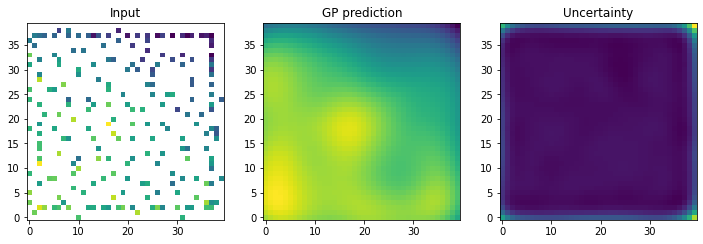

Step 101


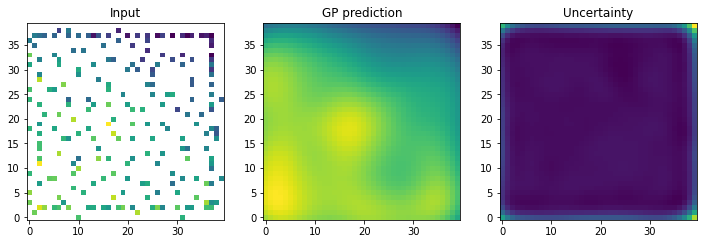

Step 102


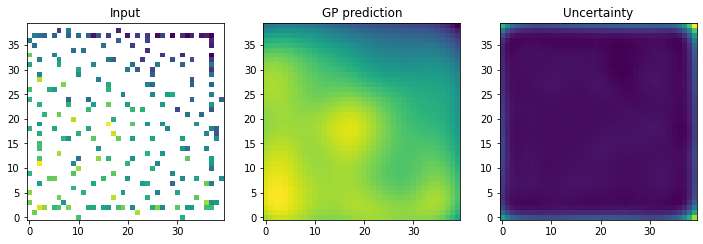

Step 103


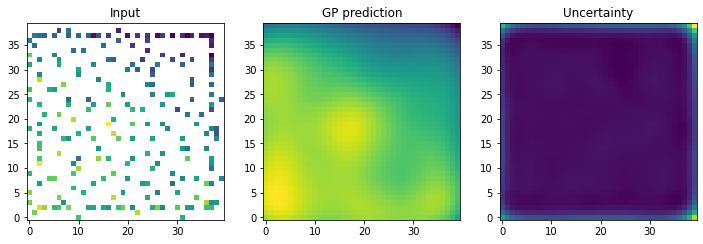

Step 104


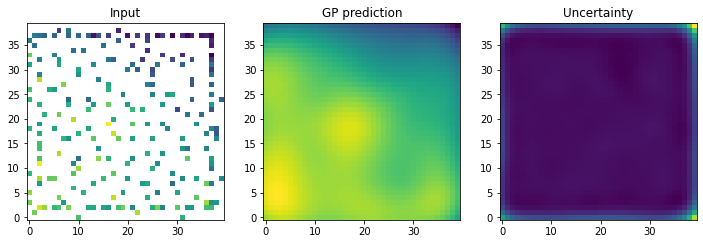

Step 105


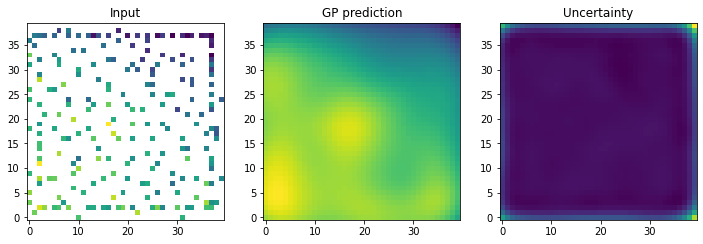

Step 106


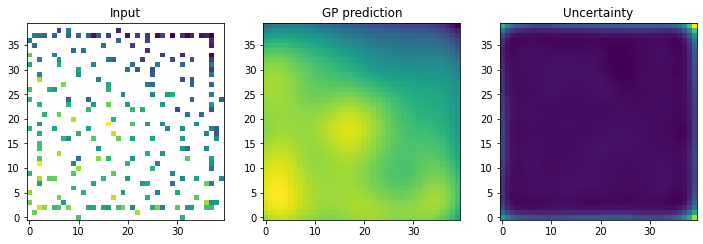

Step 107


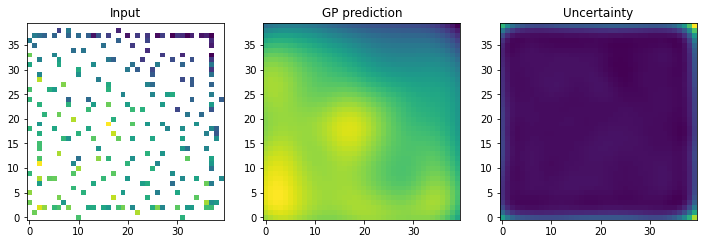

Step 108


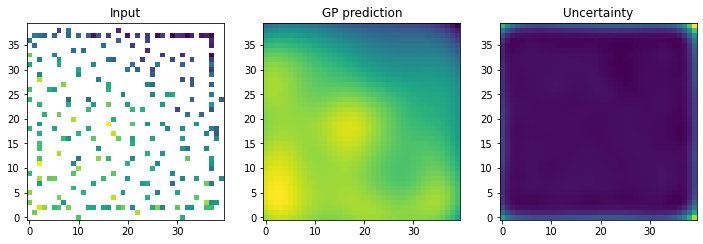

Step 109


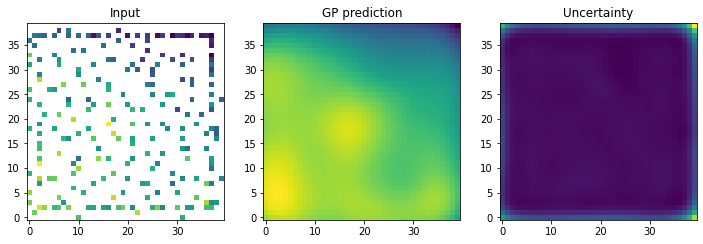

Step 110


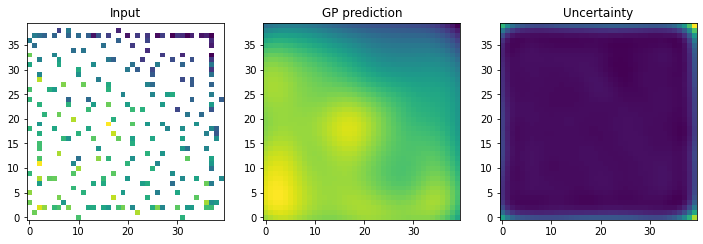

Step 111


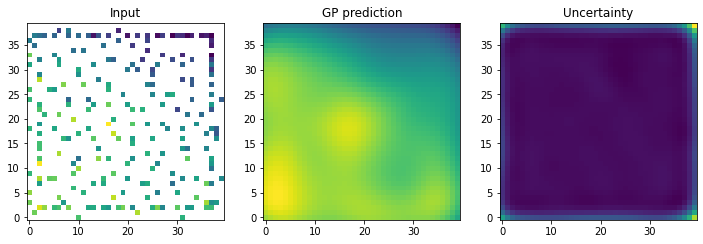

Step 112


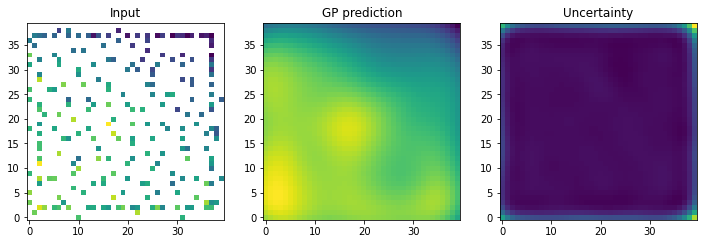

Step 113


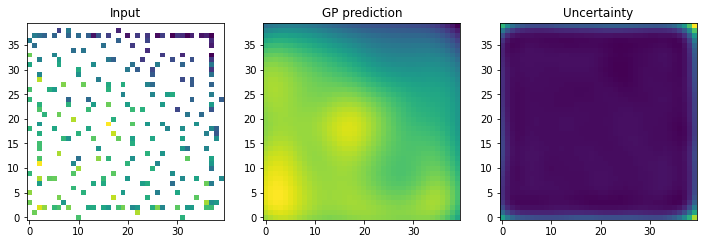

Step 114


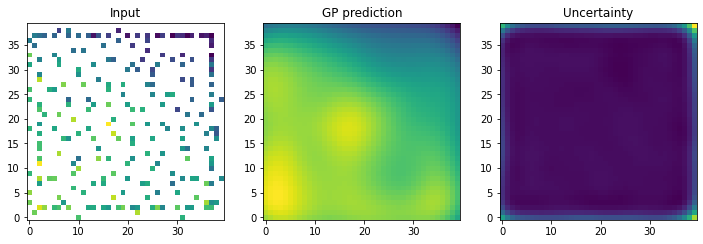

Step 115


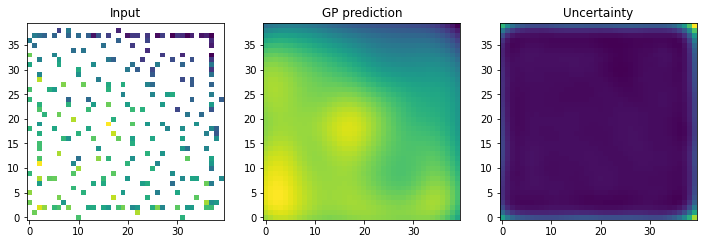

Step 116


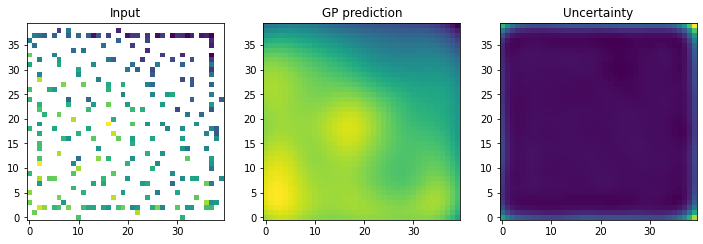

Step 117


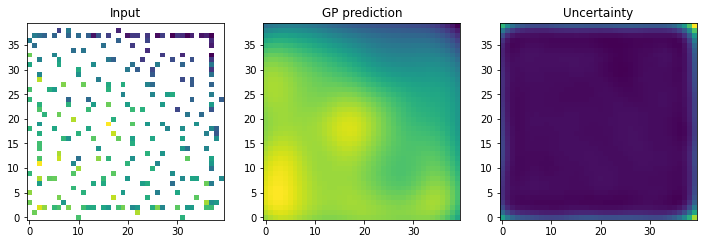

Step 118


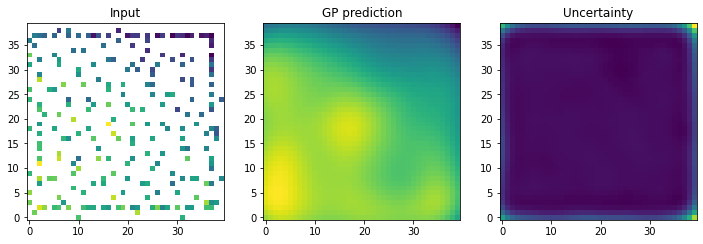

Step 119


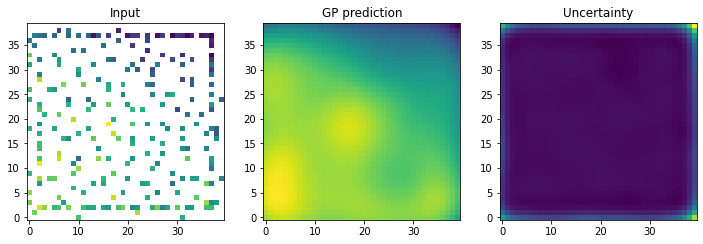

Step 120


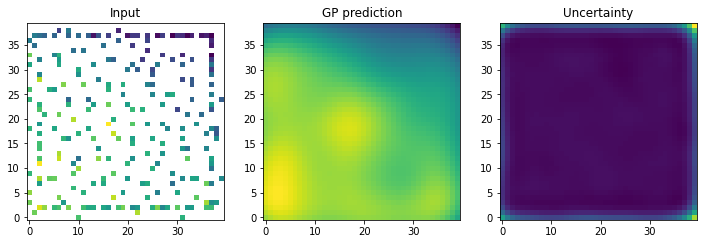

Step 121


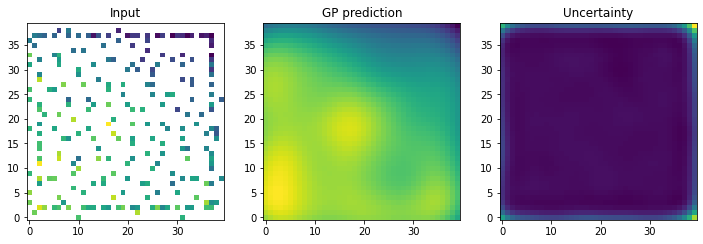

Step 122


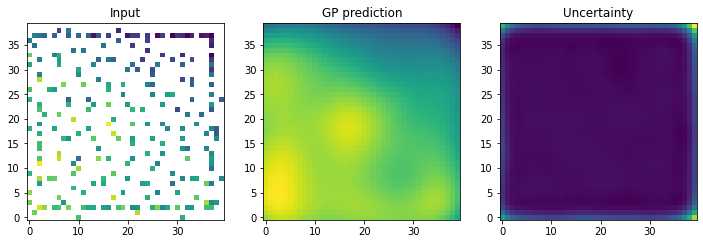

Step 123


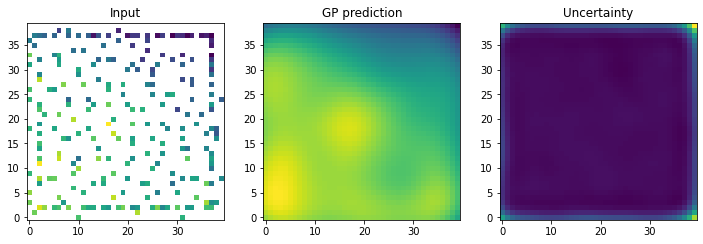

Step 124


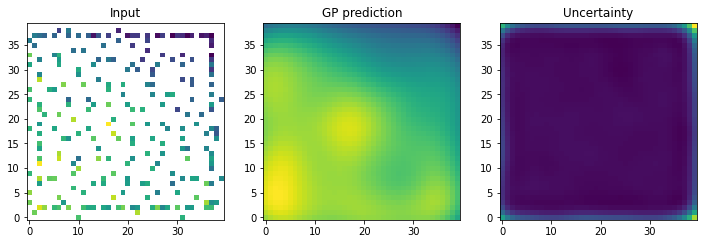

Step 125


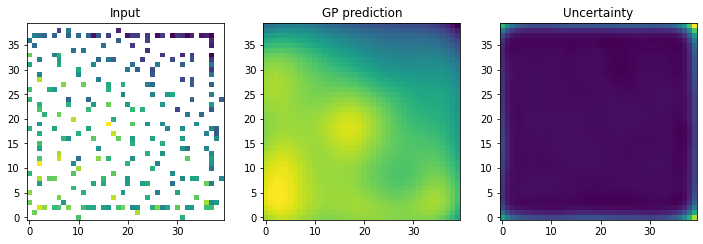

Step 126


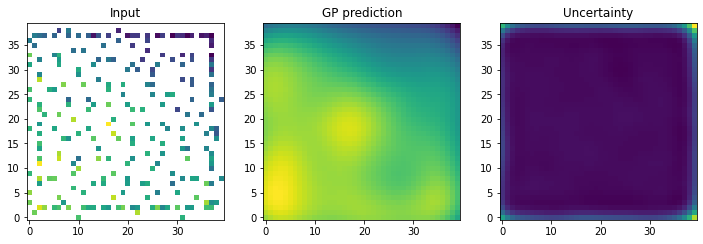

Step 127


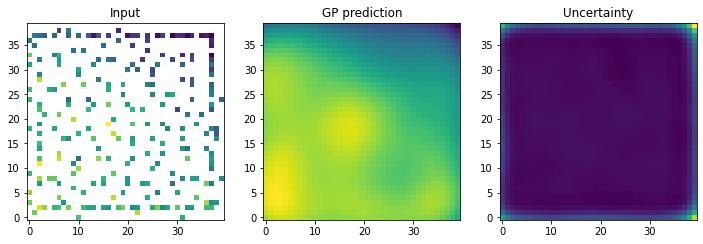

Step 128


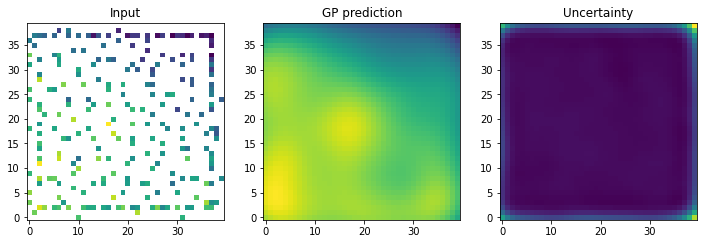

Step 129


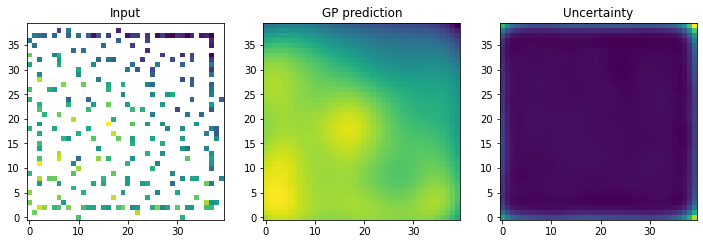

Step 130


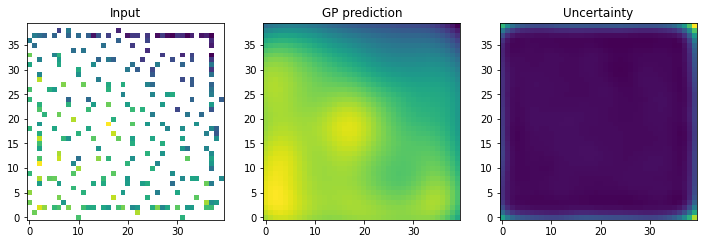

Step 131


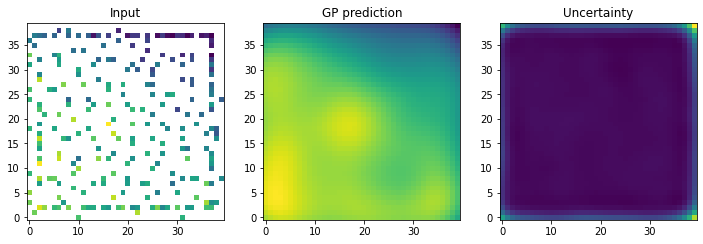

Step 132


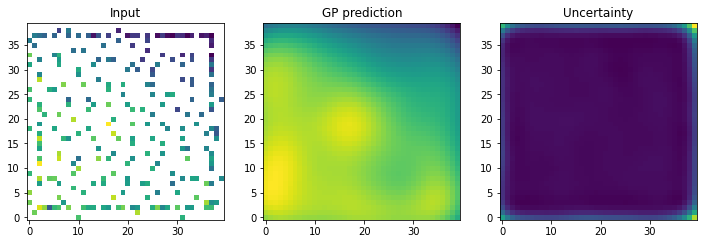

Step 133


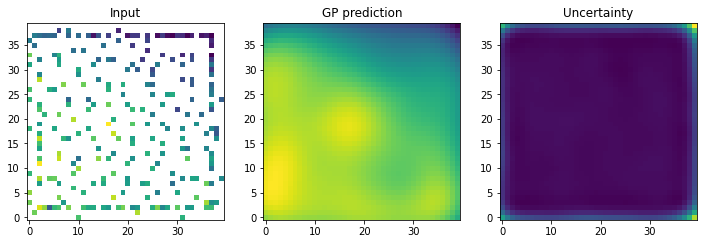

Step 134


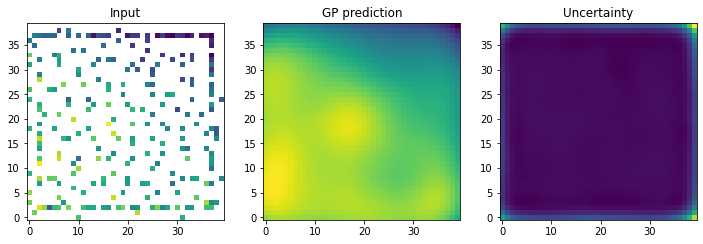

Step 135


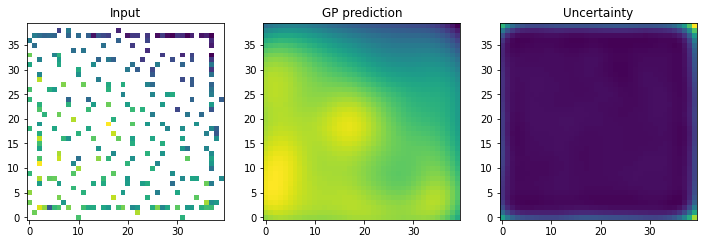

Step 136


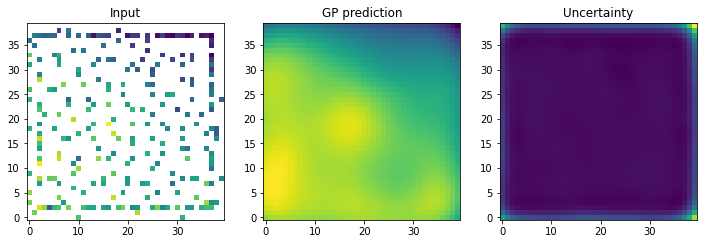

Step 137


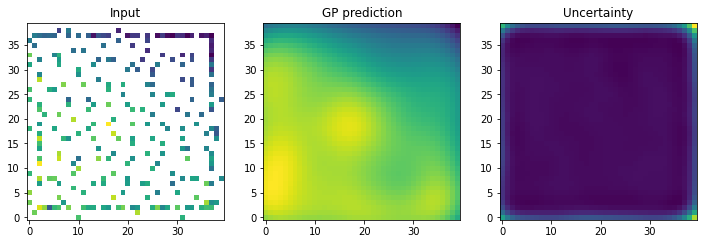

Step 138


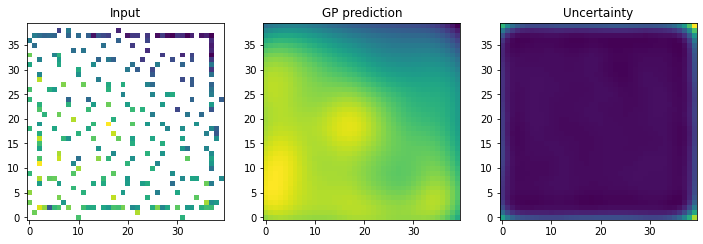

Step 139


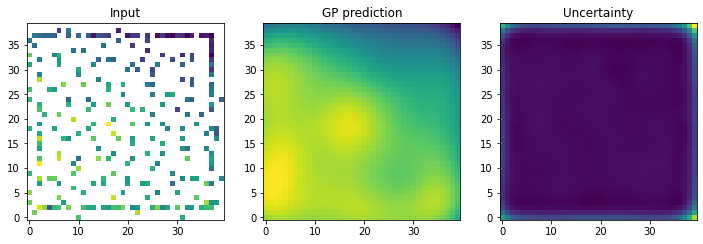

Step 140


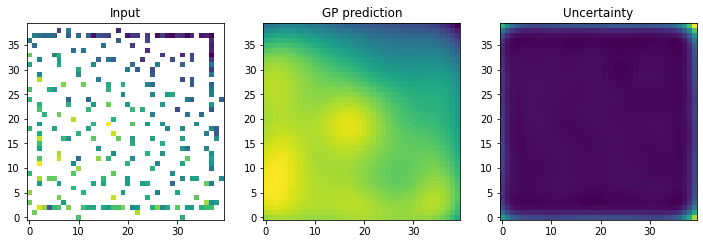

Step 141


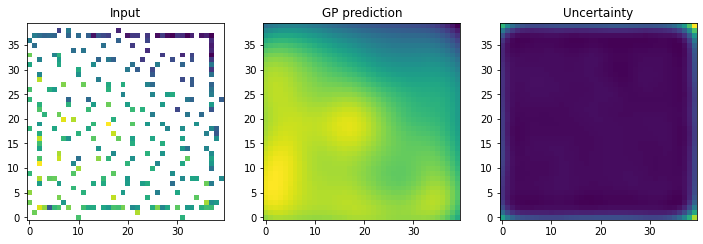

Step 142


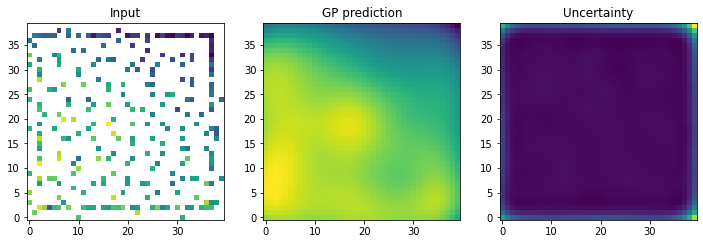

Step 143


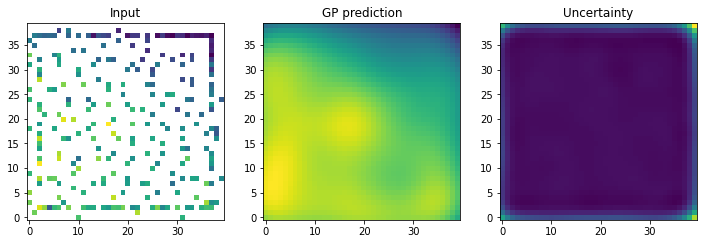

Step 144


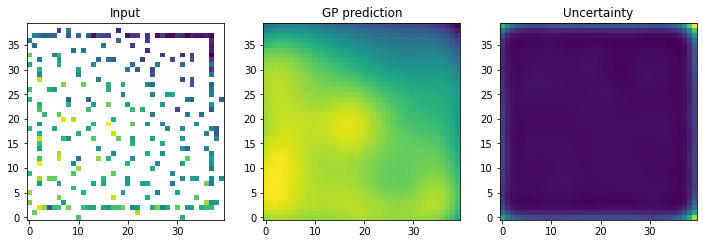

Step 145


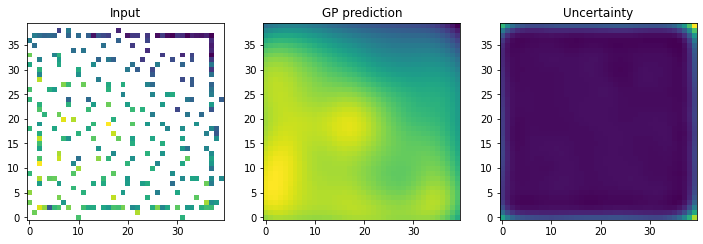

Step 146


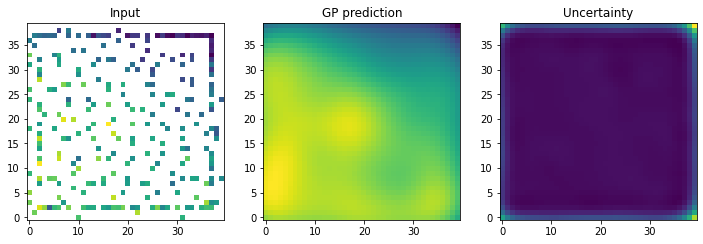

Step 147


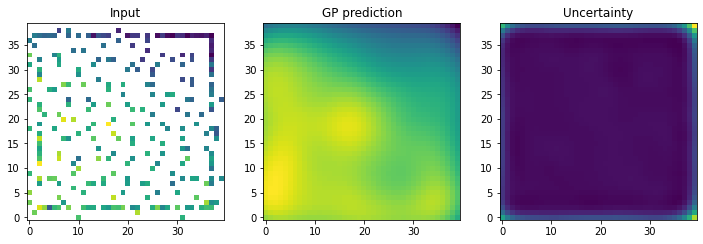

Step 148


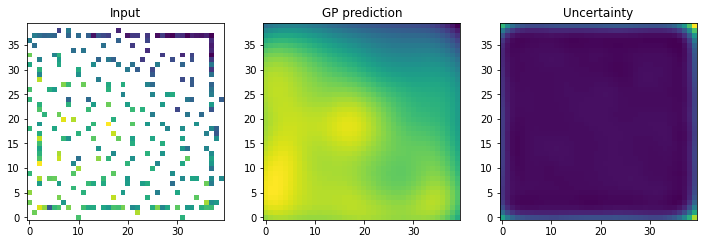

Step 149


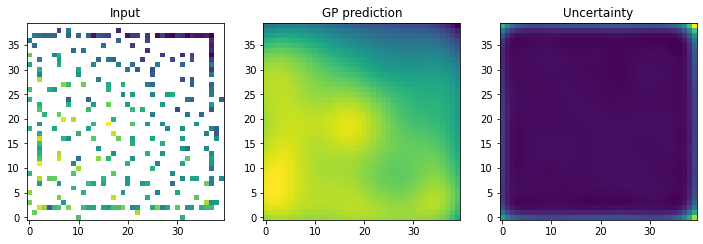

Step 150


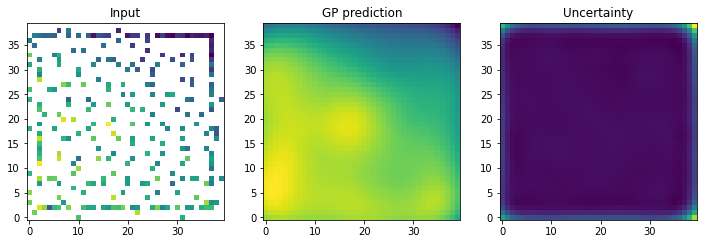

Step 151


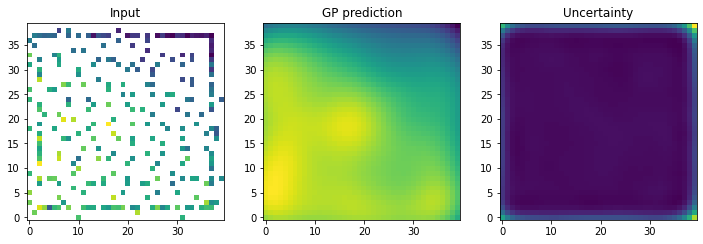

Step 152


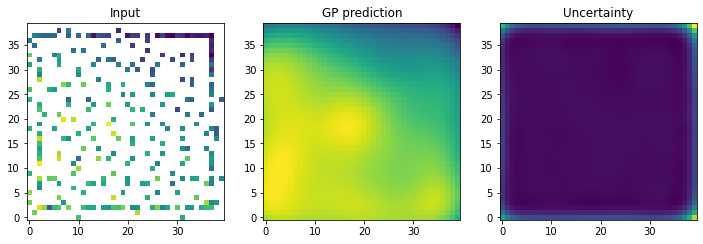

Step 153


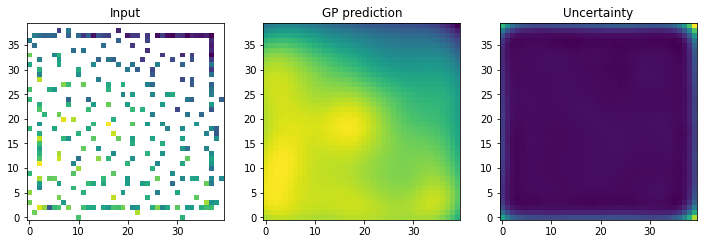

Step 154


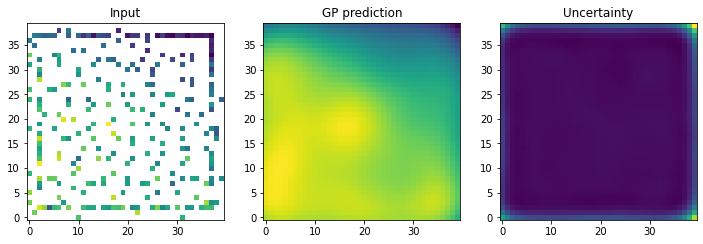

Step 155


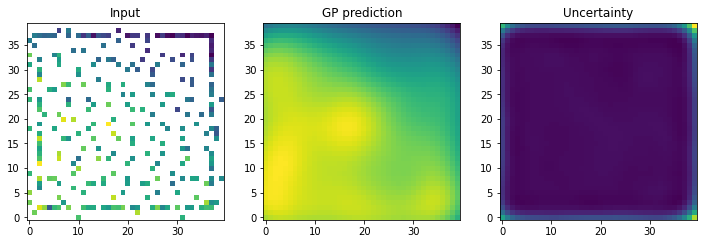

Step 156


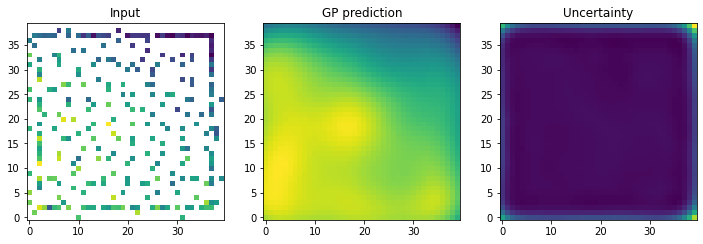

Step 157


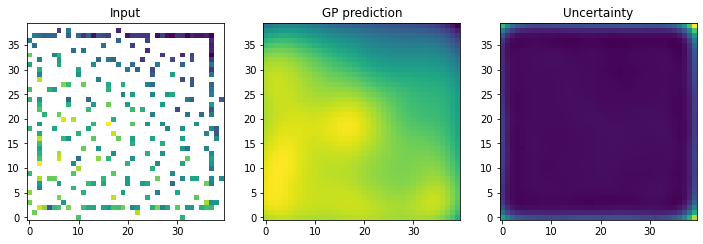

Step 158


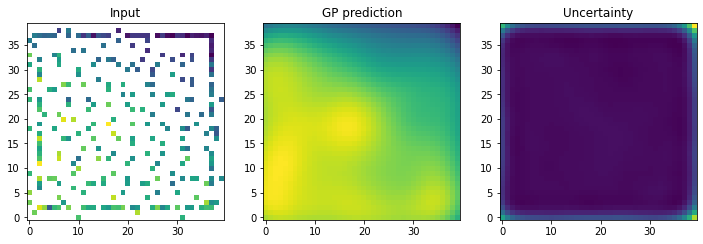

Step 159


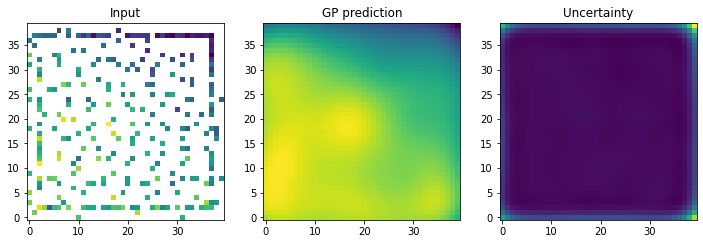

Step 160


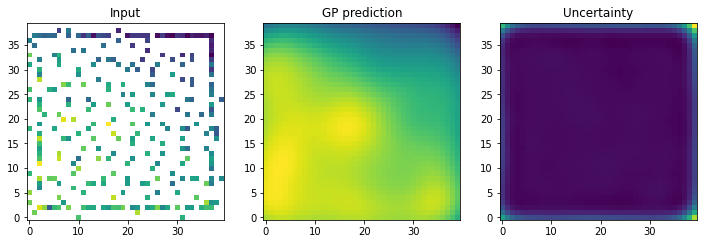

Step 161


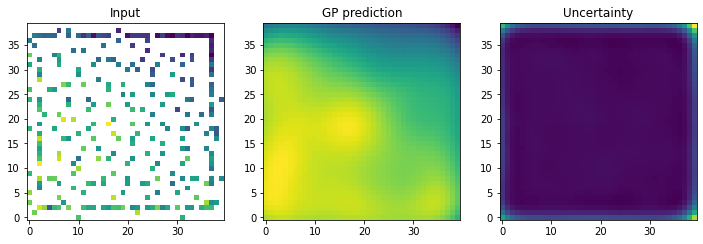

Step 162


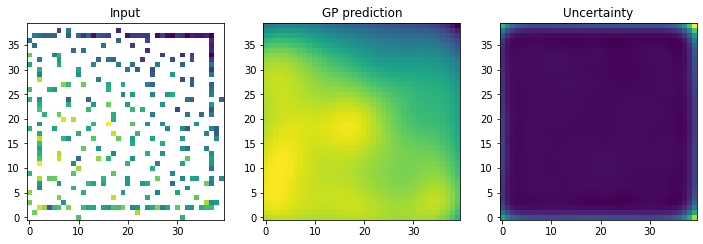

Step 163


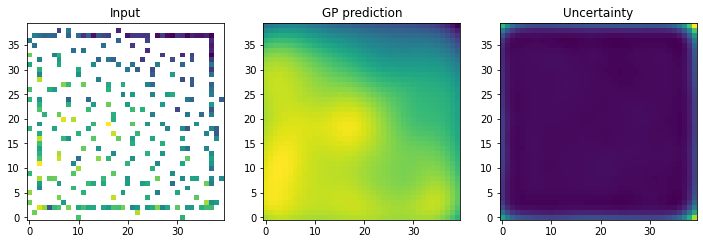

Step 164


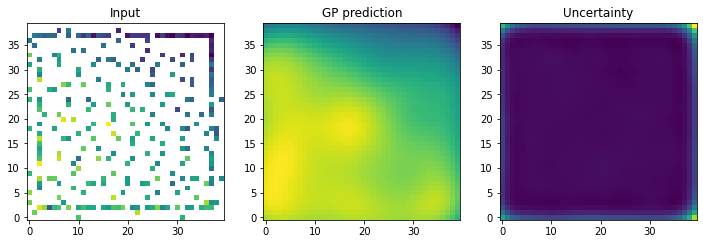

Step 165


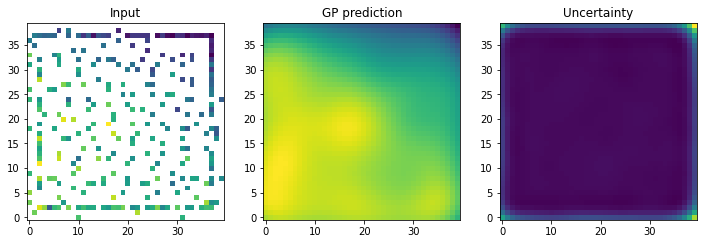

Step 166


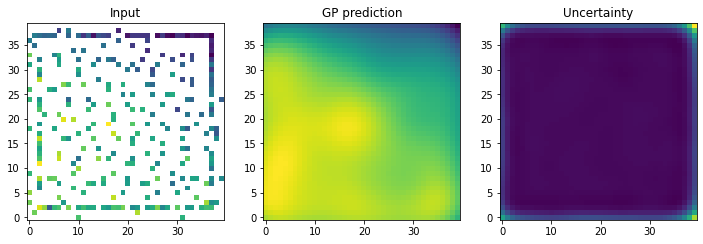

Step 167


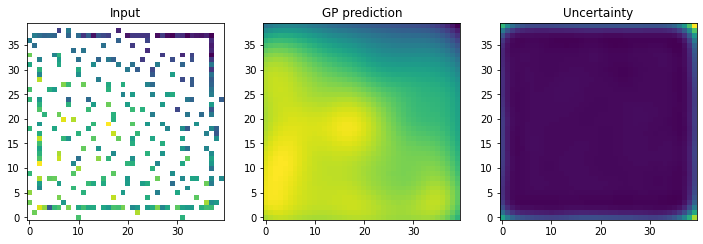

Step 168


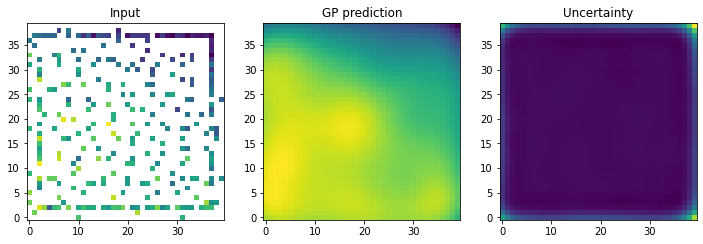

Step 169


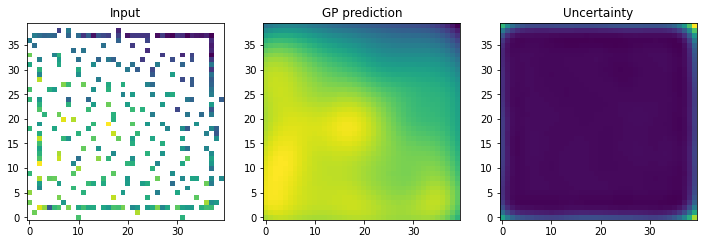

Step 170


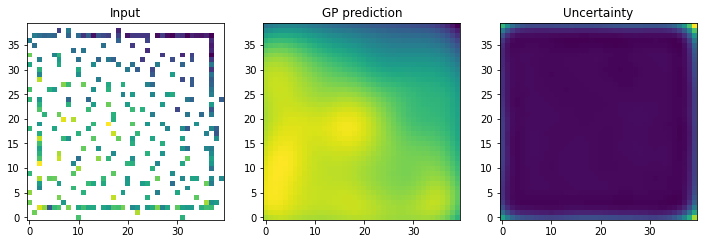

Step 171


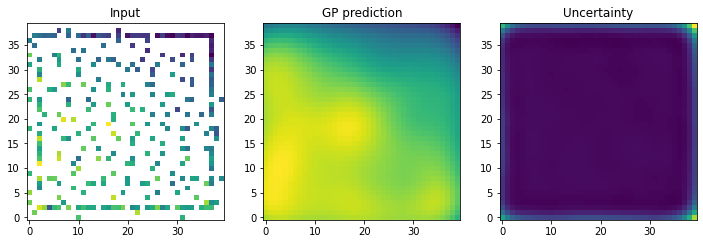

Step 172


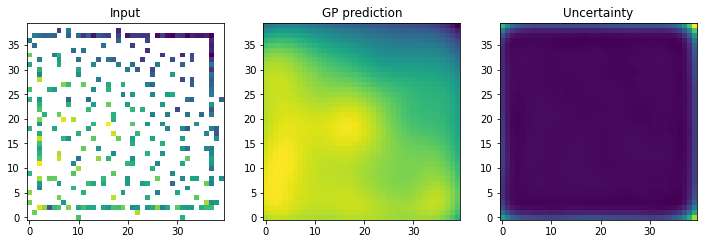

Step 173


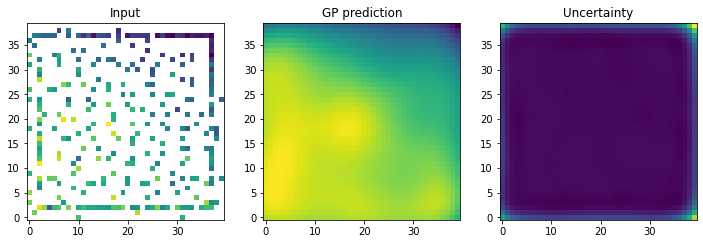

Step 174


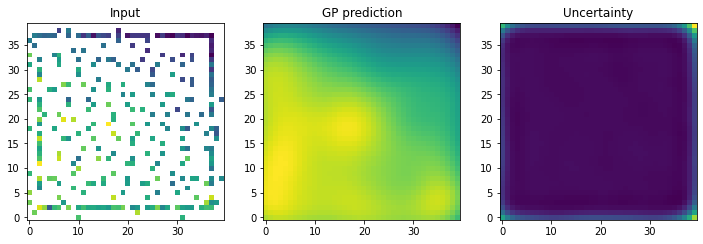

Step 175


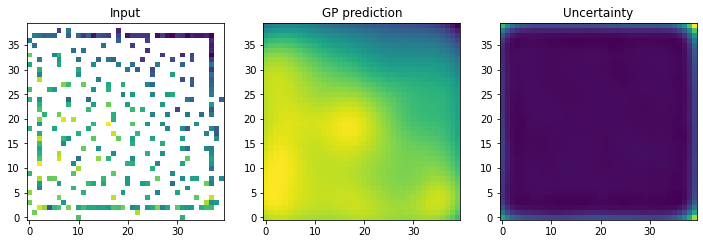

Step 176


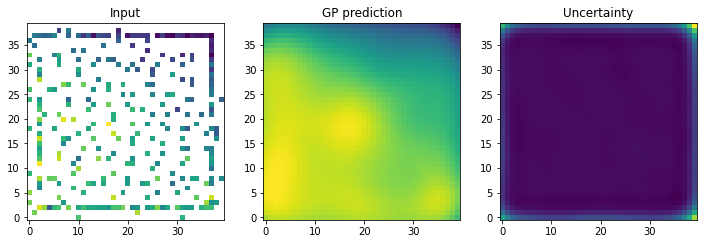

Step 177


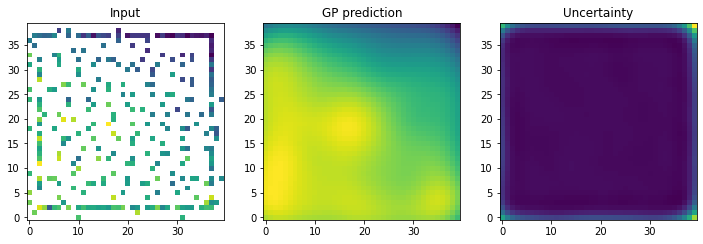

Step 178


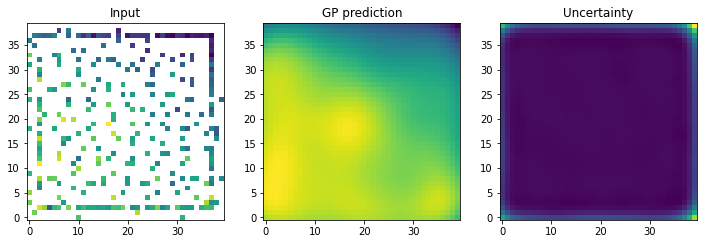

Step 179


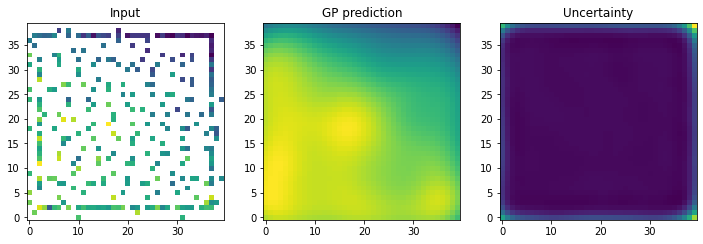

Step 180


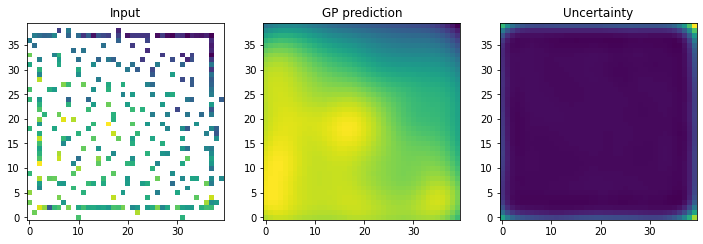

Step 181


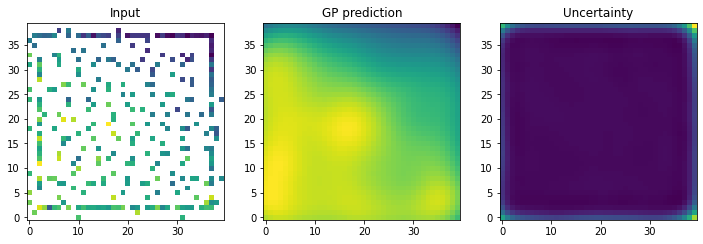

Step 182


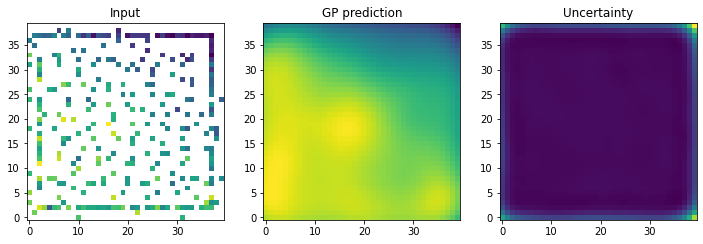

Step 183


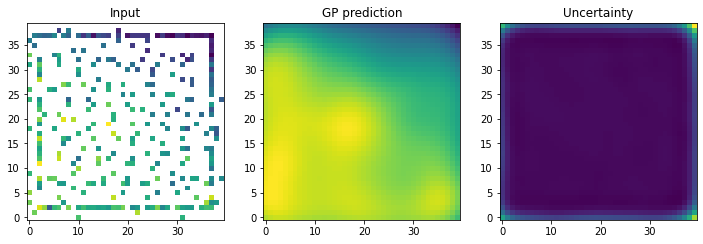

Step 184


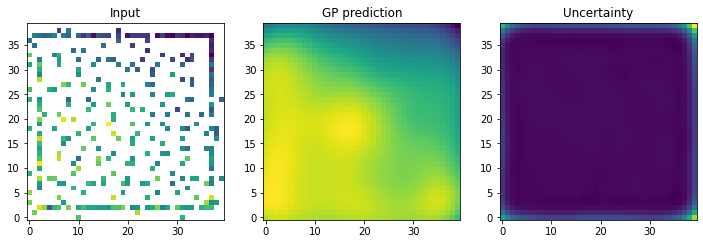

Step 185


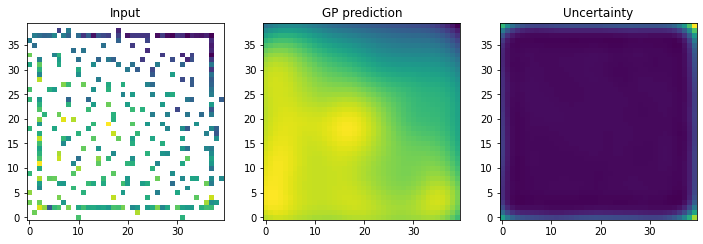

Step 186


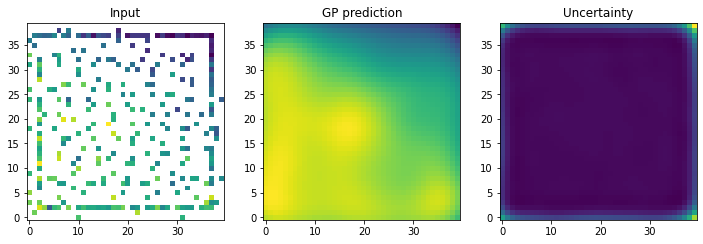

Step 187


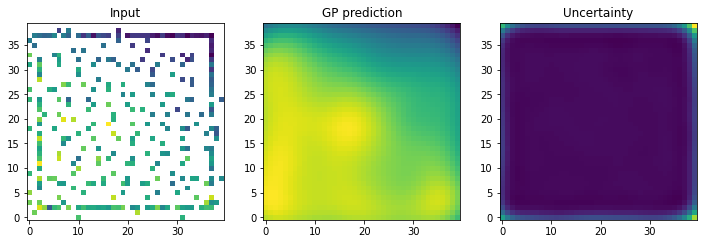

Step 188


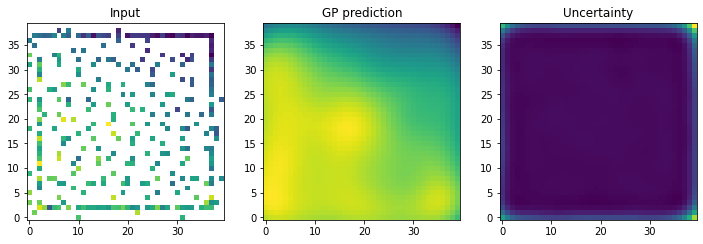

Step 189


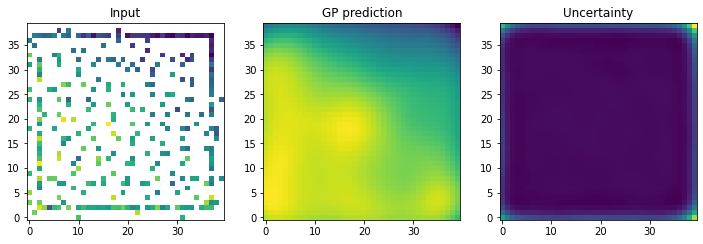

Step 190


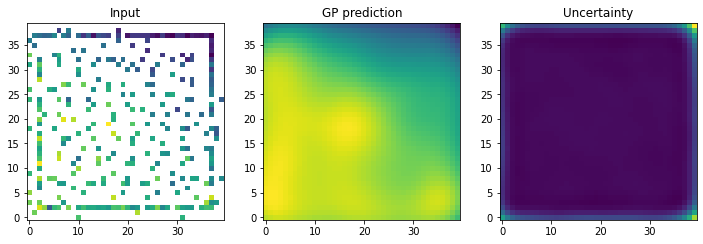

Step 191


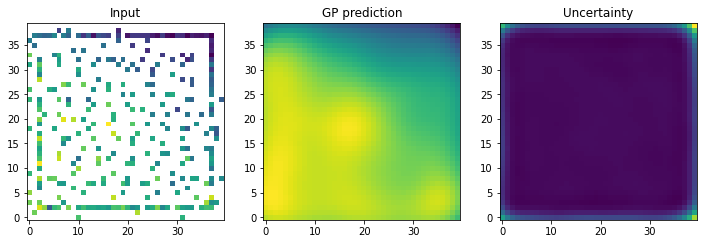

Step 192


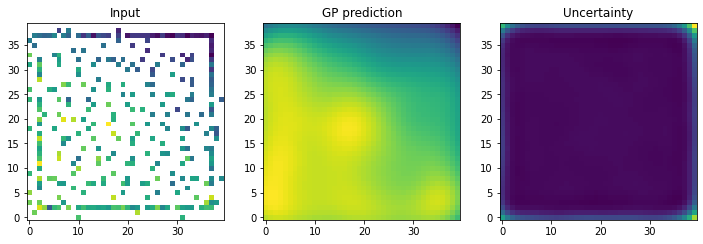

Step 193


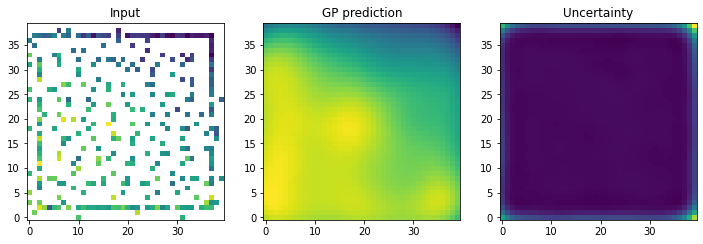

Step 194


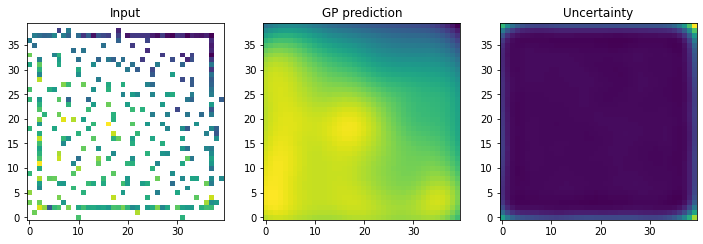

Step 195


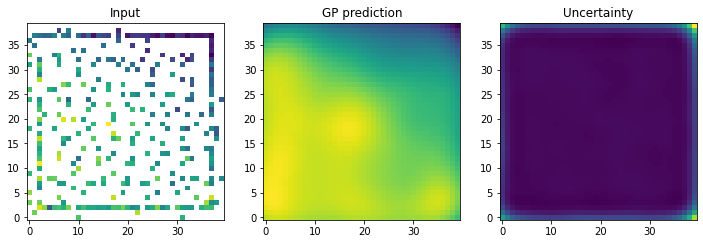

Step 196


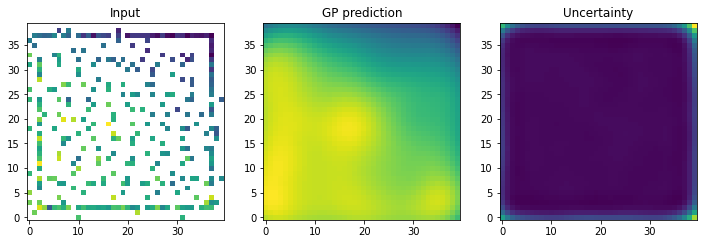

Step 197


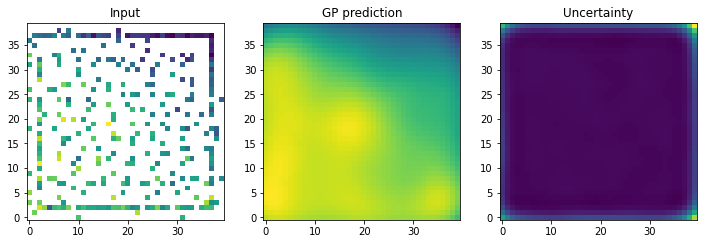

Step 198


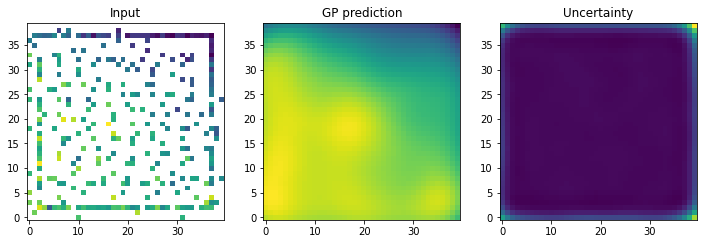

Step 199


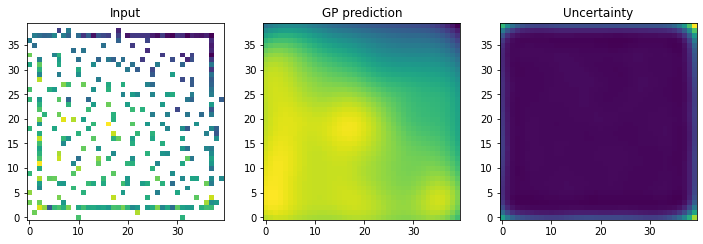

Step 200


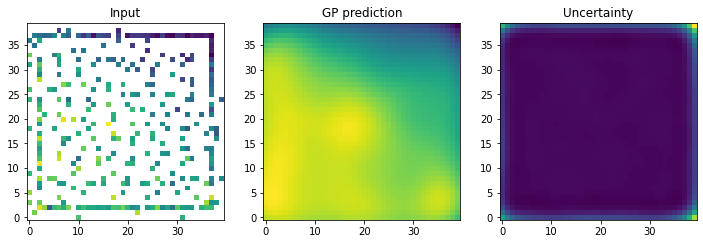

Step 201


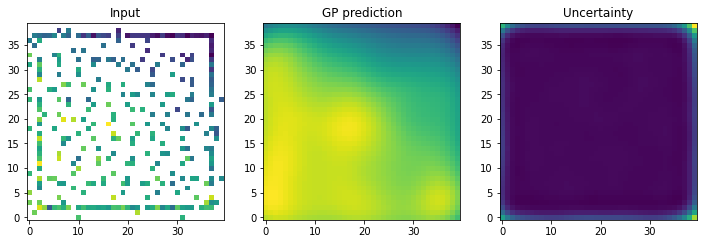

Step 202


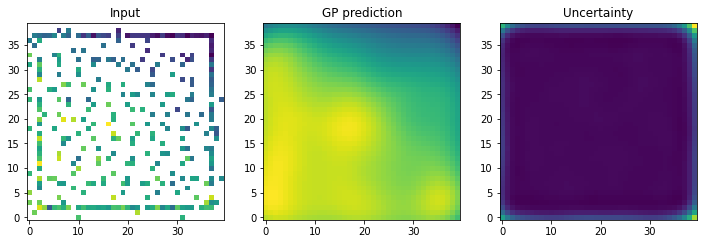

Step 203


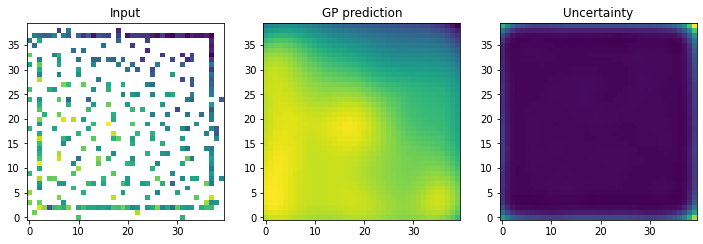

Step 204


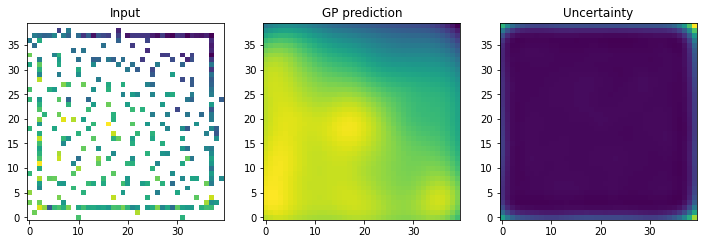

Step 205


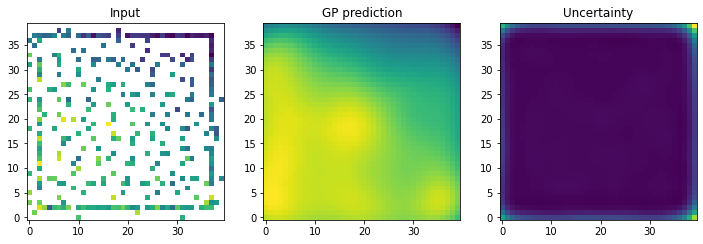

Step 206


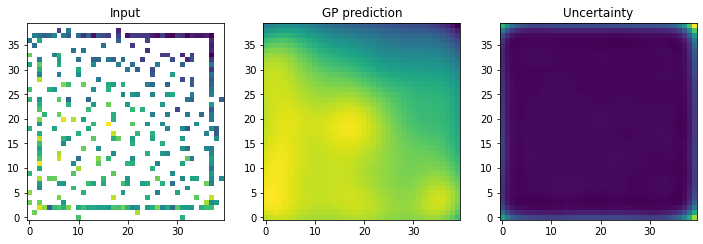

Step 207


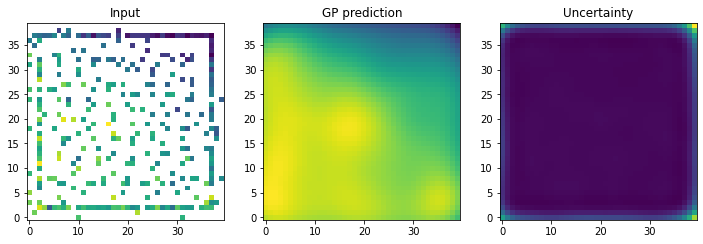

Step 208


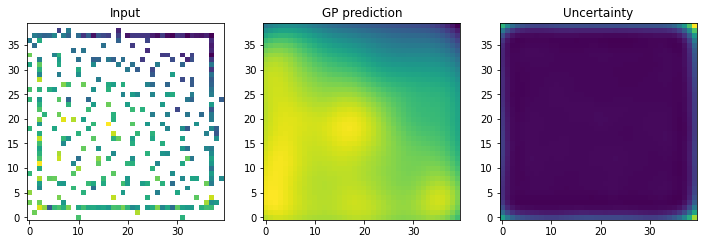

Step 209


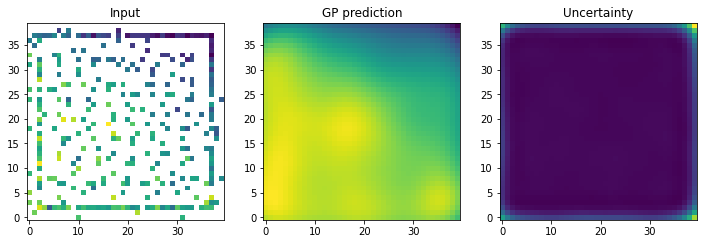

Step 210


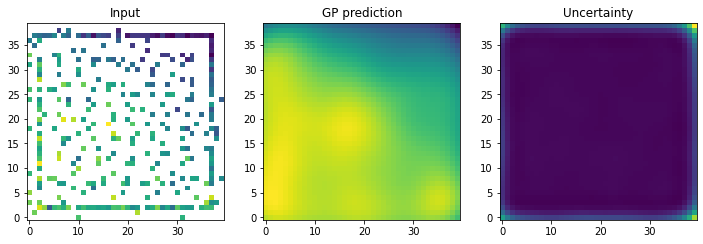

Step 211


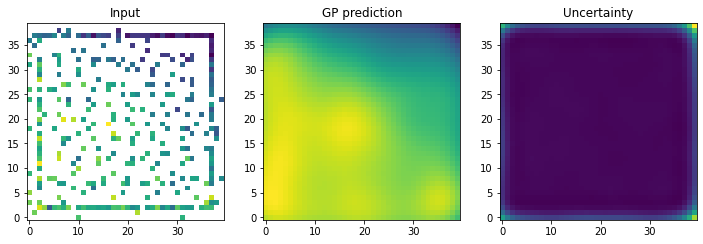

Step 212


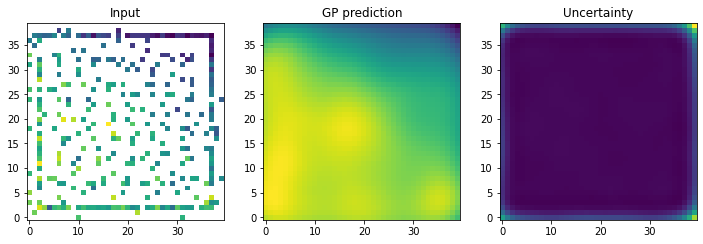

Step 213


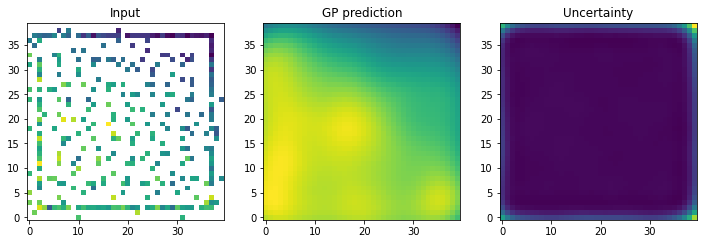

Step 214


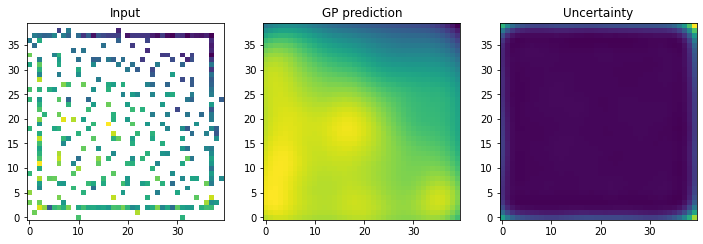

Step 215


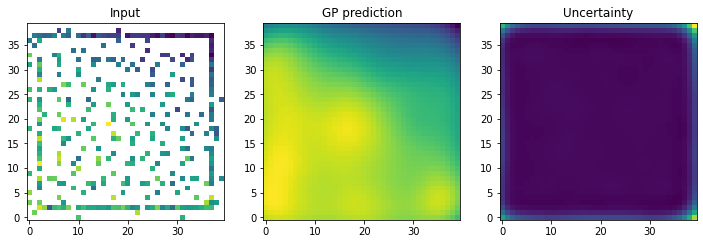

Step 216


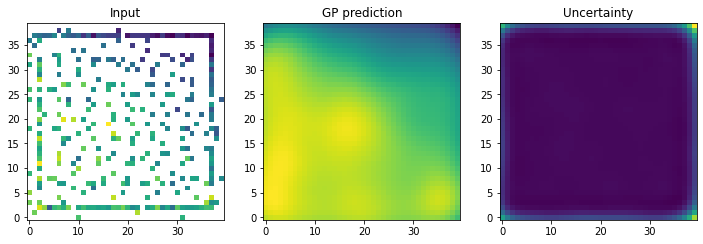

Step 217


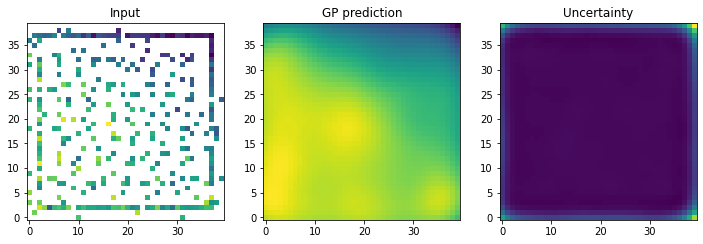

Step 218


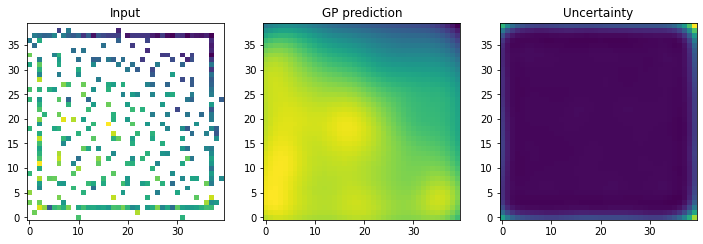

Step 219


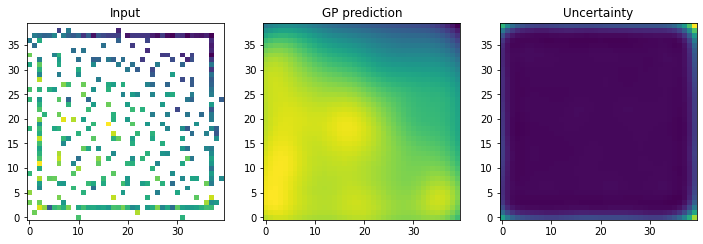

Step 220


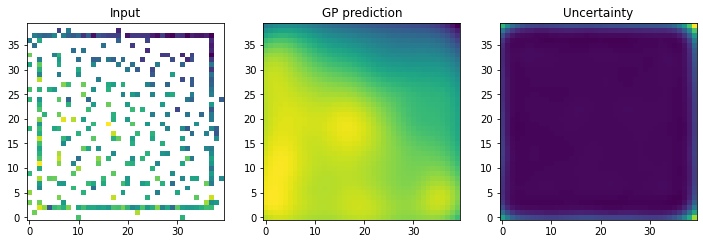

Step 221


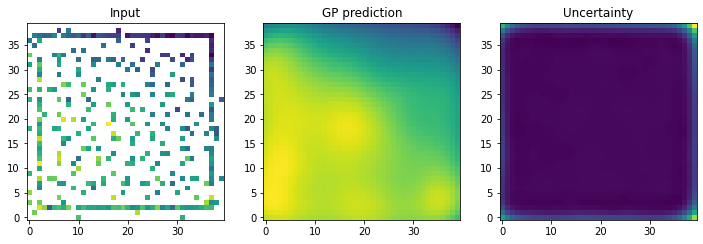

Step 222


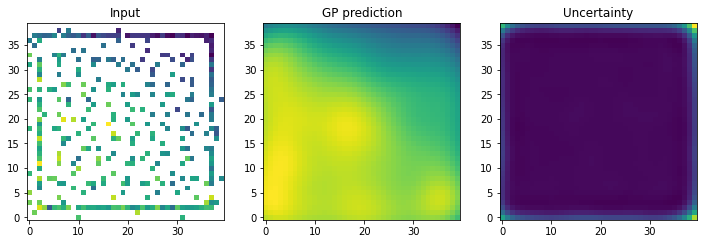

Step 223


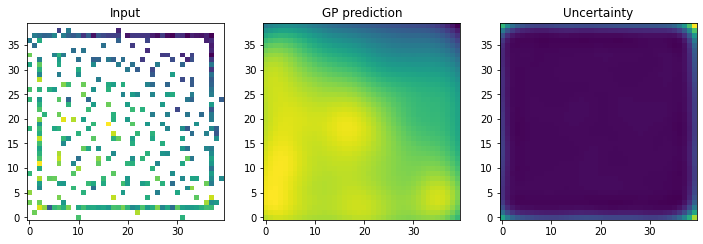

Step 224


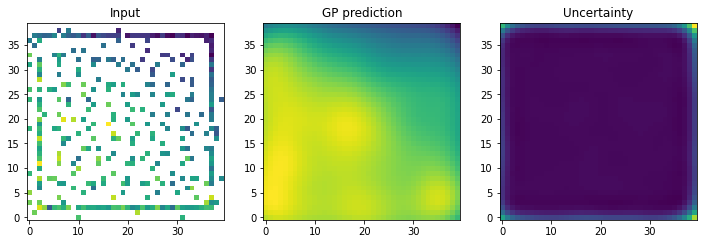

Step 225


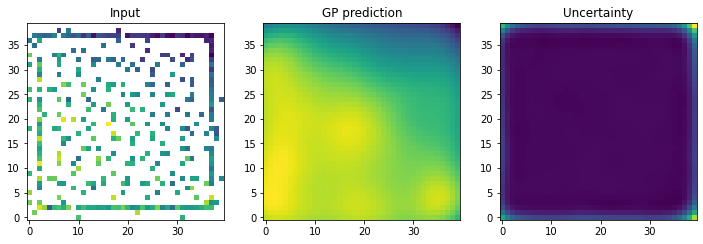

Step 226


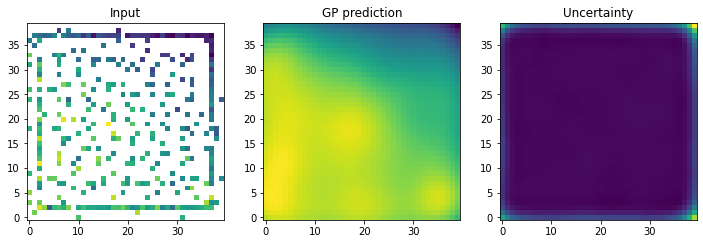

Step 227


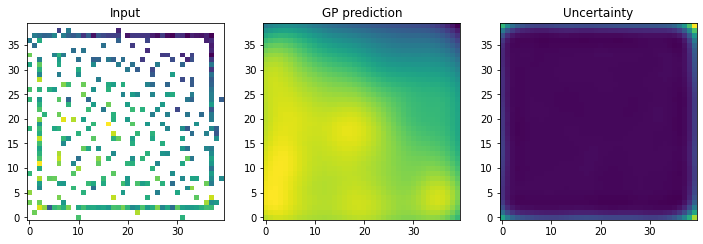

Step 228


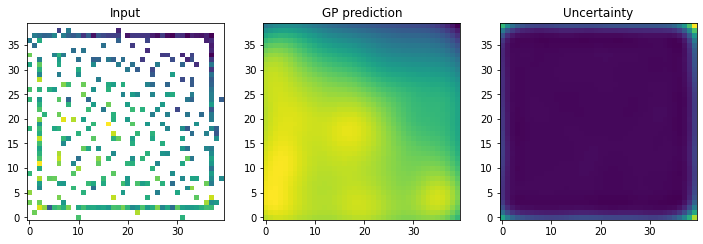

Step 229


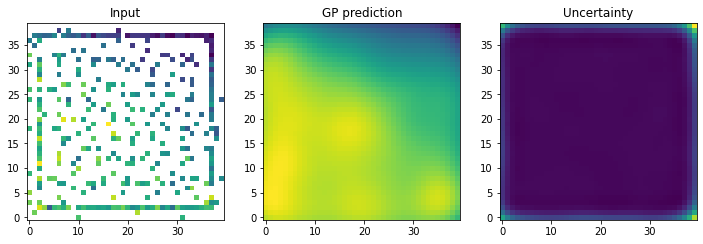

Step 230


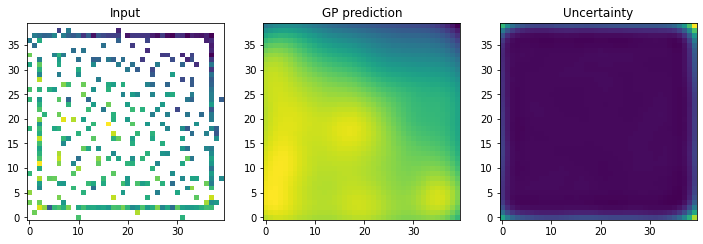

Step 231


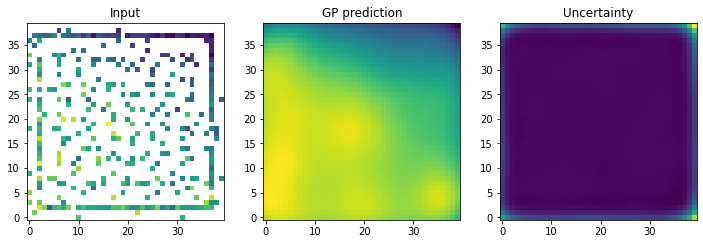

Step 232


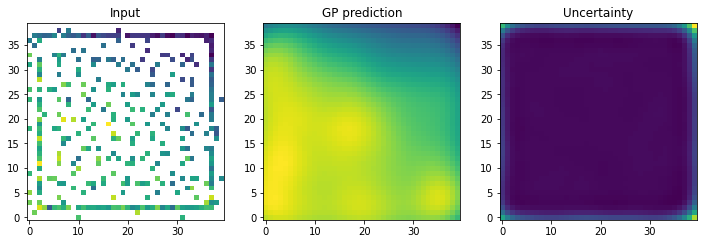

Step 233


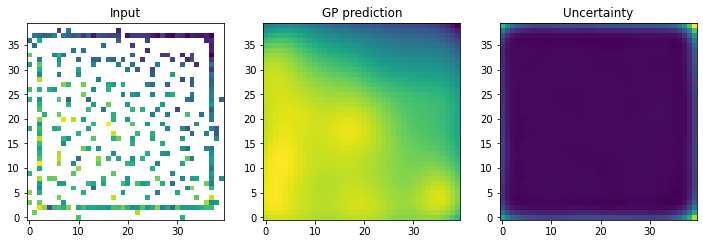

Step 234


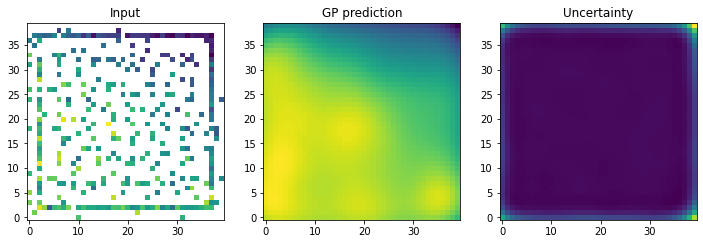

Step 235


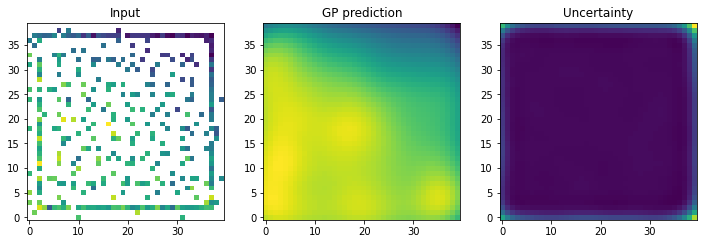

Step 236


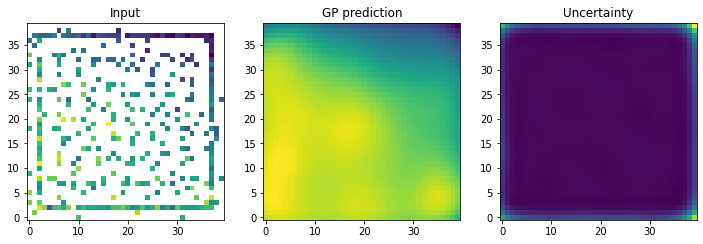

Step 237


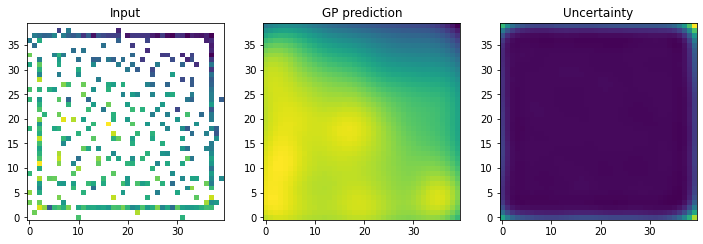

Step 238


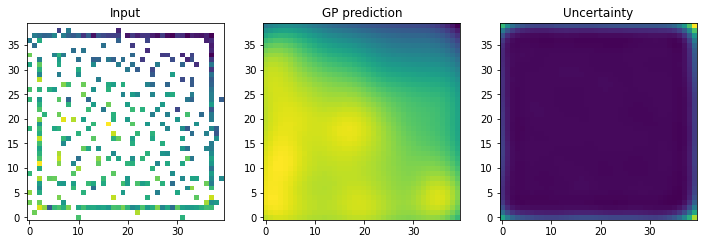

Step 239


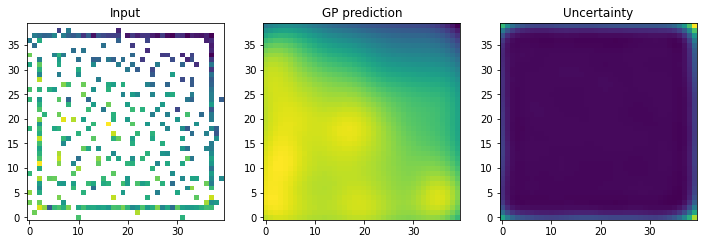

Step 240


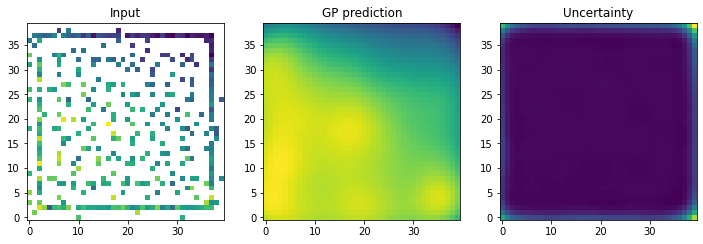

Step 241


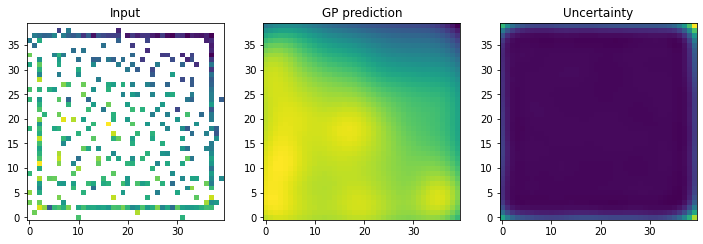

Step 242


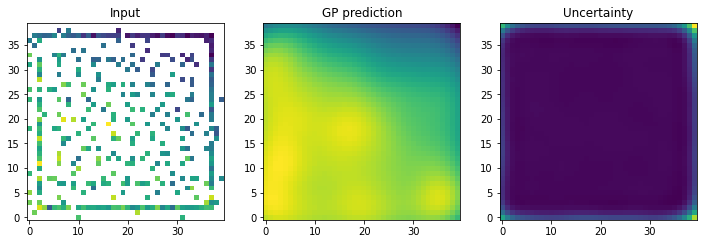

Step 243


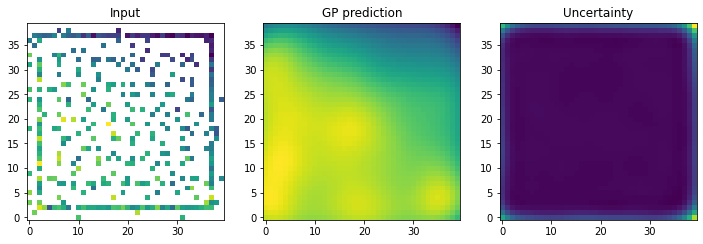

Step 244


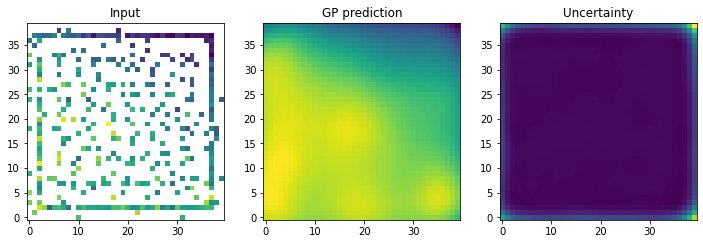

Step 245


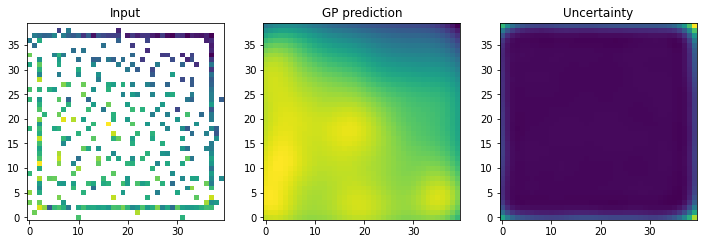

Step 246


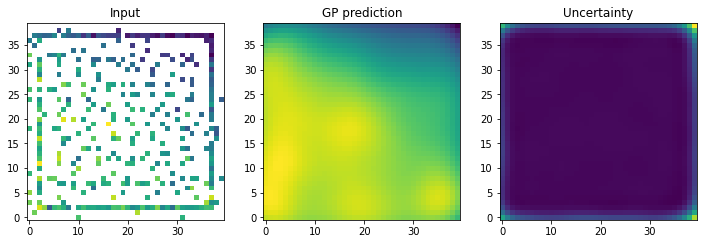

Step 247


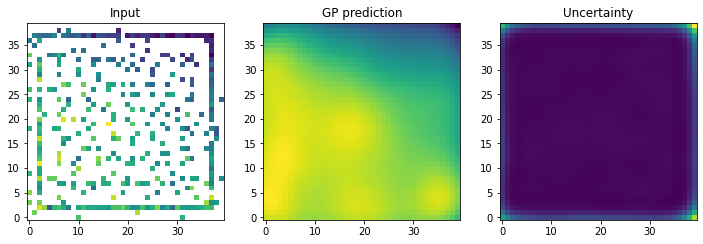

Step 248


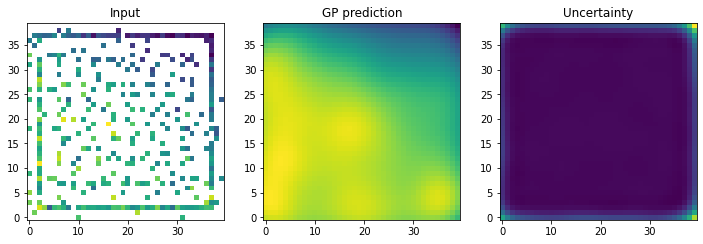

Step 249


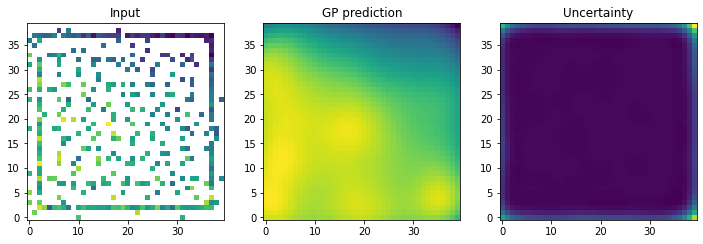

Step 250


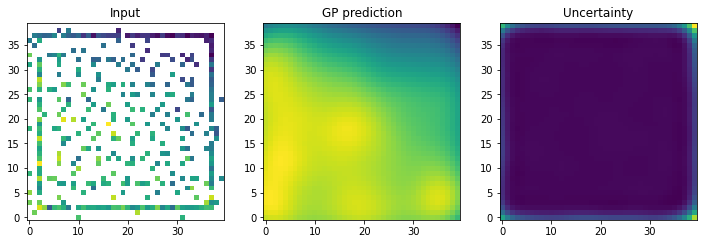

Step 251


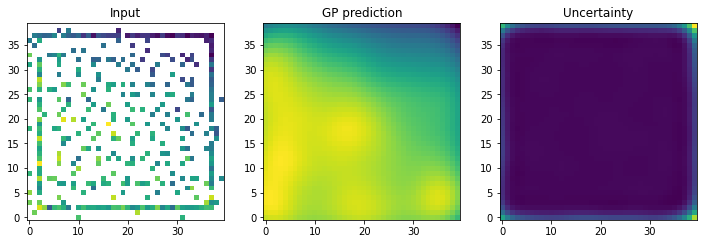

Step 252


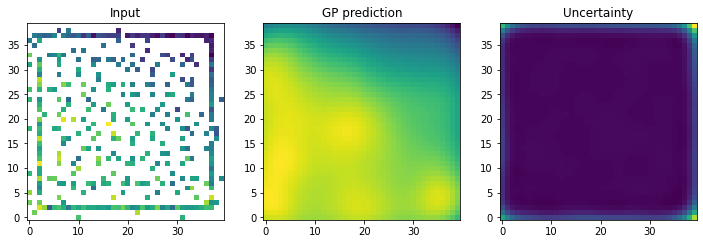

Step 253


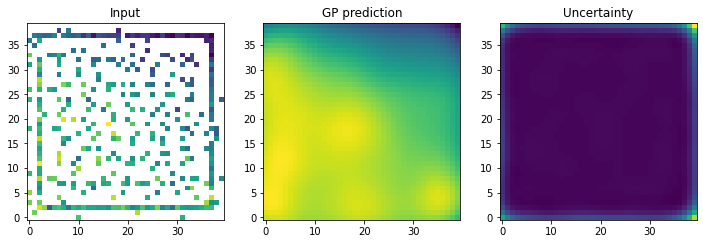

Step 254


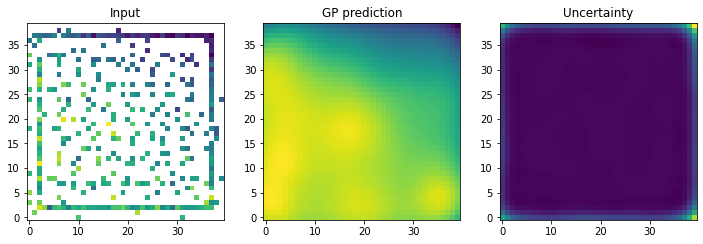

Step 255


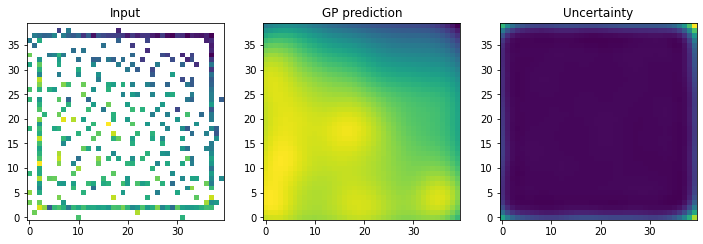

Step 256


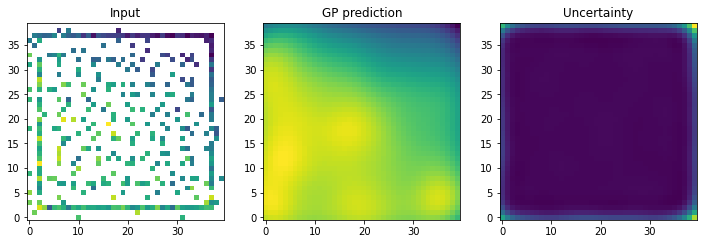

Step 257


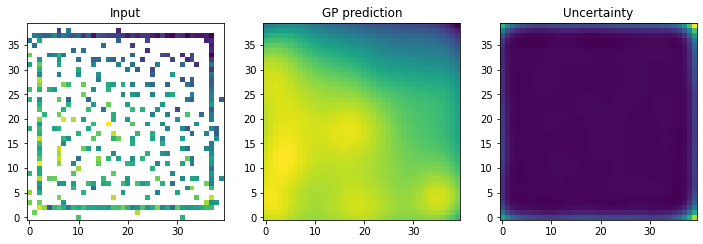

Step 258


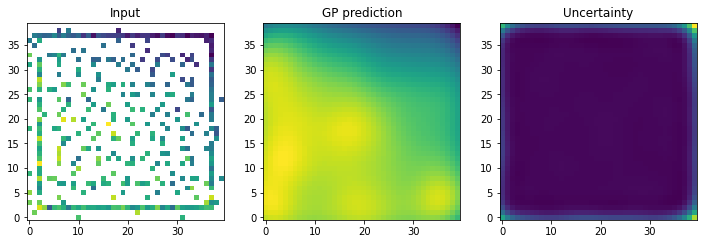

Step 259


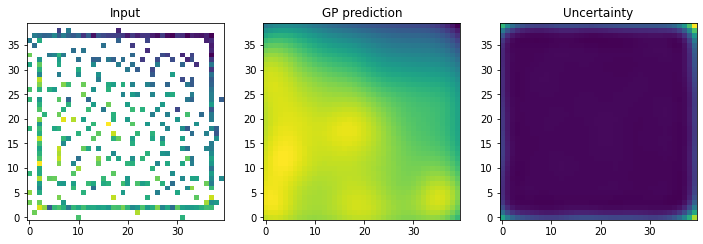

Step 260


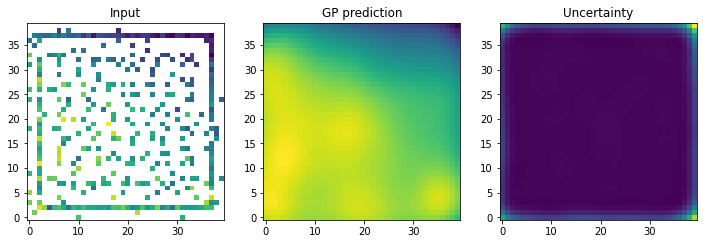

Step 261


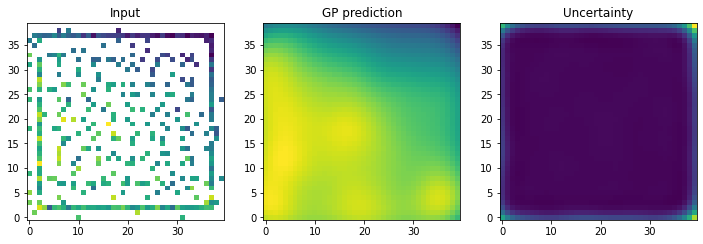

Step 262


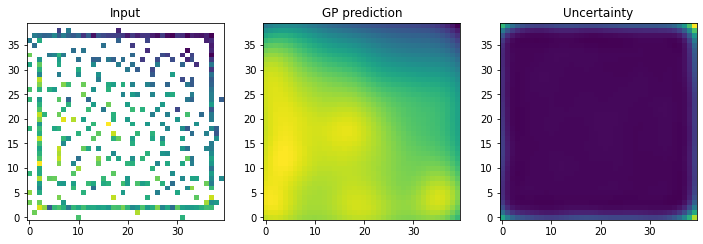

Step 263


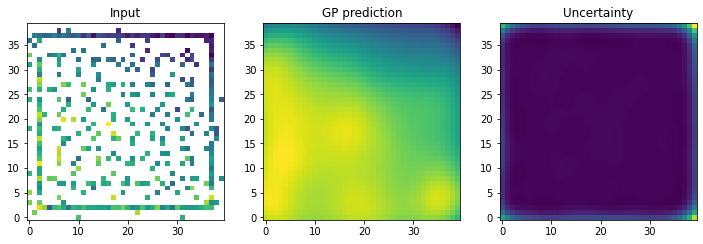

Step 264


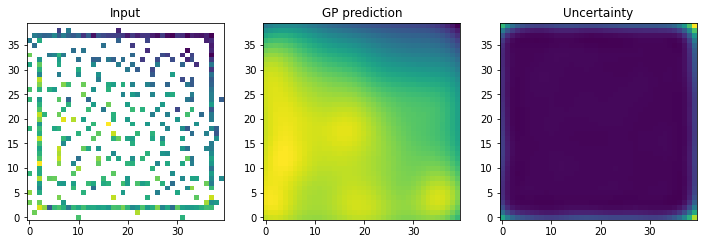

Step 265


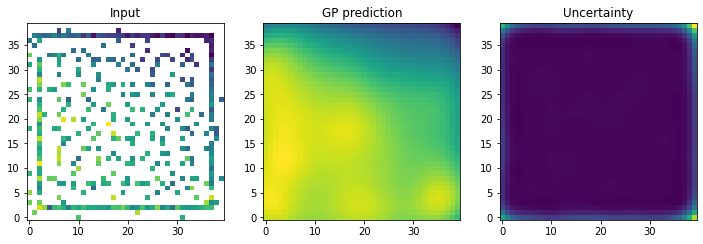

Step 266


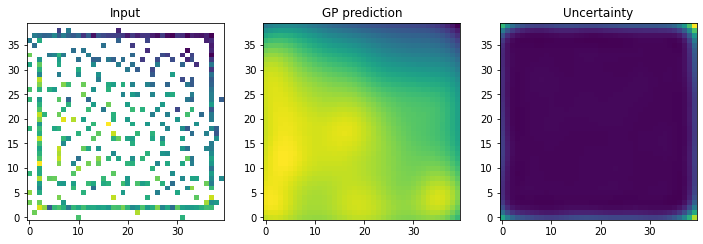

Step 267


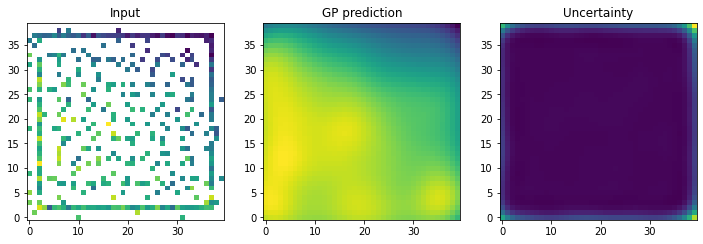

Step 268


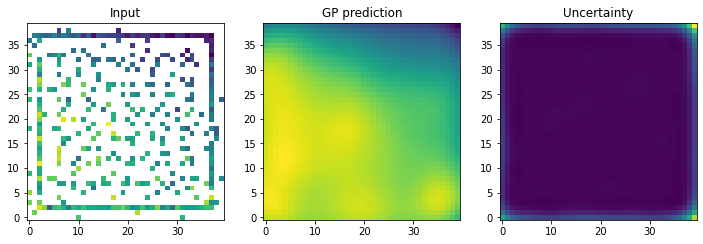

Step 269


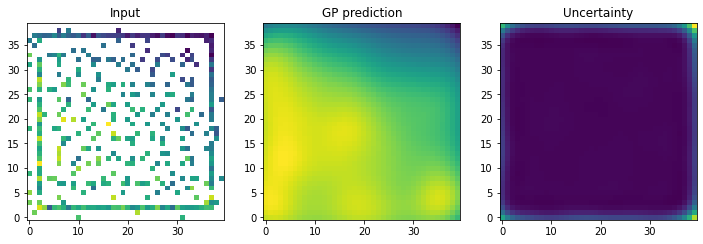

Step 270


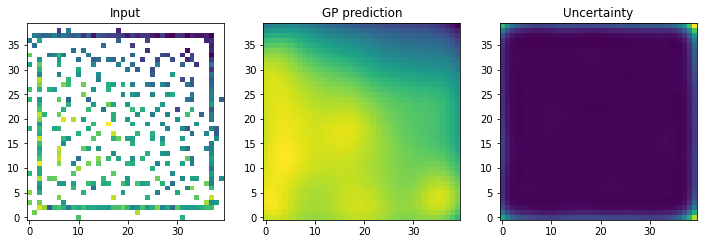

Step 271


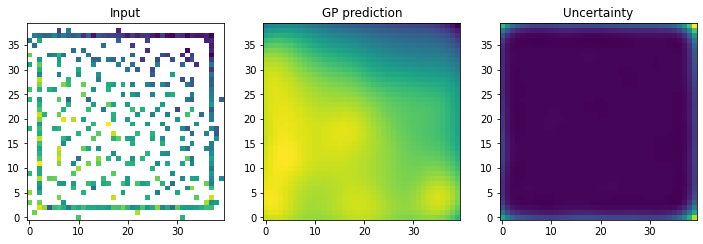

Step 272


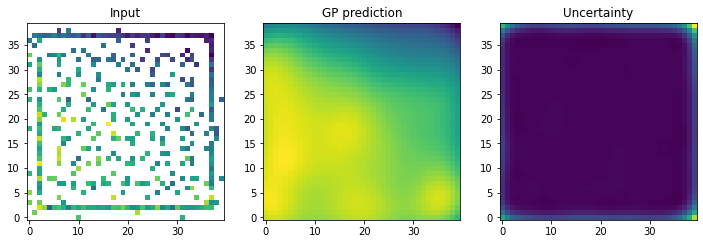

Step 273


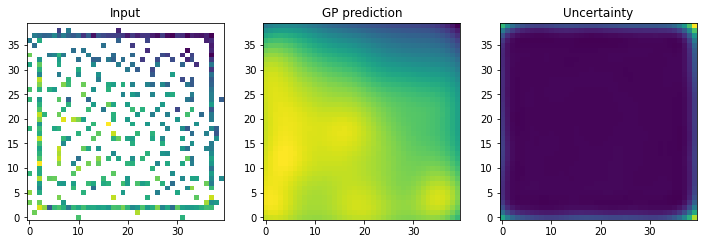

Step 274


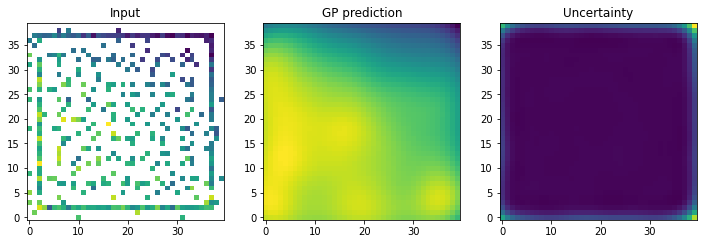

Step 275


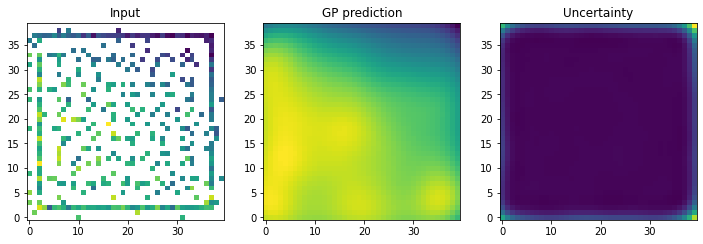

Step 276


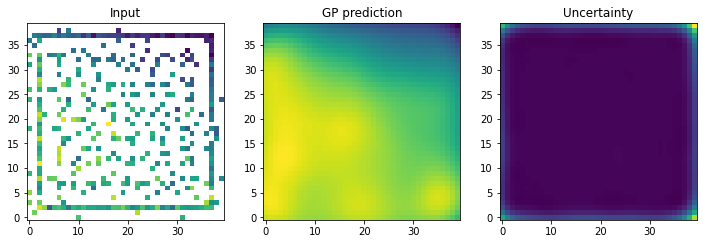

Step 277


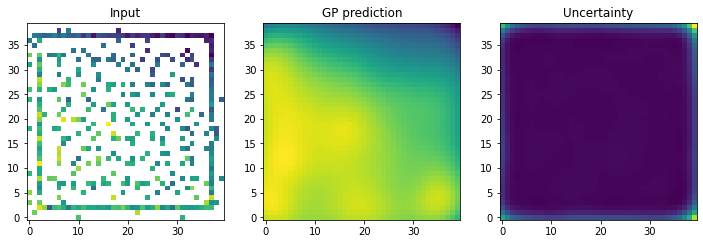

Step 278


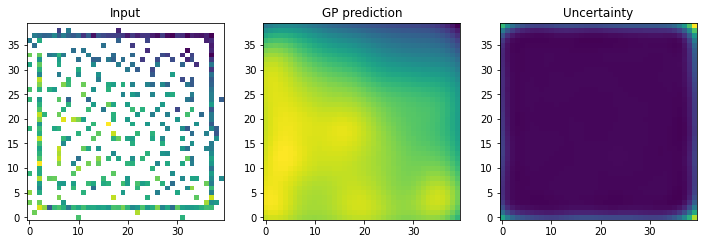

Step 279


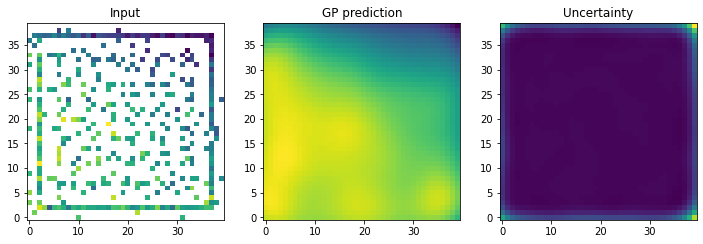

Step 280


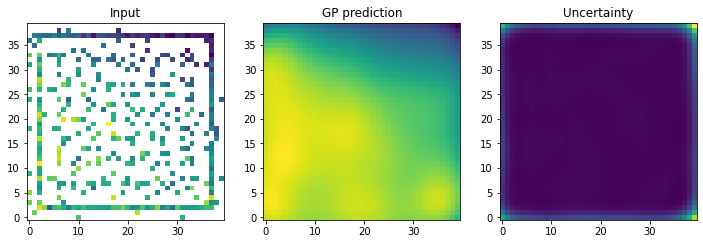

Step 281


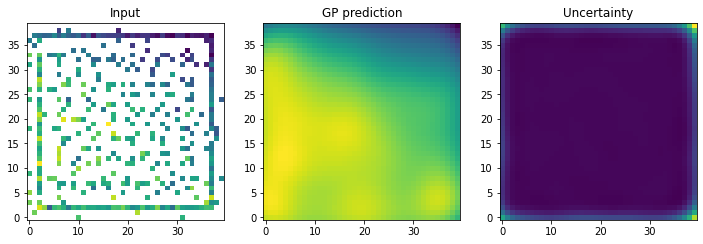

Step 282


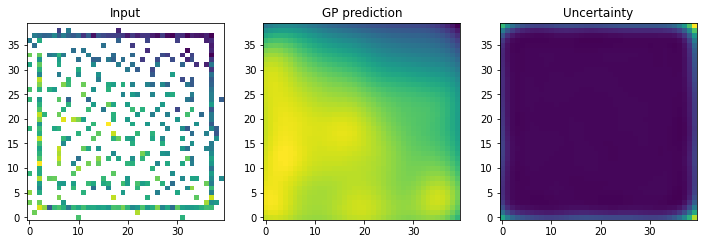

Step 283


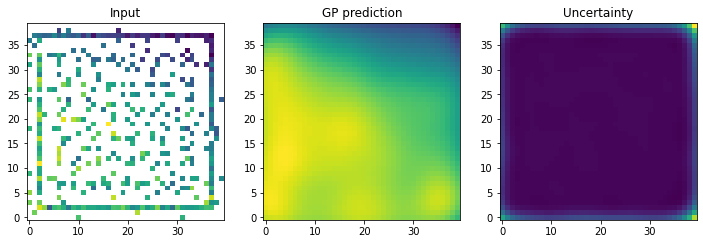

Step 284


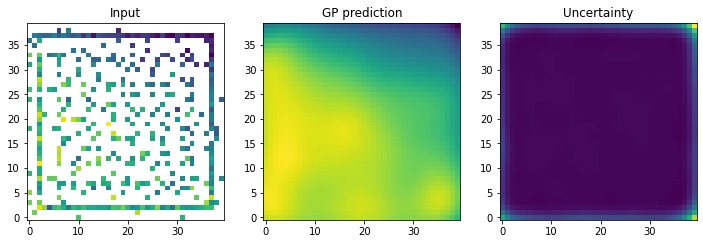

Step 285


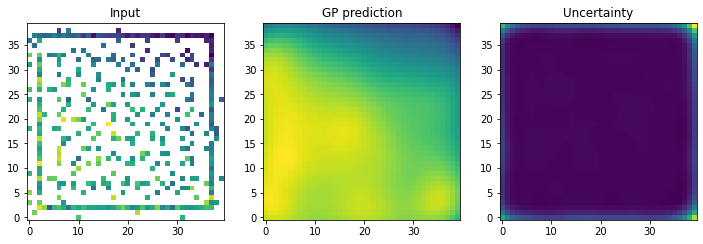

Step 286


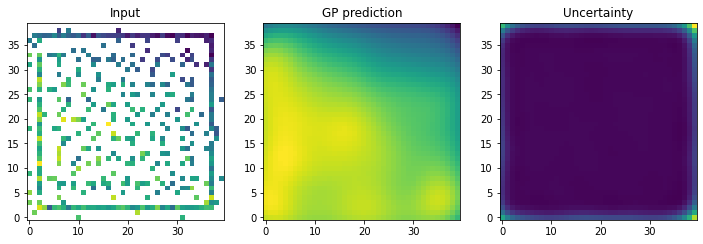

Step 287


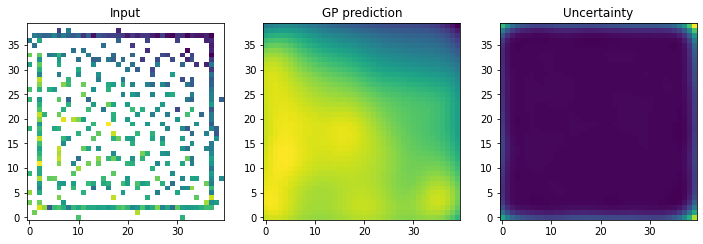

Step 288


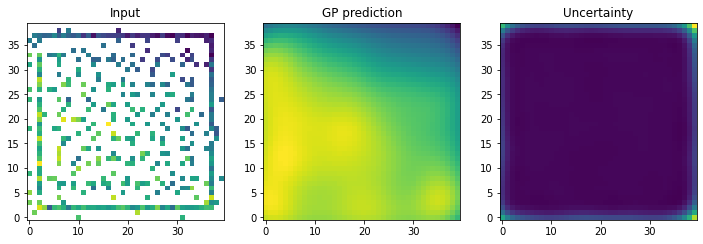

Step 289


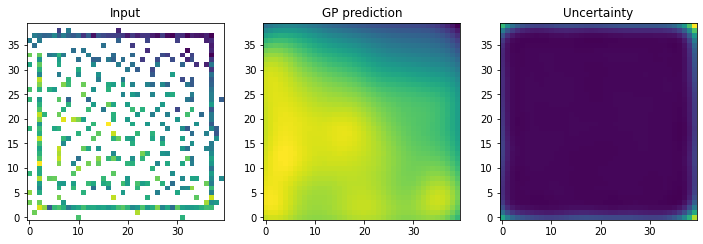

Step 290


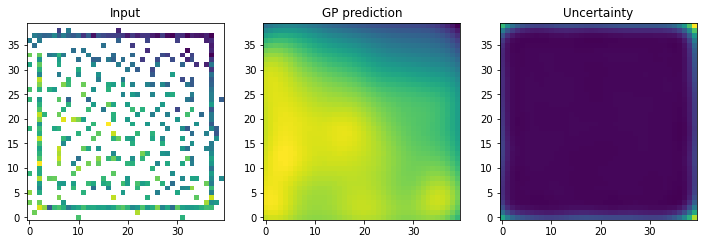

Step 291


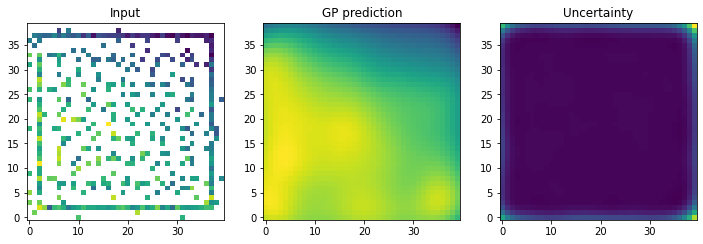

Step 292


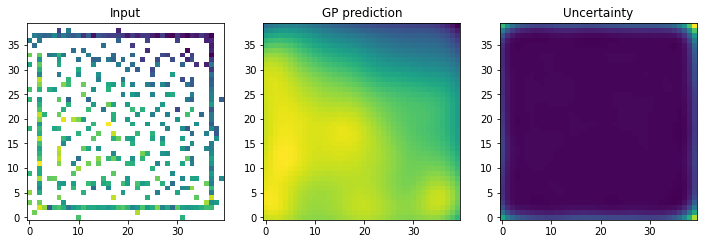

Step 293


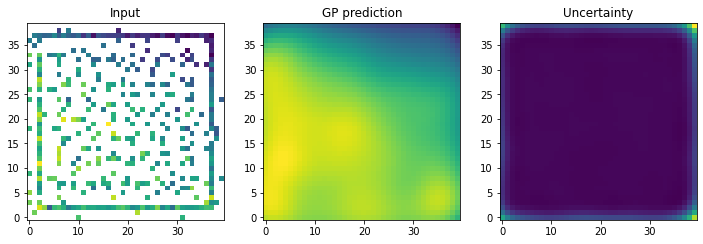

Step 294


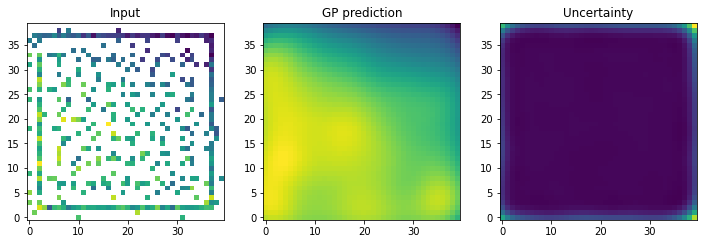

Step 295


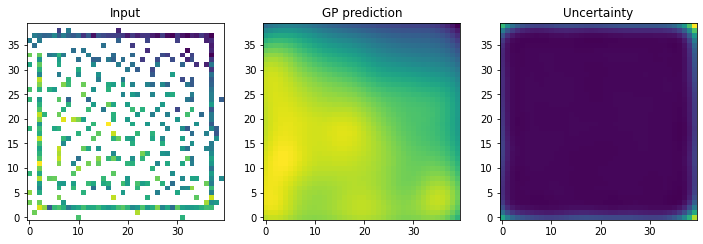

Step 296


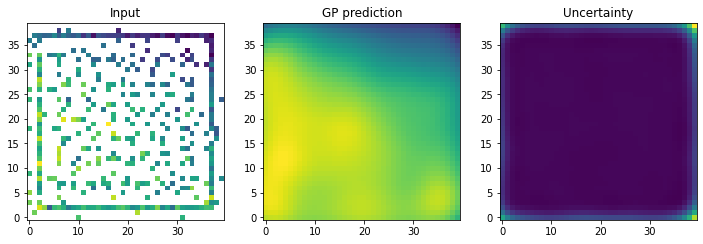

Step 297


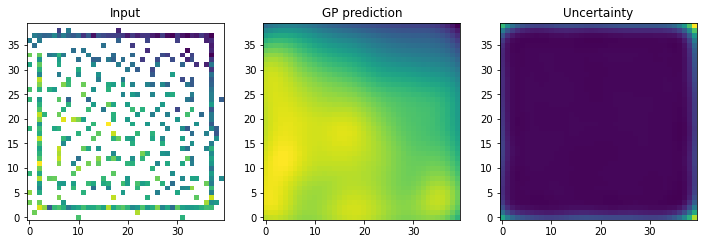

Step 298


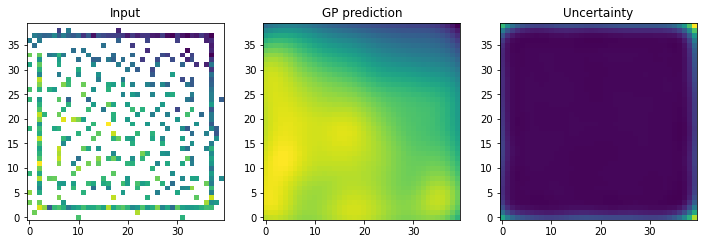

Step 299


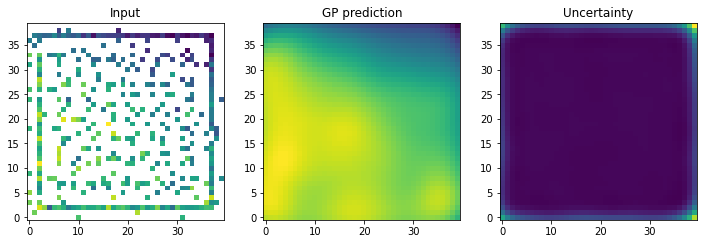

Step 300


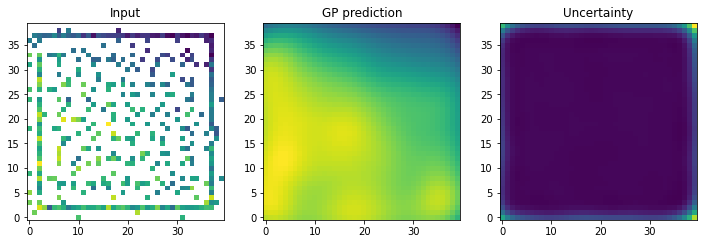

In [ ]:
plot_exploration_results(boptim.target_func_vals, boptim.gp_predictions)